# **PROJECT STATEMENT**



The main aim of this project is to forecast covid-19 cases and deaths using time series analysis.
The project ims to evaluate the performance of popular models like Arima and prophet model to forecast covid-19 cases and deaths in the UK.

In the cell below i import all the libraries that would be used in this analysis

#import libraries

In [1]:
#Importing libraries
import pandas as pd
import matplotlib.pyplot as plt
import seaborn as sns
from datetime import datetime
import plotly.express as px
from statsmodels.tsa.seasonal import seasonal_decompose
from pandas.plotting import autocorrelation_plot
from sklearn.model_selection import ParameterGrid
import numpy as np
from statsmodels.graphics.tsaplots import plot_acf, plot_pacf
from statsmodels.tsa.stattools import adfuller
import warnings
from statsmodels.tsa.arima.model import ARIMA

from statsmodels.tsa.seasonal import seasonal_decompose
from datetime import date, timedelta
from sklearn.metrics import mean_squared_error, mean_absolute_error
from prophet import Prophet
import tensorflow as tf
from tensorflow import keras
from tensorflow.keras.models import Sequential
from tensorflow.keras.layers import Dense, LSTM, Conv1D
warnings.filterwarnings("ignore")

C:\Users\HP\anaconda3\lib\site-packages\scipy\__init__.py:155: UserWarning: A NumPy version >=1.18.5 and <1.25.0 is required for this version of SciPy (detected version 1.26.2
  warnings.warn(f"A NumPy version >={np_minversion} and <{np_maxversion}"


#load dataset

Reading in the csv with pandas

In [2]:
#using pandas to read the csv
data = pd.read_csv('OxCGRT_simplified_v1.csv')

#Data exploration

Viewing the dataset to see an overview of the data

In [3]:
#viewing the dataset
data

,CountryName,CountryCode,RegionName,RegionCode,Jurisdiction,Date,C1M_combined_numeric,C1M_combined,C2M_combined_numeric,C2M_combined,...,V3..summary.,V4..summary.,ConfirmedCases,ConfirmedDeaths,MajorityVaccinated,PopulationVaccinated,StringencyIndex_Average,GovernmentResponseIndex_Average,ContainmentHealthIndex_Average,EconomicSupportIndex
0,Aruba,ABW,NaN,NaN,NAT_TOTAL,20200101,0.0,0,0.0,0,...,0,NaN,0.0,0.0,NV,0.0,0.00,0.00,0.00,0.0
1,Aruba,ABW,NaN,NaN,NAT_TOTAL,20200102,0.0,0,0.0,0,...,0,NaN,0.0,0.0,NV,0.0,0.00,0.00,0.00,0.0
2,Aruba,ABW,NaN,NaN,NAT_TOTAL,20200103,0.0,0,0.0,0,...,0,NaN,0.0,0.0,NV,0.0,0.00,0.00,0.00,0.0
3,Aruba,ABW,NaN,NaN,NAT_TOTAL,20200104,0.0,0,0.0,0,...,0,NaN,0.0,0.0,NV,0.0,0.00,0.00,0.00,0.0
4,Aruba,ABW,NaN,NaN,NAT_TOTAL,20200105,0.0,0,0.0,0,...,0,NaN,0.0,0.0,NV,0.0,0.00,0.00,0.00,0.0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
390904,Zimbabwe,ZWE,NaN,NaN,NAT_TOTAL,20221227,1.0,1G,2.0,2G,...,5,1.0,259981.0,5637.0,NV,29.11,29.48,36.44,41.65,0.0
390905,Zimbabwe,ZWE,NaN,NaN,NAT_TOTAL,20221228,1.0,1G,2.0,2G,...,5,1.0,259981.0,5637.0,NV,29.11,29.48,36.44,41.65,0.0
390906,Zimbabwe,ZWE,NaN,NaN,NAT_TOTAL,20221229,1.0,1G,2.0,2G,...,5,1.0,259981.0,5637.0,NV,29.11,29.48,36.44,41.65,0.0
390907,Zimbabwe,ZWE,NaN,NaN,NAT_TOTAL,20221230,1.0,1G,2.0,2G,...,5,1.0,259981.0,5637.0,NV,29.11,29.48,36.44,41.65,0.0


In [4]:
#describing the dataset
data.describe()

,Date,C1M_combined_numeric,C2M_combined_numeric,C3M_combined_numeric,C4M_combined_numeric,C5M_combined_numeric,C6M_combined_numeric,C7M_combined_numeric,C8EV_combined_numeric,C8EV_combined,...,V1..summary.,V2..summary.,V3..summary.,V4..summary.,ConfirmedCases,ConfirmedDeaths,StringencyIndex_Average,GovernmentResponseIndex_Average,ContainmentHealthIndex_Average,EconomicSupportIndex
count,3.909090e+05,390909.000000,390909.000000,390909.000000,390909.000000,390909.000000,390909.000000,390909.000000,390909.000000,390909.000000,...,390909.000000,390909.000000,390909.000000,279104.000000,3.895880e+05,3.892980e+05,390909.000000,390909.000000,390909.000000,390909.000000
mean,2.021075e+07,1.219229,1.053119,1.003827,1.802155,0.385077,0.658942,0.655866,2.091019,2.091019,...,1.125438,1.516637,3.190888,0.226152,9.669523e+05,1.413637e+04,43.943621,46.988849,49.042134,32.616159
std,8.263362e+03,1.074955,0.925103,0.804264,1.651696,0.588933,0.810806,0.772494,1.295538,1.295538,...,0.891086,1.310980,2.383139,0.418340,4.146449e+06,5.625869e+04,24.544106,19.281962,19.638901,30.589705
min,2.020010e+07,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,...,0.000000,0.000000,0.000000,0.000000,0.000000e+00,0.000000e+00,0.000000,0.000000,0.000000,0.000000
25%,2.020100e+07,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,1.000000,1.000000,...,0.000000,0.000000,0.000000,0.000000,2.420000e+03,2.000000e+01,22.650000,34.460000,36.790000,0.000000
50%,2.021070e+07,1.000000,1.000000,1.000000,2.000000,0.000000,0.000000,0.000000,2.000000,2.000000,...,1.000000,2.000000,5.000000,0.000000,6.894650e+04,1.043000e+03,44.440000,49.480000,51.190000,25.000000
75%,2.022040e+07,2.000000,2.000000,2.000000,3.500000,1.000000,1.000000,1.500000,3.000000,3.000000,...,2.000000,3.000000,5.000000,0.000000,5.493240e+05,8.120000e+03,62.960000,61.460000,63.690000,50.000000
max,2.023023e+07,3.000000,3.000000,2.000000,4.000000,2.000000,3.000000,2.000000,4.000000,4.000000,...,2.000000,3.000000,5.000000,1.000000,1.007653e+08,1.092764e+06,100.000000,92.190000,98.210000,100.000000


I checked the number of countries in the dataset

In [5]:
data.CountryCode.nunique()

185

The scope of the project is limited to the UK so I queried the data to extract the Uk data from the entire dataset

In [6]:
#querying the dataset to only have the UK data
uk_data = data.query('CountryCode == "GBR"').reset_index(drop=True)

Checking the dataset to view the uk data that has been extracted from the dataset. From the head, I can see that the first date that the data was collected was Jan 1st 2020

In [7]:
uk_data.head()

,CountryName,CountryCode,RegionName,RegionCode,Jurisdiction,Date,C1M_combined_numeric,C1M_combined,C2M_combined_numeric,C2M_combined,...,V3..summary.,V4..summary.,ConfirmedCases,ConfirmedDeaths,MajorityVaccinated,PopulationVaccinated,StringencyIndex_Average,GovernmentResponseIndex_Average,ContainmentHealthIndex_Average,EconomicSupportIndex
0,United Kingdom,GBR,NaN,NaN,NAT_TOTAL,20200101,0.0,0,0.0,0,...,0,NaN,0.0,0.0,NV,0.0,0.0,0.0,0.0,0.0
1,United Kingdom,GBR,NaN,NaN,NAT_TOTAL,20200102,0.0,0,0.0,0,...,0,NaN,0.0,0.0,NV,0.0,0.0,0.0,0.0,0.0
2,United Kingdom,GBR,NaN,NaN,NAT_TOTAL,20200103,0.0,0,0.0,0,...,0,NaN,0.0,0.0,NV,0.0,0.0,0.0,0.0,0.0
3,United Kingdom,GBR,NaN,NaN,NAT_TOTAL,20200104,0.0,0,0.0,0,...,0,NaN,0.0,0.0,NV,0.0,0.0,0.0,0.0,0.0
4,United Kingdom,GBR,NaN,NaN,NAT_TOTAL,20200105,0.0,0,0.0,0,...,0,NaN,0.0,0.0,NV,0.0,0.0,0.0,0.0,0.0


Inspecting information on the columns of the dataframe, datatype and the null values in the dataset

In [8]:
#looking at the data info to identify all columns and null values
uk_data.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 5480 entries, 0 to 5479
Data columns (total 50 columns):
 #   Column                           Non-Null Count  Dtype  
---  ------                           --------------  -----  
 0   CountryName                      5480 non-null   object 
 1   CountryCode                      5480 non-null   object 
 2   RegionName                       4384 non-null   object 
 3   RegionCode                       4384 non-null   object 
 4   Jurisdiction                     5480 non-null   object 
 5   Date                             5480 non-null   int64  
 6   C1M_combined_numeric             5480 non-null   float64
 7   C1M_combined                     5480 non-null   object 
 8   C2M_combined_numeric             5480 non-null   float64
 9   C2M_combined                     5480 non-null   object 
 10  C3M_combined_numeric             5480 non-null   float64
 11  C3M_combined                     5480 non-null   object 
 12  C4M_combined_numeric

checking the sum of null values in each of the columns in the dataset.

In [9]:
uk_data.isna().sum()

CountryName                           0
CountryCode                           0
RegionName                         1096
RegionCode                         1096
Jurisdiction                          0
Date                                  0
C1M_combined_numeric                  0
C1M_combined                          0
C2M_combined_numeric                  0
C2M_combined                          0
C3M_combined_numeric                  0
C3M_combined                          0
C4M_combined_numeric                  0
C4M_combined                          0
C5M_combined_numeric                  0
C5M_combined                          0
C6M_combined_numeric                  0
C6M_combined                          0
C7M_combined_numeric                  0
C7M_combined                          0
C8EV_combined_numeric                 0
C8EV_combined                         0
E1_combined_numeric                   0
E1_combined                           0
E2_combined_numeric                   0


Checking the number of rows and columns in the dataset

In [10]:
uk_data.shape

(5480, 50)

#Data cleaning

Dropping columns that has the same information as other columns in the dataset

In [11]:
uk_data = uk_data.drop(columns=['CountryCode', 'CountryName', 'RegionCode', 'C1M_combined', 'C2M_combined',
                                'C3M_combined', 'C4M_combined', 'C5M_combined', 'C6M_combined', 'C7M_combined',
                                'C8EV_combined', 'E1_combined', 'E2_combined', 'H1_combined', 'H2_combined', 'H3_combined',
                                'H6M_combined', 'H7_combined','H8M_combined'])

Checking the head of the dataset to see if the drop has been effected, now the number of columns has been reduced from 50 to 31 columns.

In [12]:
uk_data.head()

,RegionName,Jurisdiction,Date,C1M_combined_numeric,C2M_combined_numeric,C3M_combined_numeric,C4M_combined_numeric,C5M_combined_numeric,C6M_combined_numeric,C7M_combined_numeric,...,V3..summary.,V4..summary.,ConfirmedCases,ConfirmedDeaths,MajorityVaccinated,PopulationVaccinated,StringencyIndex_Average,GovernmentResponseIndex_Average,ContainmentHealthIndex_Average,EconomicSupportIndex
0,NaN,NAT_TOTAL,20200101,0.0,0.0,0.0,0.0,0.0,0.0,0.0,...,0,NaN,0.0,0.0,NV,0.0,0.0,0.0,0.0,0.0
1,NaN,NAT_TOTAL,20200102,0.0,0.0,0.0,0.0,0.0,0.0,0.0,...,0,NaN,0.0,0.0,NV,0.0,0.0,0.0,0.0,0.0
2,NaN,NAT_TOTAL,20200103,0.0,0.0,0.0,0.0,0.0,0.0,0.0,...,0,NaN,0.0,0.0,NV,0.0,0.0,0.0,0.0,0.0
3,NaN,NAT_TOTAL,20200104,0.0,0.0,0.0,0.0,0.0,0.0,0.0,...,0,NaN,0.0,0.0,NV,0.0,0.0,0.0,0.0,0.0
4,NaN,NAT_TOTAL,20200105,0.0,0.0,0.0,0.0,0.0,0.0,0.0,...,0,NaN,0.0,0.0,NV,0.0,0.0,0.0,0.0,0.0


Having realized that the RegionName has a total of 1096 and i suspected that it was in the NAT_Total jurisdiction so i checked the info for the NAT_TOTAL jusrisdiction

In [13]:
uk_data.query('Jurisdiction == "NAT_TOTAL"').info()

<class 'pandas.core.frame.DataFrame'>
Int64Index: 1096 entries, 0 to 1095
Data columns (total 31 columns):
 #   Column                           Non-Null Count  Dtype  
---  ------                           --------------  -----  
 0   RegionName                       0 non-null      object 
 1   Jurisdiction                     1096 non-null   object 
 2   Date                             1096 non-null   int64  
 3   C1M_combined_numeric             1096 non-null   float64
 4   C2M_combined_numeric             1096 non-null   float64
 5   C3M_combined_numeric             1096 non-null   float64
 6   C4M_combined_numeric             1096 non-null   float64
 7   C5M_combined_numeric             1096 non-null   float64
 8   C6M_combined_numeric             1096 non-null   float64
 9   C7M_combined_numeric             1096 non-null   float64
 10  C8EV_combined_numeric            1096 non-null   int64  
 11  E1_combined_numeric              1096 non-null   float64
 12  E2_combined_numeric 

After noticing that the null values was in the RegionName was in the jurisdiction NAT_TOTAL, I decided to fill the null values with the word NATIONAL

In [14]:
uk_data['RegionName'] = uk_data['RegionName'].fillna('National')

Because V4..Summary is reporting about if vaccination was compulsory for some groups or not. Null means there was no data during that period, 0 means that vaccination wasn't compulsory and 1 means that vaccination was compulsory for some groups.
Therefore, I decided to fill the nulls with -1 to ensure that the data still reflects that there was a time where there was no talks about vaccination.

In [15]:
uk_data['V4..summary.'] =  uk_data['V4..summary.'].fillna(-1)

Below I checked if there was any null values in the dataset

In [16]:
uk_data.isna().sum()

RegionName                           0
Jurisdiction                         0
Date                                 0
C1M_combined_numeric                 0
C2M_combined_numeric                 0
C3M_combined_numeric                 0
C4M_combined_numeric                 0
C5M_combined_numeric                 0
C6M_combined_numeric                 0
C7M_combined_numeric                 0
C8EV_combined_numeric                0
E1_combined_numeric                  0
E2_combined_numeric                  0
H1_combined_numeric                  0
H2_combined_numeric                  0
H3_combined_numeric                  0
H6M_combined_numeric                 0
H7_combined_numeric                  0
H8M_combined_numeric                 0
V1..summary.                         0
V2..summary.                         0
V3..summary.                         0
V4..summary.                         0
ConfirmedCases                     225
ConfirmedDeaths                    515
MajorityVaccinated       

describing the values i the national region of the uk

In [17]:
uk_data.query('Jurisdiction == "NAT_TOTAL"').describe()

,Date,C1M_combined_numeric,C2M_combined_numeric,C3M_combined_numeric,C4M_combined_numeric,C5M_combined_numeric,C6M_combined_numeric,C7M_combined_numeric,C8EV_combined_numeric,E1_combined_numeric,...,V1..summary.,V2..summary.,V3..summary.,V4..summary.,ConfirmedCases,ConfirmedDeaths,StringencyIndex_Average,GovernmentResponseIndex_Average,ContainmentHealthIndex_Average,EconomicSupportIndex
count,1.096000e+03,1096.000000,1096.000000,1096.000000,1096.000000,1096.000000,1096.000000,1096.000000,1096.000000,1096.000000,...,1096.000000,1096.000000,1096.000000,1096.000000,1.096000e+03,1096.000000,1096.000000,1096.000000,1096.000000,1096.000000
mean,2.021066e+07,1.072080,1.290146,1.039234,2.222628,0.567974,0.437044,0.575730,1.437956,1.019161,...,1.206204,1.670620,3.427920,-0.364964,9.463650e+06,132770.101277,43.068869,47.947162,46.683385,56.797445
std,8.178333e+03,1.022043,1.046950,0.853579,1.756444,0.428106,0.690547,0.778838,1.309530,0.998217,...,0.881778,1.336558,2.312228,0.616378,9.276835e+06,69028.549460,27.874508,23.848267,21.405956,44.921764
min,2.020010e+07,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,...,0.000000,0.000000,0.000000,-1.000000,0.000000e+00,0.000000,0.000000,0.000000,0.000000,0.000000
25%,2.020098e+07,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,...,0.000000,0.000000,0.000000,-1.000000,4.584495e+05,58838.250000,11.110000,23.700000,27.080000,0.000000
50%,2.021070e+07,1.000000,1.500000,1.000000,2.500000,0.500000,0.000000,0.000000,2.000000,2.000000,...,2.000000,2.000000,5.000000,0.000000,4.841816e+06,154762.000000,43.650000,56.250000,51.570000,100.000000
75%,2.022040e+07,1.500000,2.000000,2.000000,4.000000,1.000000,0.500000,1.500000,3.000000,2.000000,...,2.000000,3.000000,5.000000,0.000000,2.121687e+07,192681.500000,67.590000,67.202500,62.515000,100.000000
max,2.022123e+07,3.000000,3.000000,2.000000,4.000000,1.000000,2.000000,2.000000,3.000000,2.000000,...,2.000000,3.000000,5.000000,1.000000,2.413508e+07,216306.000000,87.960000,83.960000,81.670000,100.000000


In [18]:
#finding the maximum number of confirmed cases recorded at the National level
uk_data.query('Jurisdiction == "NAT_TOTAL"')['ConfirmedCases'].max()

24135080.0

The datatype of the date column was an object, I decided to change to a datetime column to ensure that I could perform date related operation on the column if and whe necessary

In [19]:
#changing the date datatype from integer to a datetime object
uk_data['Date'] = pd.to_datetime(uk_data['Date'], format='%Y%m%d')
uk_data.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 5480 entries, 0 to 5479
Data columns (total 31 columns):
 #   Column                           Non-Null Count  Dtype         
---  ------                           --------------  -----         
 0   RegionName                       5480 non-null   object        
 1   Jurisdiction                     5480 non-null   object        
 2   Date                             5480 non-null   datetime64[ns]
 3   C1M_combined_numeric             5480 non-null   float64       
 4   C2M_combined_numeric             5480 non-null   float64       
 5   C3M_combined_numeric             5480 non-null   float64       
 6   C4M_combined_numeric             5480 non-null   float64       
 7   C5M_combined_numeric             5480 non-null   float64       
 8   C6M_combined_numeric             5480 non-null   float64       
 9   C7M_combined_numeric             5480 non-null   float64       
 10  C8EV_combined_numeric            5480 non-null   int64      

I checked the unique values in the jurisdiction column to be sure that the data collected only reported national and state data and to be sure that the data dictionary was accurate

In [20]:
uk_data['Jurisdiction'].unique()

array(['NAT_TOTAL', 'STATE_TOTAL'], dtype=object)

I checked the Majority vaccinated columns to see the possible scenarios

In [21]:
uk_data['MajorityVaccinated'].unique()

array(['NV', 'V'], dtype=object)

I checked the population vaccination to see if population vaccinated is categorical

In [22]:
uk_data['PopulationVaccinated'].unique()

array([0.0, 0.58, 0.61, ..., 77.86, 77.94, 77.95], dtype=object)

I described the data to see the minimum and maximum of the columns

In [23]:
uk_data.describe()

,C1M_combined_numeric,C2M_combined_numeric,C3M_combined_numeric,C4M_combined_numeric,C5M_combined_numeric,C6M_combined_numeric,C7M_combined_numeric,C8EV_combined_numeric,E1_combined_numeric,E2_combined_numeric,...,V1..summary.,V2..summary.,V3..summary.,V4..summary.,ConfirmedCases,ConfirmedDeaths,StringencyIndex_Average,GovernmentResponseIndex_Average,ContainmentHealthIndex_Average,EconomicSupportIndex
count,5480.000000,5480.000000,5480.000000,5480.000000,5480.000000,5480.000000,5480.000000,5480.000000,5480.000000,5480.000000,...,5480.000000,5480.00000,5480.000000,5480.000000,5.255000e+03,4965.000000,5480.000000,5480.000000,5480.000000,5480.000000
mean,1.041606,1.237500,1.002007,2.012409,0.514142,0.434763,0.536223,1.425547,1.061496,1.202190,...,1.206204,1.67062,3.437409,-0.013869,3.916159e+06,53499.231420,41.402179,46.983746,45.611370,56.592153
std,1.044153,1.128991,0.891799,1.904628,0.487226,0.722734,0.792781,1.308405,0.964157,0.883626,...,0.881456,1.33607,2.315762,0.401890,6.911132e+06,70170.762557,28.543072,24.454533,22.078712,45.168275
min,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,...,0.000000,0.00000,0.000000,-1.000000,0.000000e+00,0.000000,0.000000,0.000000,0.000000,0.000000
25%,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,...,0.000000,0.00000,0.000000,0.000000,1.045135e+05,2488.000000,11.110000,20.570000,22.620000,0.000000
50%,1.000000,1.000000,1.000000,3.000000,0.500000,0.000000,0.000000,2.000000,2.000000,2.000000,...,2.000000,2.00000,5.000000,0.000000,5.010280e+05,7713.000000,43.980000,51.560000,51.790000,100.000000
75%,1.000000,2.000000,2.000000,4.000000,1.000000,1.000000,1.000000,3.000000,2.000000,2.000000,...,2.000000,3.00000,5.000000,0.000000,3.848042e+06,113378.000000,66.200000,68.020000,63.450000,100.000000
max,3.000000,3.000000,2.000000,4.000000,1.000000,2.000000,2.000000,3.000000,2.000000,2.000000,...,2.000000,3.00000,5.000000,1.000000,2.413508e+07,216306.000000,87.960000,86.770000,84.880000,100.000000


I am back to dealing with the null values that i have already identified. Below i am checking the null values in the dataset and have an idea of where the null values lies.

In [24]:
uk_data[uk_data.isna().any(axis=1)]

,RegionName,Jurisdiction,Date,C1M_combined_numeric,C2M_combined_numeric,C3M_combined_numeric,C4M_combined_numeric,C5M_combined_numeric,C6M_combined_numeric,C7M_combined_numeric,...,V3..summary.,V4..summary.,ConfirmedCases,ConfirmedDeaths,MajorityVaccinated,PopulationVaccinated,StringencyIndex_Average,GovernmentResponseIndex_Average,ContainmentHealthIndex_Average,EconomicSupportIndex
1126,England,STATE_TOTAL,2020-01-31,0.0,0.0,0.0,0.0,0.0,0.0,0.0,...,0,0.0,2.0,NaN,NV,0.0,5.56,11.46,13.10,0.0
1127,England,STATE_TOTAL,2020-02-01,0.0,0.0,0.0,0.0,0.0,0.0,0.0,...,0,0.0,2.0,NaN,NV,0.0,5.56,11.46,13.10,0.0
1128,England,STATE_TOTAL,2020-02-02,0.0,0.0,0.0,0.0,0.0,0.0,0.0,...,0,0.0,2.0,NaN,NV,0.0,11.11,14.58,16.67,0.0
1129,England,STATE_TOTAL,2020-02-03,0.0,0.0,0.0,0.0,0.0,0.0,0.0,...,0,0.0,2.0,NaN,NV,0.0,11.11,14.58,16.67,0.0
1130,England,STATE_TOTAL,2020-02-04,0.0,0.0,0.0,0.0,0.0,0.0,0.0,...,0,0.0,2.0,NaN,NV,0.0,11.11,14.58,16.67,0.0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
4455,Wales,STATE_TOTAL,2020-03-12,0.0,0.0,0.0,0.0,0.0,0.0,0.0,...,0,0.0,25.0,NaN,NV,0.0,11.11,11.46,13.10,0.0
4456,Wales,STATE_TOTAL,2020-03-13,0.0,0.0,0.0,0.0,0.0,0.0,0.0,...,0,0.0,38.0,NaN,NV,0.0,11.11,11.46,13.10,0.0
4457,Wales,STATE_TOTAL,2020-03-14,0.0,0.0,0.0,0.0,0.0,0.0,0.0,...,0,0.0,60.0,NaN,NV,0.0,11.11,11.46,13.10,0.0
4458,Wales,STATE_TOTAL,2020-03-15,0.0,0.0,0.0,0.0,0.0,0.0,0.0,...,0,0.0,94.0,NaN,NV,0.0,11.11,11.46,13.10,0.0


I went ahead to check all the unique values in the region name column to see what regions the dataset contains

In [25]:
uk_data['RegionName'].unique()

array(['National', 'England', 'Northern Ireland', 'Scotland', 'Wales'],
      dtype=object)

I went ahead to split the data set into the different regions in the dataset.

In [26]:
national = uk_data.query('RegionName == "National"')#querying the dataset to store only data that corresponds with the national data
england = uk_data.query('RegionName == "England"')#querying the dataset to store only data that corresponds with england data
ireland = uk_data.query('RegionName == "Northern Ireland"')#querying the dataset to store only data that corresponds with ireland data
scotland = uk_data.query('RegionName == "Scotland"')#querying the dataset to store only data that corresponds with scotland data
wales = uk_data.query('RegionName == "Wales"')#querying the dataset to store only data that corresponds with wales data


I went ahead check the sum of the null values in the national dataset

In [27]:
national.isna().sum()

RegionName                         0
Jurisdiction                       0
Date                               0
C1M_combined_numeric               0
C2M_combined_numeric               0
C3M_combined_numeric               0
C4M_combined_numeric               0
C5M_combined_numeric               0
C6M_combined_numeric               0
C7M_combined_numeric               0
C8EV_combined_numeric              0
E1_combined_numeric                0
E2_combined_numeric                0
H1_combined_numeric                0
H2_combined_numeric                0
H3_combined_numeric                0
H6M_combined_numeric               0
H7_combined_numeric                0
H8M_combined_numeric               0
V1..summary.                       0
V2..summary.                       0
V3..summary.                       0
V4..summary.                       0
ConfirmedCases                     0
ConfirmedDeaths                    0
MajorityVaccinated                 0
PopulationVaccinated               0
S

From the above cell, I can see that there are no null values, I then checked the head of the dataset to view the national dataset

In [28]:
national.head()

,RegionName,Jurisdiction,Date,C1M_combined_numeric,C2M_combined_numeric,C3M_combined_numeric,C4M_combined_numeric,C5M_combined_numeric,C6M_combined_numeric,C7M_combined_numeric,...,V3..summary.,V4..summary.,ConfirmedCases,ConfirmedDeaths,MajorityVaccinated,PopulationVaccinated,StringencyIndex_Average,GovernmentResponseIndex_Average,ContainmentHealthIndex_Average,EconomicSupportIndex
0,National,NAT_TOTAL,2020-01-01,0.0,0.0,0.0,0.0,0.0,0.0,0.0,...,0,-1.0,0.0,0.0,NV,0.0,0.0,0.0,0.0,0.0
1,National,NAT_TOTAL,2020-01-02,0.0,0.0,0.0,0.0,0.0,0.0,0.0,...,0,-1.0,0.0,0.0,NV,0.0,0.0,0.0,0.0,0.0
2,National,NAT_TOTAL,2020-01-03,0.0,0.0,0.0,0.0,0.0,0.0,0.0,...,0,-1.0,0.0,0.0,NV,0.0,0.0,0.0,0.0,0.0
3,National,NAT_TOTAL,2020-01-04,0.0,0.0,0.0,0.0,0.0,0.0,0.0,...,0,-1.0,0.0,0.0,NV,0.0,0.0,0.0,0.0,0.0
4,National,NAT_TOTAL,2020-01-05,0.0,0.0,0.0,0.0,0.0,0.0,0.0,...,0,-1.0,0.0,0.0,NV,0.0,0.0,0.0,0.0,0.0


below i am checking the null values in the england data set

In [29]:
england.isna().sum()

RegionName                          0
Jurisdiction                        0
Date                                0
C1M_combined_numeric                0
C2M_combined_numeric                0
C3M_combined_numeric                0
C4M_combined_numeric                0
C5M_combined_numeric                0
C6M_combined_numeric                0
C7M_combined_numeric                0
C8EV_combined_numeric               0
E1_combined_numeric                 0
E2_combined_numeric                 0
H1_combined_numeric                 0
H2_combined_numeric                 0
H3_combined_numeric                 0
H6M_combined_numeric                0
H7_combined_numeric                 0
H8M_combined_numeric                0
V1..summary.                        0
V2..summary.                        0
V3..summary.                        0
V4..summary.                        0
ConfirmedCases                      0
ConfirmedDeaths                    35
MajorityVaccinated                  0
PopulationVa

After noticing that there are 35 null values in the ConfirmedDeaths columns below I am trying to print out where the null values exist



In [30]:
england[england.isna().any(axis=1)]

,RegionName,Jurisdiction,Date,C1M_combined_numeric,C2M_combined_numeric,C3M_combined_numeric,C4M_combined_numeric,C5M_combined_numeric,C6M_combined_numeric,C7M_combined_numeric,...,V3..summary.,V4..summary.,ConfirmedCases,ConfirmedDeaths,MajorityVaccinated,PopulationVaccinated,StringencyIndex_Average,GovernmentResponseIndex_Average,ContainmentHealthIndex_Average,EconomicSupportIndex
1126,England,STATE_TOTAL,2020-01-31,0.0,0.0,0.0,0.0,0.0,0.0,0.0,...,0,0.0,2.0,NaN,NV,0.0,5.56,11.46,13.10,0.0
1127,England,STATE_TOTAL,2020-02-01,0.0,0.0,0.0,0.0,0.0,0.0,0.0,...,0,0.0,2.0,NaN,NV,0.0,5.56,11.46,13.10,0.0
1128,England,STATE_TOTAL,2020-02-02,0.0,0.0,0.0,0.0,0.0,0.0,0.0,...,0,0.0,2.0,NaN,NV,0.0,11.11,14.58,16.67,0.0
1129,England,STATE_TOTAL,2020-02-03,0.0,0.0,0.0,0.0,0.0,0.0,0.0,...,0,0.0,2.0,NaN,NV,0.0,11.11,14.58,16.67,0.0
1130,England,STATE_TOTAL,2020-02-04,0.0,0.0,0.0,0.0,0.0,0.0,0.0,...,0,0.0,2.0,NaN,NV,0.0,11.11,14.58,16.67,0.0
1131,England,STATE_TOTAL,2020-02-05,0.0,0.0,0.0,0.0,0.0,0.0,0.0,...,0,0.0,2.0,NaN,NV,0.0,11.11,14.58,16.67,0.0
1132,England,STATE_TOTAL,2020-02-06,0.0,0.0,0.0,0.0,0.0,0.0,0.0,...,0,0.0,3.0,NaN,NV,0.0,11.11,14.58,16.67,0.0
1133,England,STATE_TOTAL,2020-02-07,0.0,0.0,0.0,0.0,0.0,0.0,0.0,...,0,0.0,3.0,NaN,NV,0.0,11.11,14.58,16.67,0.0
1134,England,STATE_TOTAL,2020-02-08,0.0,0.0,0.0,0.0,0.0,0.0,0.0,...,0,0.0,3.0,NaN,NV,0.0,11.11,14.58,16.67,0.0
1135,England,STATE_TOTAL,2020-02-09,0.0,0.0,0.0,0.0,0.0,0.0,0.0,...,0,0.0,4.0,NaN,NV,0.0,11.11,14.58,16.67,0.0


I was trying to make sure that there was no duplicate in the dataset

In [31]:
england.duplicated().sum()

0

I am trying to print the the dataset prior to where the first null value is found to see what the confirmed deths was before there was null values

In [32]:
england.iloc[10:35]

,RegionName,Jurisdiction,Date,C1M_combined_numeric,C2M_combined_numeric,C3M_combined_numeric,C4M_combined_numeric,C5M_combined_numeric,C6M_combined_numeric,C7M_combined_numeric,...,V3..summary.,V4..summary.,ConfirmedCases,ConfirmedDeaths,MajorityVaccinated,PopulationVaccinated,StringencyIndex_Average,GovernmentResponseIndex_Average,ContainmentHealthIndex_Average,EconomicSupportIndex
1106,England,STATE_TOTAL,2020-01-11,0.0,0.0,0.0,0.0,0.0,0.0,0.0,...,0,0.0,0.0,0.0,NV,0.0,0.00,0.00,0.00,0.0
1107,England,STATE_TOTAL,2020-01-12,0.0,0.0,0.0,0.0,0.0,0.0,0.0,...,0,0.0,0.0,0.0,NV,0.0,0.00,0.00,0.00,0.0
1108,England,STATE_TOTAL,2020-01-13,0.0,0.0,0.0,0.0,0.0,0.0,0.0,...,0,0.0,0.0,0.0,NV,0.0,0.00,0.00,0.00,0.0
1109,England,STATE_TOTAL,2020-01-14,0.0,0.0,0.0,0.0,0.0,0.0,0.0,...,0,0.0,0.0,0.0,NV,0.0,0.00,0.00,0.00,0.0
1110,England,STATE_TOTAL,2020-01-15,0.0,0.0,0.0,0.0,0.0,0.0,0.0,...,0,0.0,0.0,0.0,NV,0.0,0.00,0.00,0.00,0.0
1111,England,STATE_TOTAL,2020-01-16,0.0,0.0,0.0,0.0,0.0,0.0,0.0,...,0,0.0,0.0,0.0,NV,0.0,0.00,0.00,0.00,0.0
1112,England,STATE_TOTAL,2020-01-17,0.0,0.0,0.0,0.0,0.0,0.0,0.0,...,0,0.0,0.0,0.0,NV,0.0,0.00,0.00,0.00,0.0
1113,England,STATE_TOTAL,2020-01-18,0.0,0.0,0.0,0.0,0.0,0.0,0.0,...,0,0.0,0.0,0.0,NV,0.0,0.00,0.00,0.00,0.0
1114,England,STATE_TOTAL,2020-01-19,0.0,0.0,0.0,0.0,0.0,0.0,0.0,...,0,0.0,0.0,0.0,NV,0.0,0.00,0.00,0.00,0.0
1115,England,STATE_TOTAL,2020-01-20,0.0,0.0,0.0,0.0,0.0,0.0,0.0,...,0,0.0,0.0,0.0,NV,0.0,5.56,5.21,5.95,0.0


I decided to forward fill so considering that the confirmed deaths is a cummulative data

In [33]:
england = england.ffill()

I checked the nul values of null values in ireland data

In [34]:
ireland.isna().sum()

RegionName                           0
Jurisdiction                         0
Date                                 0
C1M_combined_numeric                 0
C2M_combined_numeric                 0
C3M_combined_numeric                 0
C4M_combined_numeric                 0
C5M_combined_numeric                 0
C6M_combined_numeric                 0
C7M_combined_numeric                 0
C8EV_combined_numeric                0
E1_combined_numeric                  0
E2_combined_numeric                  0
H1_combined_numeric                  0
H2_combined_numeric                  0
H3_combined_numeric                  0
H6M_combined_numeric                 0
H7_combined_numeric                  0
H8M_combined_numeric                 0
V1..summary.                         0
V2..summary.                         0
V3..summary.                         0
V4..summary.                         0
ConfirmedCases                     225
ConfirmedDeaths                    238
MajorityVaccinated       

confirmed cases and deaths had over 200 null values and I went ahead to print the head to see if the null values was in the head.

In [35]:
ireland.head()

,RegionName,Jurisdiction,Date,C1M_combined_numeric,C2M_combined_numeric,C3M_combined_numeric,C4M_combined_numeric,C5M_combined_numeric,C6M_combined_numeric,C7M_combined_numeric,...,V3..summary.,V4..summary.,ConfirmedCases,ConfirmedDeaths,MajorityVaccinated,PopulationVaccinated,StringencyIndex_Average,GovernmentResponseIndex_Average,ContainmentHealthIndex_Average,EconomicSupportIndex
2192,Northern Ireland,STATE_TOTAL,2020-01-01,0.0,0.0,0.0,0.0,0.0,0.0,0.0,...,0,0.0,0.0,0.0,NV,0.0,0.0,0.0,0.0,0.0
2193,Northern Ireland,STATE_TOTAL,2020-01-02,0.0,0.0,0.0,0.0,0.0,0.0,0.0,...,0,0.0,0.0,0.0,NV,0.0,0.0,0.0,0.0,0.0
2194,Northern Ireland,STATE_TOTAL,2020-01-03,0.0,0.0,0.0,0.0,0.0,0.0,0.0,...,0,0.0,0.0,0.0,NV,0.0,0.0,0.0,0.0,0.0
2195,Northern Ireland,STATE_TOTAL,2020-01-04,0.0,0.0,0.0,0.0,0.0,0.0,0.0,...,0,0.0,0.0,0.0,NV,0.0,0.0,0.0,0.0,0.0
2196,Northern Ireland,STATE_TOTAL,2020-01-05,0.0,0.0,0.0,0.0,0.0,0.0,0.0,...,0,0.0,0.0,0.0,NV,0.0,0.0,0.0,0.0,0.0


I am trying to see if the confirmed deaths null values occured when the confirmed cases were more than 0

In [36]:
ireland[ireland['ConfirmedCases']>0]

,RegionName,Jurisdiction,Date,C1M_combined_numeric,C2M_combined_numeric,C3M_combined_numeric,C4M_combined_numeric,C5M_combined_numeric,C6M_combined_numeric,C7M_combined_numeric,...,V3..summary.,V4..summary.,ConfirmedCases,ConfirmedDeaths,MajorityVaccinated,PopulationVaccinated,StringencyIndex_Average,GovernmentResponseIndex_Average,ContainmentHealthIndex_Average,EconomicSupportIndex
2257,Northern Ireland,STATE_TOTAL,2020-03-06,0.0,0.0,0.0,0.0,0.0,0.0,0.0,...,0,0.0,2.0,NaN,NV,0.0,11.11,14.58,16.67,0.0
2258,Northern Ireland,STATE_TOTAL,2020-03-07,0.0,0.0,0.0,0.0,0.0,0.0,0.0,...,0,0.0,4.0,NaN,NV,0.0,11.11,14.58,16.67,0.0
2259,Northern Ireland,STATE_TOTAL,2020-03-08,0.0,0.0,0.0,0.0,0.0,0.0,0.0,...,0,0.0,9.0,NaN,NV,0.0,11.11,14.58,16.67,0.0
2260,Northern Ireland,STATE_TOTAL,2020-03-09,0.0,0.0,0.0,0.0,0.0,0.0,0.0,...,0,0.0,12.0,NaN,NV,0.0,11.11,14.58,16.67,0.0
2261,Northern Ireland,STATE_TOTAL,2020-03-10,0.0,0.0,0.0,0.0,0.0,0.0,0.0,...,0,0.0,16.0,NaN,NV,0.0,11.11,14.58,16.67,0.0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
3058,Northern Ireland,STATE_TOTAL,2022-05-16,0.0,0.0,0.0,0.0,0.0,0.0,0.0,...,5,0.0,712074.0,3438.0,V,70.77,11.11,24.48,27.98,0.0
3059,Northern Ireland,STATE_TOTAL,2022-05-17,0.0,0.0,0.0,0.0,0.0,0.0,0.0,...,5,0.0,712437.0,3440.0,V,70.77,11.11,24.48,27.98,0.0
3060,Northern Ireland,STATE_TOTAL,2022-05-18,0.0,0.0,0.0,0.0,0.0,0.0,0.0,...,5,0.0,712769.0,3441.0,V,70.77,11.11,24.48,27.98,0.0
3061,Northern Ireland,STATE_TOTAL,2022-05-19,0.0,0.0,0.0,0.0,0.0,0.0,0.0,...,5,0.0,713032.0,3445.0,V,70.77,11.11,24.48,27.98,0.0


I printed the rows where there are null values in the ireland dataset

In [37]:
ireland[ireland.isna().any(axis=1)]

,RegionName,Jurisdiction,Date,C1M_combined_numeric,C2M_combined_numeric,C3M_combined_numeric,C4M_combined_numeric,C5M_combined_numeric,C6M_combined_numeric,C7M_combined_numeric,...,V3..summary.,V4..summary.,ConfirmedCases,ConfirmedDeaths,MajorityVaccinated,PopulationVaccinated,StringencyIndex_Average,GovernmentResponseIndex_Average,ContainmentHealthIndex_Average,EconomicSupportIndex
2257,Northern Ireland,STATE_TOTAL,2020-03-06,0.0,0.0,0.0,0.0,0.0,0.0,0.0,...,0,0.0,2.0,NaN,NV,0.0,11.11,14.58,16.67,0.0
2258,Northern Ireland,STATE_TOTAL,2020-03-07,0.0,0.0,0.0,0.0,0.0,0.0,0.0,...,0,0.0,4.0,NaN,NV,0.0,11.11,14.58,16.67,0.0
2259,Northern Ireland,STATE_TOTAL,2020-03-08,0.0,0.0,0.0,0.0,0.0,0.0,0.0,...,0,0.0,9.0,NaN,NV,0.0,11.11,14.58,16.67,0.0
2260,Northern Ireland,STATE_TOTAL,2020-03-09,0.0,0.0,0.0,0.0,0.0,0.0,0.0,...,0,0.0,12.0,NaN,NV,0.0,11.11,14.58,16.67,0.0
2261,Northern Ireland,STATE_TOTAL,2020-03-10,0.0,0.0,0.0,0.0,0.0,0.0,0.0,...,0,0.0,16.0,NaN,NV,0.0,11.11,14.58,16.67,0.0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
3283,Northern Ireland,STATE_TOTAL,2022-12-27,0.0,0.0,0.0,0.0,0.0,0.0,0.0,...,5,0.0,NaN,NaN,V,71.72,5.56,13.02,14.88,0.0
3284,Northern Ireland,STATE_TOTAL,2022-12-28,0.0,0.0,0.0,0.0,0.0,0.0,0.0,...,5,0.0,NaN,NaN,V,71.72,5.56,13.02,14.88,0.0
3285,Northern Ireland,STATE_TOTAL,2022-12-29,0.0,0.0,0.0,0.0,0.0,0.0,0.0,...,5,0.0,NaN,NaN,V,71.72,5.56,13.02,14.88,0.0
3286,Northern Ireland,STATE_TOTAL,2022-12-30,0.0,0.0,0.0,0.0,0.0,0.0,0.0,...,5,0.0,NaN,NaN,V,71.72,5.56,13.02,14.88,0.0


I deceided to forward fill because the confirmed cases and confirmed deaths are cummulative.

In [38]:
ireland = ireland.ffill()

I decided to check the null values again to see if the forward fill was effective

In [39]:
ireland.isna().sum()

RegionName                         0
Jurisdiction                       0
Date                               0
C1M_combined_numeric               0
C2M_combined_numeric               0
C3M_combined_numeric               0
C4M_combined_numeric               0
C5M_combined_numeric               0
C6M_combined_numeric               0
C7M_combined_numeric               0
C8EV_combined_numeric              0
E1_combined_numeric                0
E2_combined_numeric                0
H1_combined_numeric                0
H2_combined_numeric                0
H3_combined_numeric                0
H6M_combined_numeric               0
H7_combined_numeric                0
H8M_combined_numeric               0
V1..summary.                       0
V2..summary.                       0
V3..summary.                       0
V4..summary.                       0
ConfirmedCases                     0
ConfirmedDeaths                    0
MajorityVaccinated                 0
PopulationVaccinated               0
S

I checked the null values in the scotland dataset

In [40]:
scotland.isna().sum()

RegionName                           0
Jurisdiction                         0
Date                                 0
C1M_combined_numeric                 0
C2M_combined_numeric                 0
C3M_combined_numeric                 0
C4M_combined_numeric                 0
C5M_combined_numeric                 0
C6M_combined_numeric                 0
C7M_combined_numeric                 0
C8EV_combined_numeric                0
E1_combined_numeric                  0
E2_combined_numeric                  0
H1_combined_numeric                  0
H2_combined_numeric                  0
H3_combined_numeric                  0
H6M_combined_numeric                 0
H7_combined_numeric                  0
H8M_combined_numeric                 0
V1..summary.                         0
V2..summary.                         0
V3..summary.                         0
V4..summary.                         0
ConfirmedCases                       0
ConfirmedDeaths                    224
MajorityVaccinated       

Only confirmed deaths has null values and i decided to priint it out

In [41]:
scotland[scotland.isna().any(axis=1)]

,RegionName,Jurisdiction,Date,C1M_combined_numeric,C2M_combined_numeric,C3M_combined_numeric,C4M_combined_numeric,C5M_combined_numeric,C6M_combined_numeric,C7M_combined_numeric,...,V3..summary.,V4..summary.,ConfirmedCases,ConfirmedDeaths,MajorityVaccinated,PopulationVaccinated,StringencyIndex_Average,GovernmentResponseIndex_Average,ContainmentHealthIndex_Average,EconomicSupportIndex
3349,Scotland,STATE_TOTAL,2020-03-02,0.0,0.0,0.0,0.0,0.0,0.0,0.0,...,0,0.0,1.0,NaN,NV,0.0,11.11,11.46,13.10,0.0
3350,Scotland,STATE_TOTAL,2020-03-03,0.0,0.0,0.0,0.0,0.0,0.0,0.0,...,0,0.0,1.0,NaN,NV,0.0,11.11,11.46,13.10,0.0
3351,Scotland,STATE_TOTAL,2020-03-04,0.0,0.0,0.0,0.0,0.0,0.0,0.0,...,0,0.0,3.0,NaN,NV,0.0,11.11,11.46,13.10,0.0
3352,Scotland,STATE_TOTAL,2020-03-05,0.0,0.0,0.0,0.0,0.0,0.0,0.0,...,0,0.0,6.0,NaN,NV,0.0,11.11,11.46,13.10,0.0
3353,Scotland,STATE_TOTAL,2020-03-06,0.0,0.0,0.0,0.0,0.0,0.0,0.0,...,0,0.0,11.0,NaN,NV,0.0,11.11,11.46,13.10,0.0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
4379,Scotland,STATE_TOTAL,2022-12-27,0.0,0.0,0.0,0.0,0.0,0.0,0.0,...,5,0.0,2136695.0,NaN,V,78.41,5.56,16.67,17.26,12.5
4380,Scotland,STATE_TOTAL,2022-12-28,0.0,0.0,0.0,0.0,0.0,0.0,0.0,...,5,0.0,2136695.0,NaN,V,78.41,5.56,16.67,17.26,12.5
4381,Scotland,STATE_TOTAL,2022-12-29,0.0,0.0,0.0,0.0,0.0,0.0,0.0,...,5,0.0,2136695.0,NaN,V,78.41,5.56,16.67,17.26,12.5
4382,Scotland,STATE_TOTAL,2022-12-30,0.0,0.0,0.0,0.0,0.0,0.0,0.0,...,5,0.0,2136695.0,NaN,V,78.41,5.56,16.67,17.26,12.5


i decided to forward fill because the confirmed deaths are cummulative

In [42]:
scotland = scotland.ffill()

I checked the null values in the wales dataset

In [43]:
wales.isna().sum()

RegionName                          0
Jurisdiction                        0
Date                                0
C1M_combined_numeric                0
C2M_combined_numeric                0
C3M_combined_numeric                0
C4M_combined_numeric                0
C5M_combined_numeric                0
C6M_combined_numeric                0
C7M_combined_numeric                0
C8EV_combined_numeric               0
E1_combined_numeric                 0
E2_combined_numeric                 0
H1_combined_numeric                 0
H2_combined_numeric                 0
H3_combined_numeric                 0
H6M_combined_numeric                0
H7_combined_numeric                 0
H8M_combined_numeric                0
V1..summary.                        0
V2..summary.                        0
V3..summary.                        0
V4..summary.                        0
ConfirmedCases                      0
ConfirmedDeaths                    18
MajorityVaccinated                  0
PopulationVa

Only confirmed deaths has null values and decided to print the rows with null values

In [44]:
wales[wales.isna().any(axis=1)]

,RegionName,Jurisdiction,Date,C1M_combined_numeric,C2M_combined_numeric,C3M_combined_numeric,C4M_combined_numeric,C5M_combined_numeric,C6M_combined_numeric,C7M_combined_numeric,...,V3..summary.,V4..summary.,ConfirmedCases,ConfirmedDeaths,MajorityVaccinated,PopulationVaccinated,StringencyIndex_Average,GovernmentResponseIndex_Average,ContainmentHealthIndex_Average,EconomicSupportIndex
4442,Wales,STATE_TOTAL,2020-02-28,0.0,0.0,0.0,0.0,0.0,0.0,0.0,...,0,0.0,1.0,NaN,NV,0.0,11.11,11.46,13.10,0.0
4443,Wales,STATE_TOTAL,2020-02-29,0.0,0.0,0.0,0.0,0.0,0.0,0.0,...,0,0.0,1.0,NaN,NV,0.0,11.11,11.46,13.10,0.0
4444,Wales,STATE_TOTAL,2020-03-01,0.0,0.0,0.0,0.0,0.0,0.0,0.0,...,0,0.0,1.0,NaN,NV,0.0,11.11,11.46,13.10,0.0
4445,Wales,STATE_TOTAL,2020-03-02,0.0,0.0,0.0,0.0,0.0,0.0,0.0,...,0,0.0,1.0,NaN,NV,0.0,11.11,11.46,13.10,0.0
4446,Wales,STATE_TOTAL,2020-03-03,0.0,0.0,0.0,0.0,0.0,0.0,0.0,...,0,0.0,1.0,NaN,NV,0.0,11.11,11.46,13.10,0.0
4447,Wales,STATE_TOTAL,2020-03-04,0.0,0.0,0.0,0.0,0.0,0.0,0.0,...,0,0.0,1.0,NaN,NV,0.0,11.11,11.46,13.10,0.0
4448,Wales,STATE_TOTAL,2020-03-05,0.0,0.0,0.0,0.0,0.0,0.0,0.0,...,0,0.0,2.0,NaN,NV,0.0,11.11,11.46,13.10,0.0
4449,Wales,STATE_TOTAL,2020-03-06,0.0,0.0,0.0,0.0,0.0,0.0,0.0,...,0,0.0,2.0,NaN,NV,0.0,11.11,11.46,13.10,0.0
4450,Wales,STATE_TOTAL,2020-03-07,0.0,0.0,0.0,0.0,0.0,0.0,0.0,...,0,0.0,2.0,NaN,NV,0.0,11.11,11.46,13.10,0.0
4451,Wales,STATE_TOTAL,2020-03-08,0.0,0.0,0.0,0.0,0.0,0.0,0.0,...,0,0.0,2.0,NaN,NV,0.0,11.11,11.46,13.10,0.0


I decided to forward fill because the confirmed deaths are cummulative

In [45]:
wales = wales.ffill()

converting confirmed cases and confirmed deaths into integer

In [46]:
national[['ConfirmedCases', 'ConfirmedDeaths']]= national[['ConfirmedCases', 'ConfirmedDeaths']].astype('int') 
england[['ConfirmedCases', 'ConfirmedDeaths']]= england[['ConfirmedCases', 'ConfirmedDeaths']].astype('int') 
ireland[['ConfirmedCases', 'ConfirmedDeaths']]= ireland[['ConfirmedCases', 'ConfirmedDeaths']].astype('int') 
scotland[['ConfirmedCases', 'ConfirmedDeaths']]= scotland[['ConfirmedCases', 'ConfirmedDeaths']].astype('int') 
wales[['ConfirmedCases', 'ConfirmedDeaths']]= wales[['ConfirmedCases', 'ConfirmedDeaths']].astype('int') 

Because the objective of the project is to forecast daily cases and deaths and i used diff() to get the daily cases.

In [47]:
national['daily_cases'] = national['ConfirmedCases'].diff()
england['daily_cases'] = england['ConfirmedCases'].diff()
ireland['daily_cases'] = ireland['ConfirmedCases'].diff()
scotland['daily_cases'] = scotland['ConfirmedCases'].diff()
wales['daily_cases'] = wales['ConfirmedCases'].diff()
national['daily_deaths'] = national['ConfirmedDeaths'].diff()
england['daily_deaths'] = england['ConfirmedDeaths'].diff()
ireland['daily_deaths'] = ireland['ConfirmedDeaths'].diff()
scotland['daily_deaths'] = scotland['ConfirmedDeaths'].diff()
wales['daily_deaths'] = wales['ConfirmedDeaths'].diff()

Plotting 2022 data

In [48]:
fig = px.line(national[-365:], x= 'Date', y='daily_cases', 
              title='Figure 8: National daily cases for the year 2022')

# Save the plot as an HTML file
fig.show()
fig.write_html('2022 national daily cases.html', auto_open = True)

Dropping the data for year 2022 considering the irregularities in that year

In [49]:
national = national[:-365]
england = england[:-365]
ireland = ireland[:-365]
scotland = scotland[:-365]
wales = wales[:-365]


#Data visualization

I concatenate the dataset together so that i can easily create chart that shows the difference between regions

In [50]:
uk_data_clean = pd.concat([national, england, ireland, scotland, wales])

In [51]:
uk_data_clean.info()

<class 'pandas.core.frame.DataFrame'>
Int64Index: 3655 entries, 0 to 5114
Data columns (total 33 columns):
 #   Column                           Non-Null Count  Dtype         
---  ------                           --------------  -----         
 0   RegionName                       3655 non-null   object        
 1   Jurisdiction                     3655 non-null   object        
 2   Date                             3655 non-null   datetime64[ns]
 3   C1M_combined_numeric             3655 non-null   float64       
 4   C2M_combined_numeric             3655 non-null   float64       
 5   C3M_combined_numeric             3655 non-null   float64       
 6   C4M_combined_numeric             3655 non-null   float64       
 7   C5M_combined_numeric             3655 non-null   float64       
 8   C6M_combined_numeric             3655 non-null   float64       
 9   C7M_combined_numeric             3655 non-null   float64       
 10  C8EV_combined_numeric            3655 non-null   int64      

Plotting a chart to show the confirmed cases in different regions and the national level. I used the log so that i can quantify the difference between he national and the regions

In [52]:
# Creating an lineplot of the cumulative confirmed cases in each region
fig = px.line(uk_data_clean, x= 'Date', y='ConfirmedCases', color= 'RegionName',
              title='Figure 9: Confirmed cases by region on each day', log_y = True)

# Save the plot as an HTML file
fig.show()
fig.write_html('confirmed cases.html', auto_open = True)

In [53]:
fig = px.line(uk_data_clean, x= 'Date', y='ConfirmedDeaths', color= 'RegionName',
              title='Figure 10: Confirmed deaths by region on each day', log_y = True)

# Save the plot as an HTML file
fig.show()
fig.write_html('confirmed deaths.html', auto_open = True)

In [54]:
uk_data_clean.isna().sum()

RegionName                         0
Jurisdiction                       0
Date                               0
C1M_combined_numeric               0
C2M_combined_numeric               0
C3M_combined_numeric               0
C4M_combined_numeric               0
C5M_combined_numeric               0
C6M_combined_numeric               0
C7M_combined_numeric               0
C8EV_combined_numeric              0
E1_combined_numeric                0
E2_combined_numeric                0
H1_combined_numeric                0
H2_combined_numeric                0
H3_combined_numeric                0
H6M_combined_numeric               0
H7_combined_numeric                0
H8M_combined_numeric               0
V1..summary.                       0
V2..summary.                       0
V3..summary.                       0
V4..summary.                       0
ConfirmedCases                     0
ConfirmedDeaths                    0
MajorityVaccinated                 0
PopulationVaccinated               0
S

Printing the null values in the dataset

In [55]:
uk_data_clean[uk_data_clean.isna().any(axis=1)]

,RegionName,Jurisdiction,Date,C1M_combined_numeric,C2M_combined_numeric,C3M_combined_numeric,C4M_combined_numeric,C5M_combined_numeric,C6M_combined_numeric,C7M_combined_numeric,...,ConfirmedCases,ConfirmedDeaths,MajorityVaccinated,PopulationVaccinated,StringencyIndex_Average,GovernmentResponseIndex_Average,ContainmentHealthIndex_Average,EconomicSupportIndex,daily_cases,daily_deaths
0,National,NAT_TOTAL,2020-01-01,0.0,0.0,0.0,0.0,0.0,0.0,0.0,...,0,0,NV,0.0,0.0,0.0,0.0,0.0,NaN,NaN
1096,England,STATE_TOTAL,2020-01-01,0.0,0.0,0.0,0.0,0.0,0.0,0.0,...,0,0,NV,0.0,0.0,0.0,0.0,0.0,NaN,NaN
2192,Northern Ireland,STATE_TOTAL,2020-01-01,0.0,0.0,0.0,0.0,0.0,0.0,0.0,...,0,0,NV,0.0,0.0,0.0,0.0,0.0,NaN,NaN
3288,Scotland,STATE_TOTAL,2020-01-01,0.0,0.0,0.0,0.0,0.0,0.0,0.0,...,0,0,NV,0.0,0.0,0.0,0.0,0.0,NaN,NaN
4384,Wales,STATE_TOTAL,2020-01-01,0.0,0.0,0.0,0.0,0.0,0.0,0.0,...,0,0,NV,0.0,0.0,0.0,0.0,0.0,NaN,NaN


In [56]:
uk_data_clean = uk_data_clean.fillna(0)

In [57]:
uk_data_clean[['daily_cases', 'daily_deaths']] = uk_data_clean[['daily_cases', 'daily_deaths']].astype('int')

In [58]:
uk_data_clean.describe()

,C1M_combined_numeric,C2M_combined_numeric,C3M_combined_numeric,C4M_combined_numeric,C5M_combined_numeric,C6M_combined_numeric,C7M_combined_numeric,C8EV_combined_numeric,E1_combined_numeric,E2_combined_numeric,...,V4..summary.,ConfirmedCases,ConfirmedDeaths,PopulationVaccinated,StringencyIndex_Average,GovernmentResponseIndex_Average,ContainmentHealthIndex_Average,EconomicSupportIndex,daily_cases,daily_deaths
count,3655.000000,3655.000000,3655.000000,3655.000000,3655.000000,3655.000000,3655.000000,3655.000000,3655.000000,3655.000000,...,3655.000000,3.655000e+03,3655.000000,3655.000000,3655.000000,3655.000000,3655.00000,3655.000000,3655.000000,3655.000000
mean,1.490424,1.777018,1.418057,2.917784,0.743912,0.651847,0.803967,2.033379,1.541587,1.663475,...,-0.061833,1.316692e+06,35707.686183,20.309486,55.649707,58.818569,55.77510,80.126539,7079.554583,89.198632
std,0.987839,0.979507,0.762006,1.643812,0.423322,0.801054,0.852697,1.172566,0.825609,0.656756,...,0.444521,2.437858e+06,53006.836260,28.175738,23.701214,20.493275,19.02917,36.448861,15694.000054,219.116295
min,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,...,-1.000000,0.000000e+00,0.000000,0.000000,0.000000,0.000000,0.00000,0.000000,-5372.000000,-2.000000
25%,1.000000,1.000000,1.000000,2.500000,0.500000,0.000000,0.000000,2.000000,2.000000,2.000000,...,0.000000,1.853350e+04,1589.500000,0.000000,43.590000,51.560000,51.52000,100.000000,97.000000,1.000000
50%,1.000000,2.000000,2.000000,4.000000,1.000000,0.000000,0.500000,2.000000,2.000000,2.000000,...,0.000000,2.098160e+05,5569.000000,0.000000,62.960000,65.890000,61.01000,100.000000,950.000000,9.000000
75%,2.500000,2.000000,2.000000,4.000000,1.000000,1.000000,1.500000,3.000000,2.000000,2.000000,...,0.000000,7.061510e+05,56951.000000,49.660000,73.150000,70.100000,65.83000,100.000000,3886.500000,53.500000
max,3.000000,3.000000,2.000000,4.000000,1.000000,2.000000,2.000000,3.000000,2.000000,2.000000,...,1.000000,1.293789e+07,177397.000000,73.490000,87.960000,86.770000,84.88000,100.000000,189836.000000,1662.000000


In [59]:
uk_data_clean.info()

<class 'pandas.core.frame.DataFrame'>
Int64Index: 3655 entries, 0 to 5114
Data columns (total 33 columns):
 #   Column                           Non-Null Count  Dtype         
---  ------                           --------------  -----         
 0   RegionName                       3655 non-null   object        
 1   Jurisdiction                     3655 non-null   object        
 2   Date                             3655 non-null   datetime64[ns]
 3   C1M_combined_numeric             3655 non-null   float64       
 4   C2M_combined_numeric             3655 non-null   float64       
 5   C3M_combined_numeric             3655 non-null   float64       
 6   C4M_combined_numeric             3655 non-null   float64       
 7   C5M_combined_numeric             3655 non-null   float64       
 8   C6M_combined_numeric             3655 non-null   float64       
 9   C7M_combined_numeric             3655 non-null   float64       
 10  C8EV_combined_numeric            3655 non-null   int64      

Printing the negative values in the daily_cases dataset

In [60]:
negative_cases = uk_data_clean[uk_data_clean['daily_cases']<0]
negative_cases

,RegionName,Jurisdiction,Date,C1M_combined_numeric,C2M_combined_numeric,C3M_combined_numeric,C4M_combined_numeric,C5M_combined_numeric,C6M_combined_numeric,C7M_combined_numeric,...,ConfirmedCases,ConfirmedDeaths,MajorityVaccinated,PopulationVaccinated,StringencyIndex_Average,GovernmentResponseIndex_Average,ContainmentHealthIndex_Average,EconomicSupportIndex,daily_cases,daily_deaths
464,National,NAT_TOTAL,2021-04-09,1.5,2.5,2.0,4.0,1.0,1.5,0.5,...,4365461,153151,NV,10.36,70.37,73.23,69.40,100.0,-4860,38
503,National,NAT_TOTAL,2021-05-18,1.0,2.0,1.5,3.5,1.0,0.0,1.5,...,4450392,154092,NV,30.92,62.50,68.80,64.35,100.0,-2364,11
1246,England,STATE_TOTAL,2020-05-30,3.0,2.0,2.0,4.0,1.0,1.0,0.0,...,151856,33179,NV,0.00,61.11,61.98,56.55,100.0,-126,117
1560,England,STATE_TOTAL,2021-04-09,1.0,3.0,2.0,4.0,1.0,0.0,2.0,...,3815779,111761,NV,10.15,73.15,75.31,71.79,100.0,-5372,51
1599,England,STATE_TOTAL,2021-05-18,1.0,2.0,1.0,4.0,1.0,0.0,1.0,...,3886364,112315,NV,31.21,58.33,66.98,62.26,100.0,-2768,5
2376,Northern Ireland,STATE_TOTAL,2020-07-03,3.0,2.0,2.0,4.0,1.0,1.0,0.0,...,5747,554,NV,0.00,66.67,66.67,61.90,100.0,-21,2
3862,Scotland,STATE_TOTAL,2021-07-28,1.0,2.0,1.0,4.0,1.0,0.0,0.0,...,341307,7911,V,57.54,52.78,65.10,60.12,100.0,-752,45


Printing the negative deaths in the dataset

In [61]:
negative_deaths = uk_data_clean[uk_data_clean['daily_deaths']<0]
negative_deaths

,RegionName,Jurisdiction,Date,C1M_combined_numeric,C2M_combined_numeric,C3M_combined_numeric,C4M_combined_numeric,C5M_combined_numeric,C6M_combined_numeric,C7M_combined_numeric,...,ConfirmedCases,ConfirmedDeaths,MajorityVaccinated,PopulationVaccinated,StringencyIndex_Average,GovernmentResponseIndex_Average,ContainmentHealthIndex_Average,EconomicSupportIndex,daily_cases,daily_deaths
3764,Scotland,STATE_TOTAL,2021-04-21,1.0,2.0,2.0,4.0,1.0,0.0,2.0,...,224365,7643,NV,16.43,69.44,71.15,67.02,100.0,273,-1
3880,Scotland,STATE_TOTAL,2021-08-15,1.0,0.0,1.0,0.0,0.0,0.0,0.0,...,363860,8032,V,63.44,28.70,51.56,44.64,100.0,1494,-2


There are 9 rows in the dataset that has negative values because confirmed cases can not be in the thousands on one day and negative the next day so i decided to fill the negative cases with the average of the previous value and the next value

In [62]:
shifted_cases_mean=(uk_data_clean['daily_cases'].shift()+uk_data_clean['daily_cases'].shift(-1))/2

In [63]:
uk_data_clean['daily_cases'] = uk_data_clean['daily_cases'].mask(uk_data_clean['daily_cases']<0,shifted_cases_mean[negative_cases.index])

The daily deaths also has negative values but i will fill with the mean of the previous and next values

In [64]:
shifted_deaths_mean=(uk_data_clean['daily_deaths'].shift()+uk_data_clean['daily_deaths'].shift(-1))/2

In [65]:
uk_data_clean['daily_deaths'] = uk_data_clean['daily_deaths'].mask(uk_data_clean['daily_deaths']<0, shifted_deaths_mean[negative_deaths.index])

In [66]:
uk_data_clean[['daily_cases', 'daily_deaths']].describe()

,daily_cases,daily_deaths
count,3655.000000,3655.000000
mean,7086.850752,89.200821
std,15690.315140,219.115408
min,0.000000,0.000000
25%,98.000000,1.000000
50%,956.000000,9.000000
75%,3886.500000,53.500000
max,189836.000000,1662.000000


In [67]:
fig = px.line(uk_data_clean, x= 'Date', y='daily_cases', color= 'RegionName',
              title='Figure 11: Confirmed daily cases by region on each day', log_y=True)

# Save the plot as an HTML file
fig.show()
fig.write_html('confirmed daily cases.html', auto_open = True)

In [68]:
fig = px.line(uk_data_clean, x= 'Date', y='daily_deaths', color= 'RegionName',
              title='Figure 12: Confirmed daily deaths by region on each day', log_y=True)

# Save the plot as an HTML file
fig.show()
fig.write_html('confirmed daily deaths.html', auto_open = True)

In [69]:
total= uk_data_clean.groupby('RegionName').agg({'daily_cases': 'sum', 'daily_deaths': 'sum'})

In [70]:
total

,daily_cases,daily_deaths
RegionName,,
England,11001433.5,129219.0
National,12949974.0,177397.0
Northern Ireland,402093.5,2980.0
Scotland,916813.5,9866.0
Wales,632125.0,6567.0


Visualizing the percentage of the the deaths of each of the regions of the UK and the UK as a whole.  

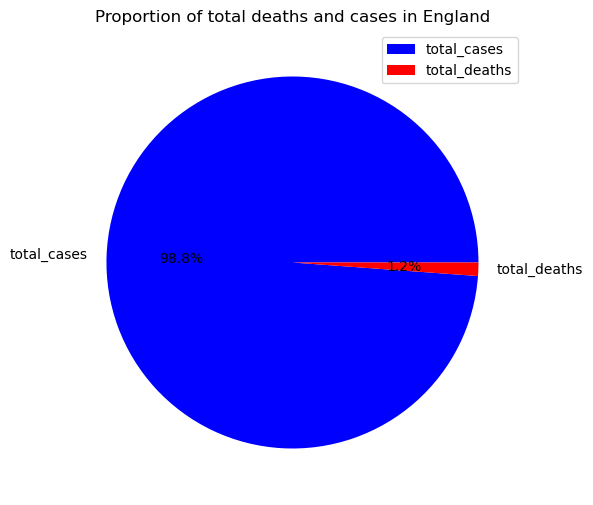

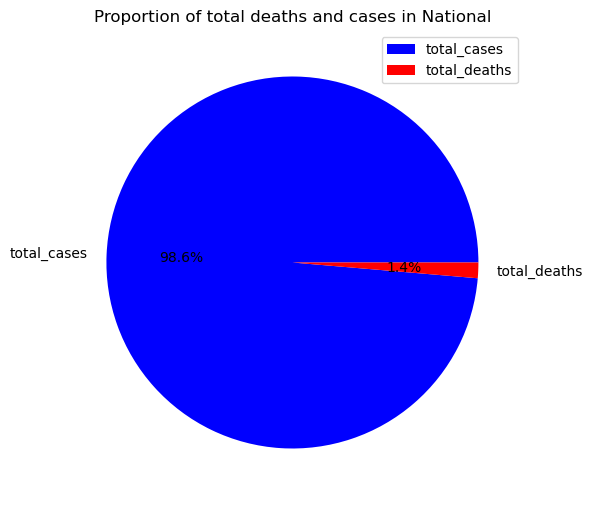

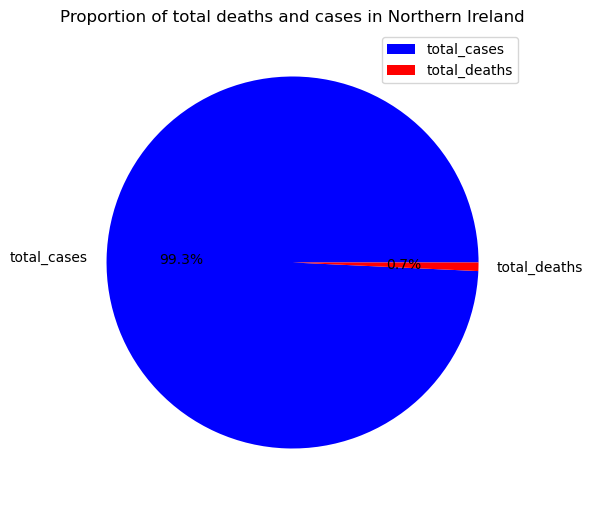

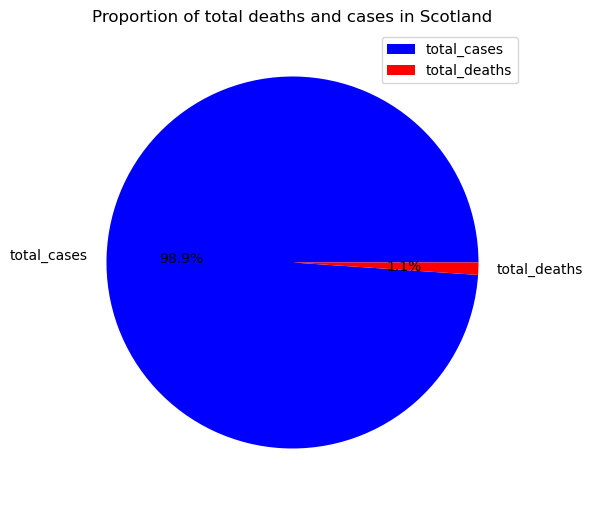

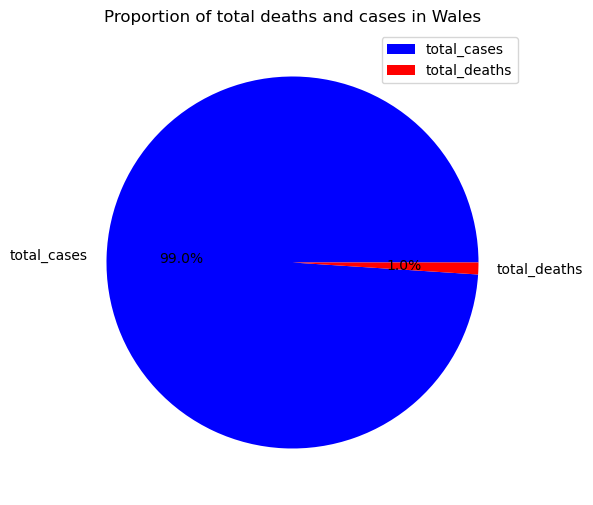

In [71]:
for index, row in total.iterrows():
    labels = ['total_cases', 'total_deaths']
    sizes = [row['daily_cases'], row['daily_deaths']]
    colors = ['blue', 'red']

    plt.figure(figsize=(6, 12))
    plt.pie(sizes, labels=labels, colors=colors, autopct='%1.1f%%')
    plt.title(f'Proportion of total deaths and cases in {index}')
    plt.legend()
    plt.show()

The above pie chart shows that none of the countries and the UK as a whole has up to 1% of the deaths of the covid cases

In [72]:
uk_data_clean['MajorityVaccinated'].unique()

array(['NV', 'V'], dtype=object)

In [73]:
vaccination = uk_data_clean.groupby(['RegionName', 'MajorityVaccinated']).agg({'daily_cases': 'sum', 'daily_deaths': 'sum'})

In [74]:
vaccination= vaccination.reset_index()

In [75]:
vaccination

,RegionName,MajorityVaccinated,daily_cases,daily_deaths
0,England,NV,4252268.5,112747.0
1,England,V,6749165.0,16472.0
2,National,NV,4915522.0,154839.0
3,National,V,8034452.0,22558.0
4,Northern Ireland,NV,133021.5,2158.0
5,Northern Ireland,V,269072.0,822.0
6,Scotland,NV,281222.0,7719.5
7,Scotland,V,635591.5,2146.5
8,Wales,NV,215593.0,5573.0
9,Wales,V,416532.0,994.0


In [76]:
uk_data_clean[uk_data['MajorityVaccinated']=='V']

,RegionName,Jurisdiction,Date,C1M_combined_numeric,C2M_combined_numeric,C3M_combined_numeric,C4M_combined_numeric,C5M_combined_numeric,C6M_combined_numeric,C7M_combined_numeric,...,ConfirmedCases,ConfirmedDeaths,MajorityVaccinated,PopulationVaccinated,StringencyIndex_Average,GovernmentResponseIndex_Average,ContainmentHealthIndex_Average,EconomicSupportIndex,daily_cases,daily_deaths
551,National,NAT_TOTAL,2021-07-05,1.0,2.0,1.0,3.5,1.0,0.0,0.0,...,4930534,154868,V,50.18,51.39,63.80,58.63,100.0,27100.0,29.0
552,National,NAT_TOTAL,2021-07-06,1.0,2.0,1.0,3.5,1.0,0.0,0.0,...,4958868,154903,V,50.40,51.39,63.80,58.63,100.0,28334.0,35.0
553,National,NAT_TOTAL,2021-07-07,1.0,2.0,1.0,3.5,1.0,0.0,0.0,...,4990916,154939,V,50.66,51.39,63.80,58.63,100.0,32048.0,36.0
554,National,NAT_TOTAL,2021-07-08,1.0,2.0,1.0,3.5,1.0,0.0,0.0,...,5022893,154981,V,50.92,51.39,63.80,58.63,100.0,31977.0,42.0
555,National,NAT_TOTAL,2021-07-09,1.0,2.0,1.0,3.5,1.0,0.0,0.0,...,5058093,155034,V,51.18,51.39,63.80,58.63,100.0,35200.0,53.0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
5110,Wales,STATE_TOTAL,2021-12-27,1.0,2.0,2.0,4.0,0.0,0.0,0.0,...,582378,6548,V,72.53,47.98,54.08,58.23,25.0,0.0,0.0
5111,Wales,STATE_TOTAL,2021-12-28,1.0,2.0,2.0,4.0,0.0,0.0,0.0,...,594753,6551,V,72.56,47.98,54.08,58.23,25.0,12375.0,3.0
5112,Wales,STATE_TOTAL,2021-12-29,1.0,2.0,2.0,4.0,0.0,0.0,0.0,...,600682,6553,V,72.60,47.98,54.08,58.23,25.0,5929.0,2.0
5113,Wales,STATE_TOTAL,2021-12-30,1.0,2.0,2.0,4.0,0.0,0.0,0.0,...,621732,6556,V,72.63,47.98,54.08,58.23,25.0,21050.0,3.0


In [77]:
fig = px.bar(vaccination, x= 'RegionName' ,y = 'daily_cases',
        color=  'MajorityVaccinated', title= 'Figure 18:Majority Vaccination on Daily cases', barmode = 'group', log_y = True)
fig.show()
fig.write_html('vaccination on daily cases.html', auto_open=True)

In [78]:
fig = px.line(uk_data_clean, x= 'Date', y='PopulationVaccinated', color= 'RegionName',
              title='Percentage of the population vaccinated')

# Save the plot as an HTML file
fig.show()
fig.write_html('Percentage of population vaccinated.html', auto_open = True)

In [79]:
fig = px.line(uk_data_clean, x= 'Date', y='StringencyIndex_Average', color= 'RegionName',
              title='Figure 19:Stringency Index Average on each date')

# Save the plot as an HTML file
fig.show()
fig.write_html('Stringency.html', auto_open=True)

In [80]:
fig = px.line(uk_data_clean, x= 'Date', y='GovernmentResponseIndex_Average', color= 'RegionName',
              title='Figure 20: Government response in each region per time')

# Save the plot as an HTML file
fig.show()
fig.write_html('Govt response.html', auto_open = True)

In [81]:
fig = px.line(uk_data_clean, x= 'Date', y='ContainmentHealthIndex_Average', color= 'RegionName',
              title='Figure 21: Containment Index in each region')

# Save the plot as an HTML file
fig.show()
fig.write_html('containment index.html', auto_open= True)

In [82]:
fig = px.line(uk_data_clean, x= 'Date', y='EconomicSupportIndex', color= 'RegionName',
              title='Figure 22: Economic support index in each region')

# Save the plot as an HTML file
fig.show()
fig.write_html('economic support index.html', auto_open = True)

Plotting a box plot of the confirmed cases to show the outliers in the data

In [83]:
fig = px.box(uk_data_clean, x= 'RegionName', y='daily_cases',
              title='Figure 23: Box plot of daily cases of each region', log_y = True)

# Save the plot as an HTML file
fig.show()
fig.write_html('daily cases box plot.html', auto_open = True)

In [84]:
fig = px.box(uk_data_clean, x= 'RegionName', y='daily_deaths',
              title='Figure 24: Box plot of daily deaths of each region', log_y = True)

# Save the plot as an HTML file
fig.show()
fig.write_html('daily deaths box plot.html', auto_open = True)

# Modelling

extracting all the regions in the dataset to have separate data  for cases of each of the regions and the national data.:

In [85]:
def test_stationarity(data):
  """
  A function that tests the stationarity of the dataset by:
  1. plot the Autocorrelation function of the data passed
  2. plot the partial autocorrelation function of the data passed
  3. printing the adfuller test results

  """
  acf = plot_acf(data) #plotting the acf
  pacf = plot_pacf(data)#plotting the Pacf
  #using the Adf test
  adf_test = adfuller(data, autolag = 'AIC')
  stats = pd.Series(adf_test[0:4],index=['Test Statistic','p-value',
                                         '#lags used','number of observations used'])
  print(stats)
  for key, values in adf_test[4].items():
    print('criticality',key,":",values)


#Writing a function to split the data into training, validation and testing

#function to split data into train, validation and test
def data_split(data):
  """
  A function that splits the data set into 511 days for training, 15% validation and 15% testing
  """
  
  train_data = data[:511]
  valid_data = data[511: -100]
  test_data = data[-100:]

  return train_data, valid_data, test_data

#model evaluation

#a function to perform grid search of different p, d, q values and evaluate complexity and model goodness of fit using AIC metric
def arima_parameters(dataset, p_values, d_values, q_values):
    dataset = dataset.astype('float32')
    best_aic, best_order = float("inf"), None
    for p in p_values:
        for d in d_values:
            for q in q_values:
                order = (p,d,q)
                try:
                    model = ARIMA(dataset, order=order).fit()
                    aic = model.aic
                    if aic < best_aic:
                        best_aic, best_order = aic, order

                except:
                    continue
    print('Best ARIMA order%s AIC=%.3f' % (best_order, best_aic))
    return best_order





#function for ARIMA implementation
def arima(data, optimal_order, forecast_horizon):
    """
    Takes a data and fits with the best ARIMA(p,d, q) model on the data and
    returns the specified forecast horizon

    """




    model = ARIMA(data, order=optimal_order)
    model_fit = model.fit()
    forecasts = model_fit.forecast(steps=forecast_horizon)



    return forecasts.iloc[-1]



#function for plotting time series

def plot_predictions(forecast_val, y_val, title):
    plt.figure(figsize=(10, 6))
    plt.plot(forecast_val, label='Prediction')
    plt.plot(y_val, label='Actual')
    plt.title(title)
    plt.legend()
    plt.show()

#function for model evaluation

def evaluate_model(actual_value, predicted_value):
    mae = mean_absolute_error(actual_value, predicted_value)
    mse = mean_squared_error(actual_value, predicted_value)
    rmse = np.sqrt(mse)
    return mae, mse, rmse

#Function for decomposition plot
def decomposition_plot(data, title):
    decompose = seasonal_decompose(data)

    # Plot the decomposition
    fig, axes = plt.subplots(3, 1, figsize=(12, 8))
    fig.suptitle(title)

    # Plot the trend
    axes[0].plot(decompose.trend)
    axes[0].set_title('Trend')

    # Plot the seasonality
    axes[1].plot(decompose.seasonal)
    axes[1].set_title('Seasonality')

    # Plot the residuals
    axes[2].plot(decompose.resid)
    axes[2].set_title('Residuals')

    
    # Show the plot
    
    plt.show()
    



In [86]:
#querying the data to extract all the regions in the data
national_cases = uk_data_clean.query('RegionName == "National"')[['Date', 'daily_cases']].set_index('Date')
england_cases = uk_data_clean.query('RegionName == "England"')[['Date', 'daily_cases']].set_index('Date')
ireland_cases = uk_data_clean.query('RegionName == "Northern Ireland"')[['Date', 'daily_cases']].set_index('Date')
scotland_cases = uk_data_clean.query('RegionName == "Scotland"')[['Date', 'daily_cases']].set_index('Date')
wales_cases = uk_data_clean.query('RegionName == "Wales"')[['Date', 'daily_cases']].set_index('Date')

In [87]:
#querying the data to extract all the regions in the data
national_deaths = uk_data_clean.query('RegionName == "National"')[['Date', 'daily_deaths']].set_index('Date')
england_deaths = uk_data_clean.query('RegionName == "England"')[['Date', 'daily_deaths']].set_index('Date')
ireland_deaths = uk_data_clean.query('RegionName == "Northern Ireland"')[['Date', 'daily_deaths']].set_index('Date')
scotland_deaths = uk_data_clean.query('RegionName == "Scotland"')[['Date', 'daily_deaths']].set_index('Date')
wales_deaths = uk_data_clean.query('RegionName == "Wales"')[['Date', 'daily_deaths']].set_index('Date')

# Plotting the decomposition plot of the cases and death for each of the regions


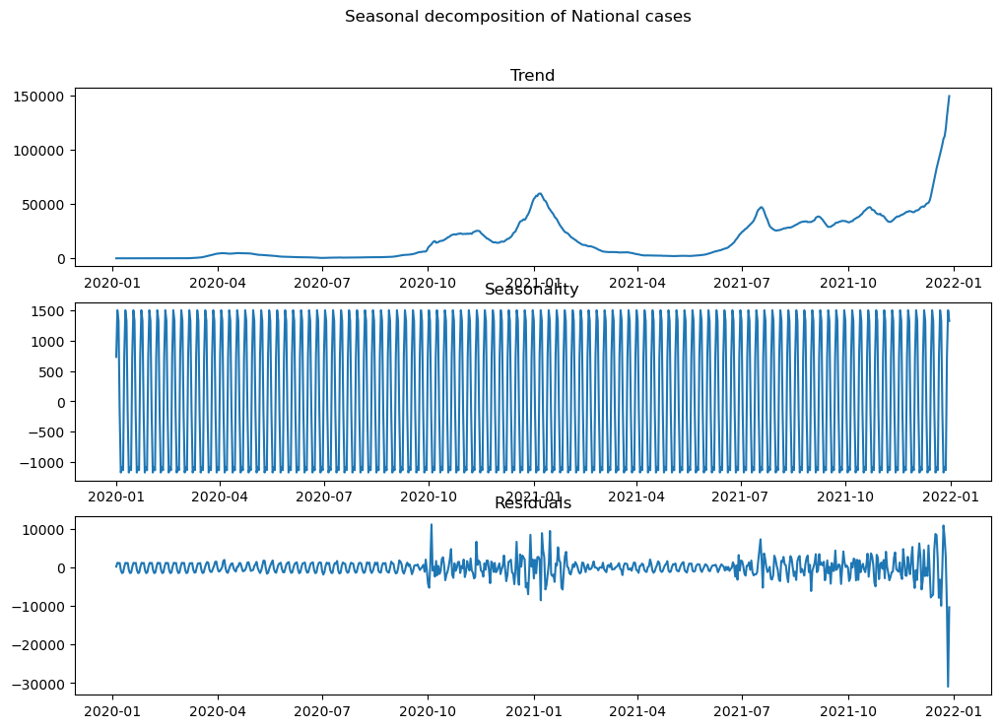

In [88]:
decomposition_plot(national_cases, 'Seasonal decomposition of National cases')

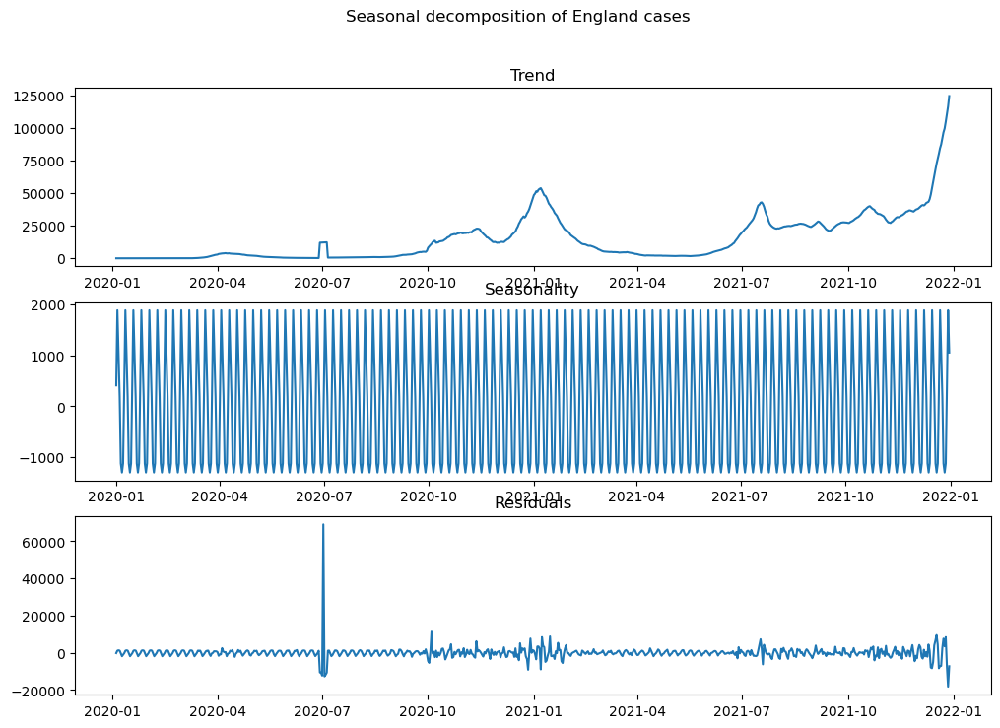

In [89]:
decomposition_plot(england_cases, 'Seasonal decomposition of England cases')

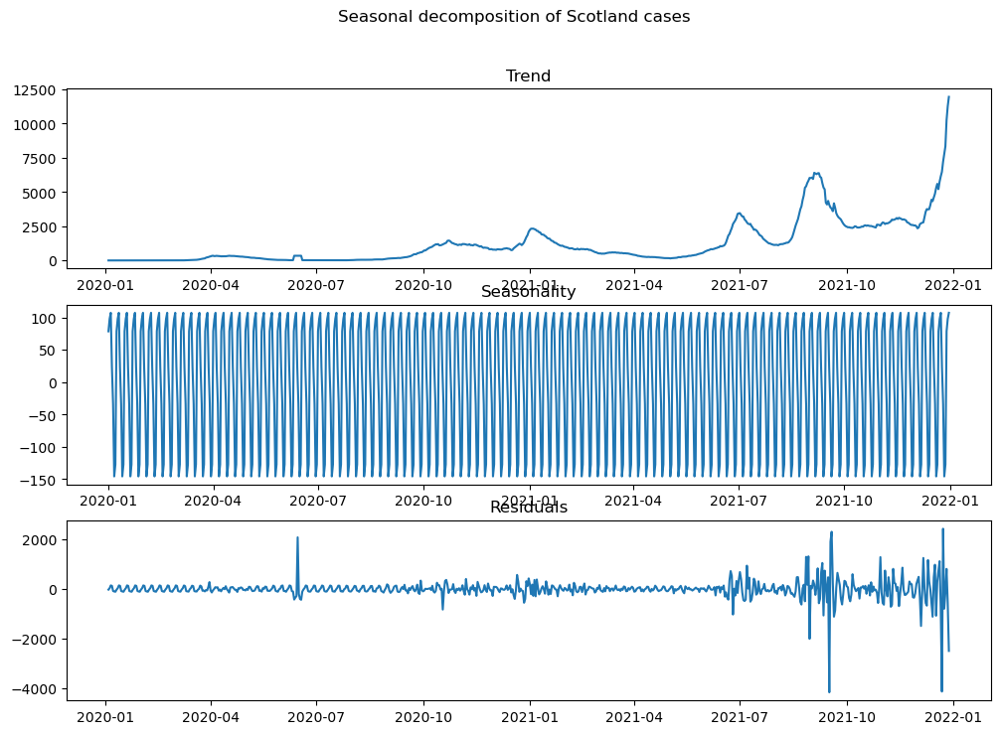

In [90]:
decomposition_plot(scotland_cases, 'Seasonal decomposition of Scotland cases')

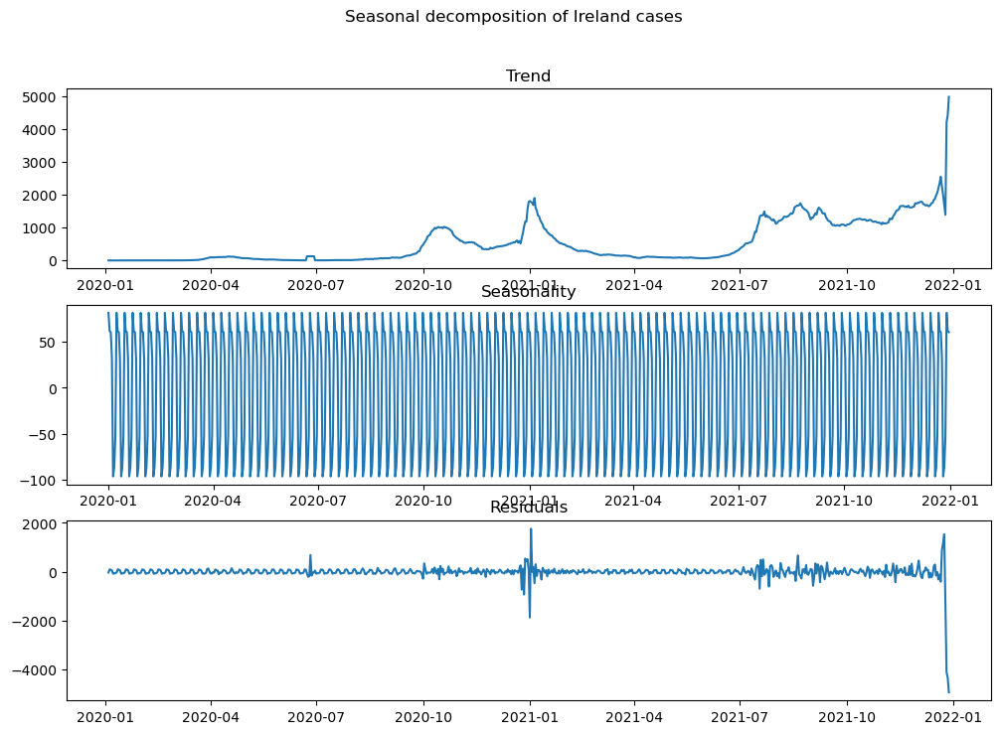

In [91]:
decomposition_plot(ireland_cases, 'Seasonal decomposition of Ireland cases')

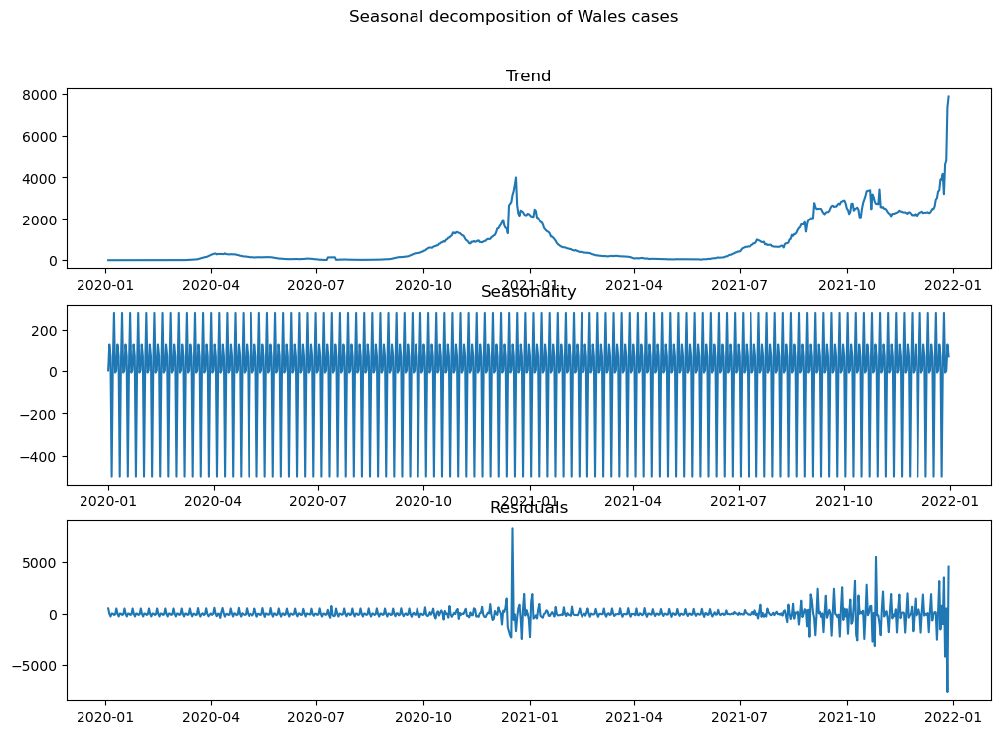

In [92]:
decomposition_plot(wales_cases, 'Seasonal decomposition of Wales cases')

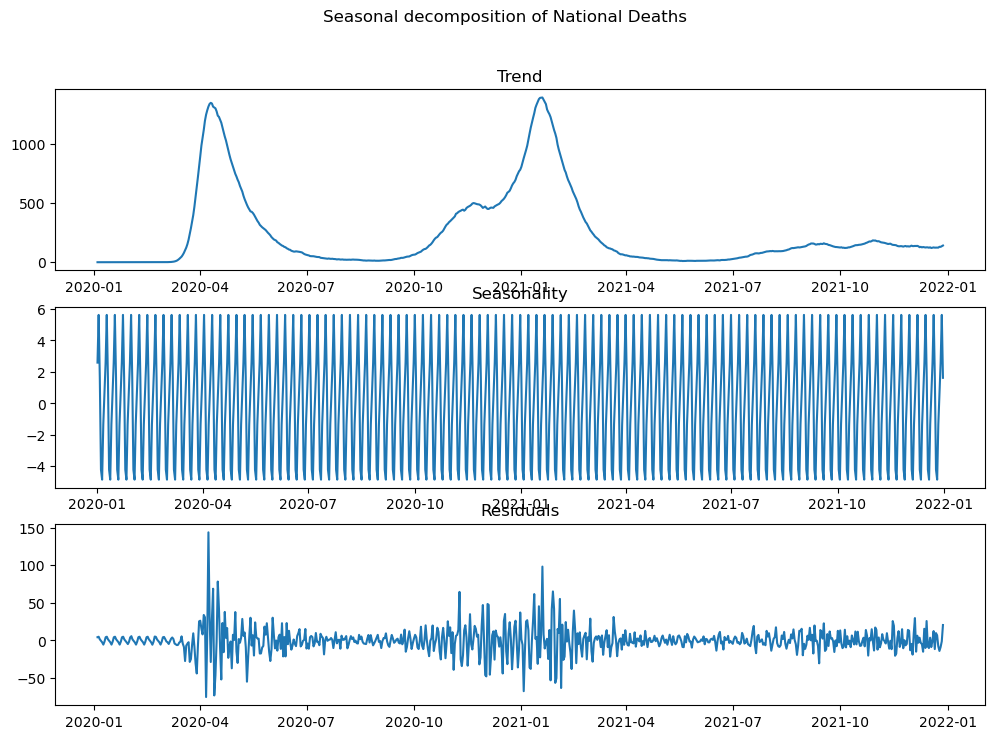

In [93]:
decomposition_plot(national_deaths, 'Seasonal decomposition of National Deaths')

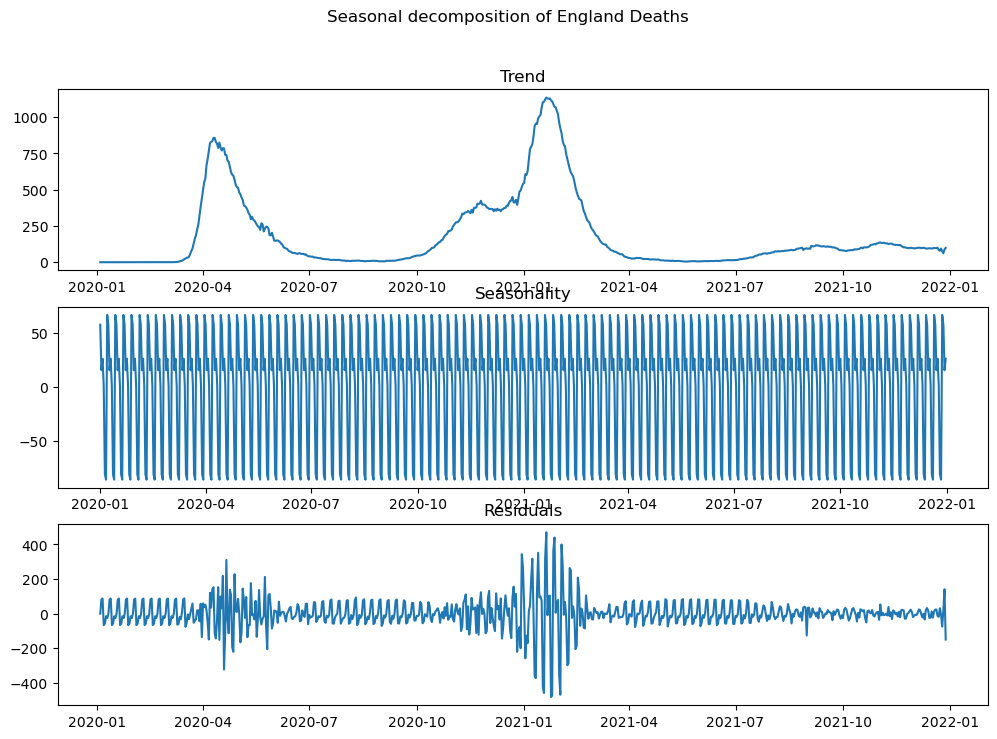

In [94]:
decomposition_plot(england_deaths, 'Seasonal decomposition of England Deaths')

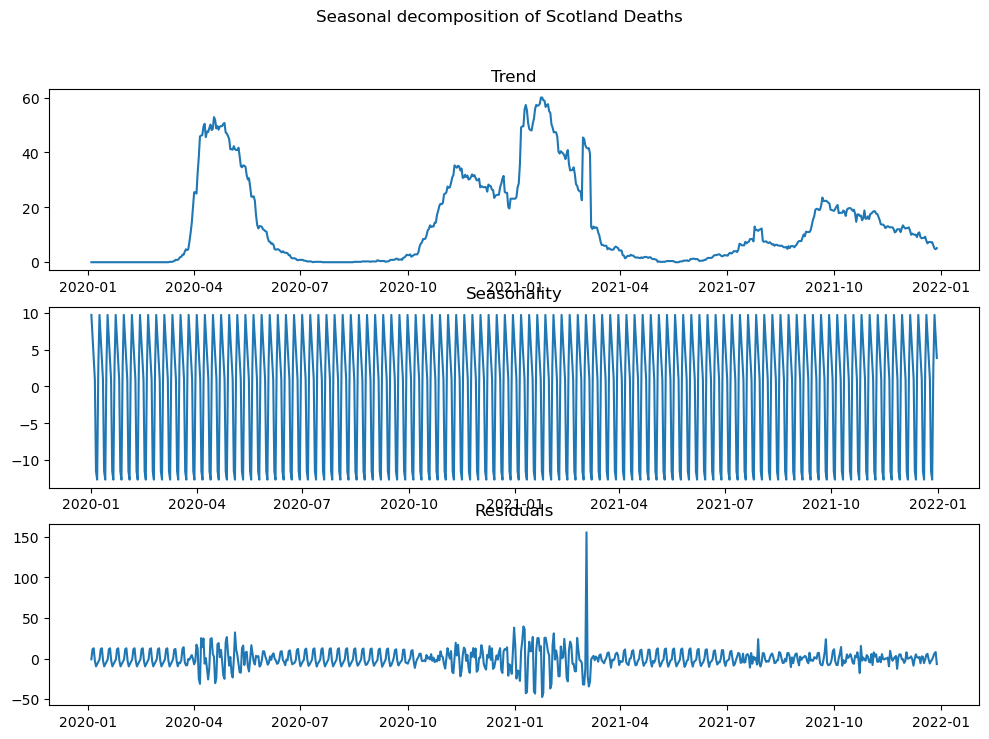

In [95]:
decomposition_plot(scotland_deaths, 'Seasonal decomposition of Scotland Deaths')

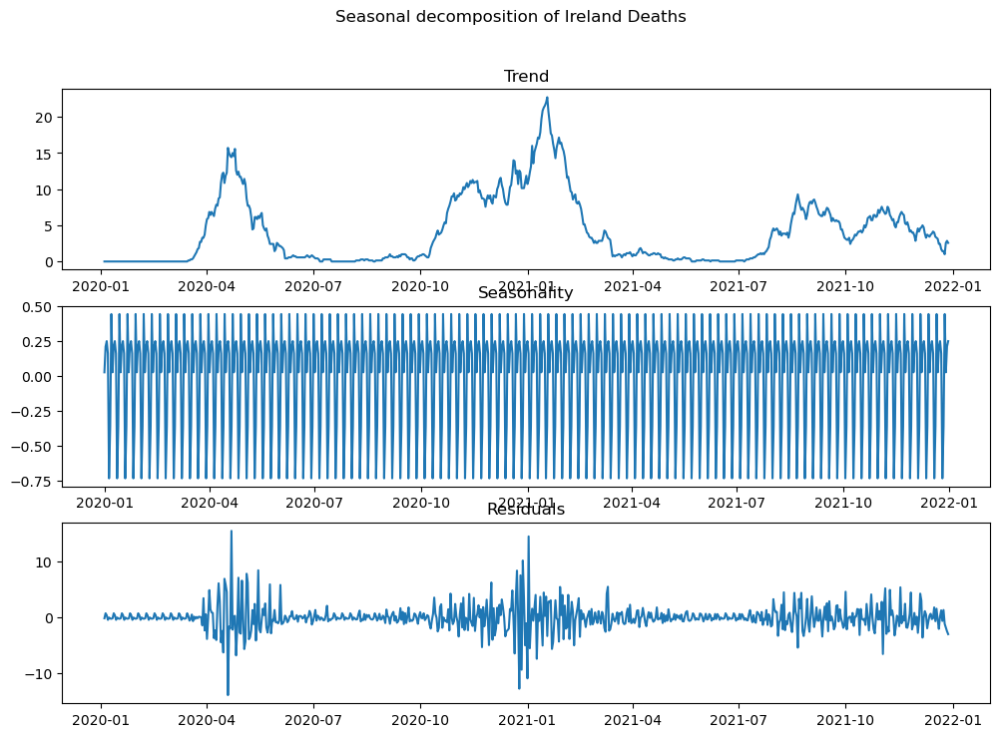

In [96]:
decomposition_plot(ireland_deaths, 'Seasonal decomposition of Ireland Deaths')

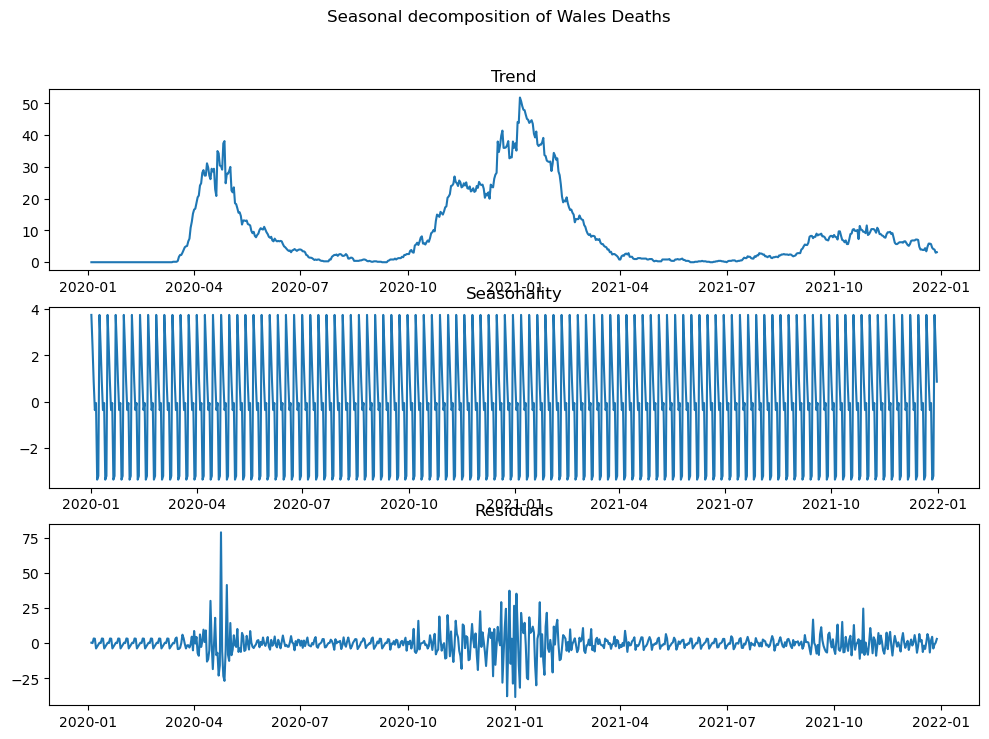

In [97]:
decomposition_plot(wales_deaths, 'Seasonal decomposition of Wales Deaths')

# splitting the dataset into training, validation and testing: I will be spliting the dataset into training, validation and testing. 
The training data was used for order selection

In [98]:
national_train, national_valid, national_test = data_split(national_cases)

england_cases_train , england_cases_valid, england_cases_test = data_split(england_cases)

scotland_cases_train , scotland_cases_valid, scotland_cases_test = data_split(scotland_cases)

ireland_cases_train , ireland_cases_valid, ireland_cases_test = data_split(ireland_cases)

wales_cases_train , wales_cases_valid, wales_cases_test = data_split(wales_cases)

national_deaths_train , national_deaths_valid, national_deaths_test = data_split(national_deaths)

england_deaths_train , england_deaths_valid, england_deaths_test = data_split(england_deaths)

scotland_deaths_train , scotland_deaths_valid, scotland_deaths_test = data_split(scotland_deaths)

ireland_deaths_train , ireland_deaths_valid, ireland_deaths_test = data_split(ireland_deaths)

wales_deaths_train , wales_deaths_valid, wales_deaths_test = data_split(wales_deaths)

# testing stationarity for national cases

Test Statistic                   1.624486
p-value                          0.997929
#lags used                      15.000000
number of observations used    715.000000
dtype: float64
criticality 1% : -3.4395289262948894
criticality 5% : -2.8655907692307694
criticality 10% : -2.5689271030368235


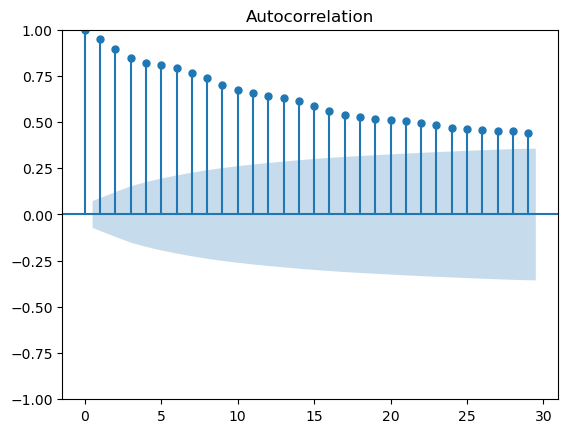

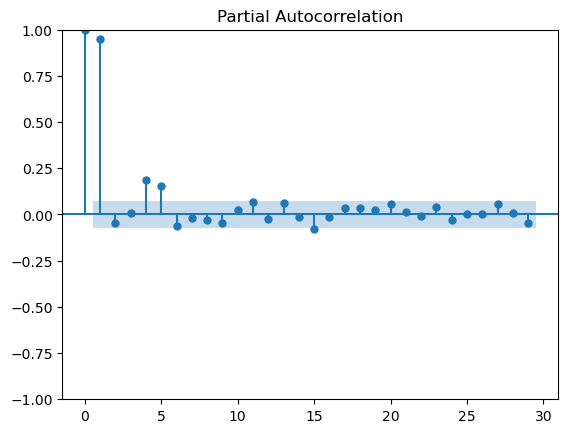

In [77]:
test_stationarity(national_cases)

Test Statistic                  -0.520835
p-value                          0.887886
#lags used                      20.000000
number of observations used    710.000000
dtype: float64
criticality 1% : -3.439593802573824
criticality 5% : -2.865619356068967
criticality 10% : -2.568942332870462


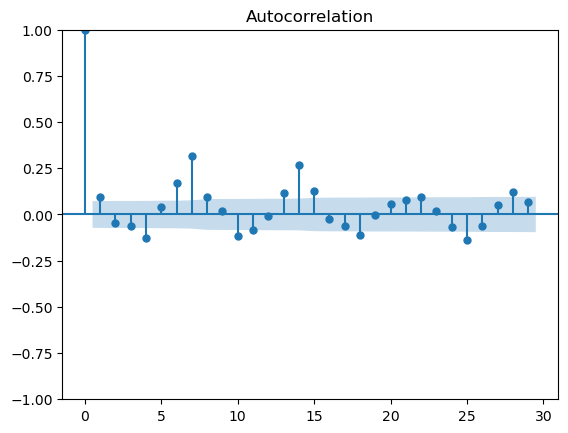

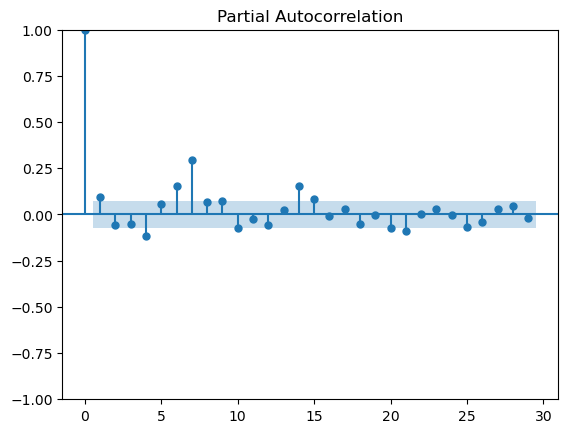

In [78]:
#differencing the data set to make the data stationary
national_stationary =  national_cases.diff(periods = 1).fillna(0)

#checking for stationarity again
test_stationarity(national_stationary)

# testing stationarity for England cases

Test Statistic                   1.399155
p-value                          0.997110
#lags used                      16.000000
number of observations used    714.000000
dtype: float64
criticality 1% : -3.4395418285955563
criticality 5% : -2.865596454500293
criticality 10% : -2.5689301318958955


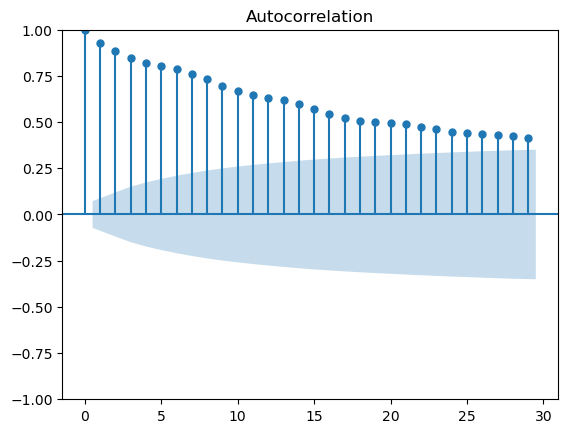

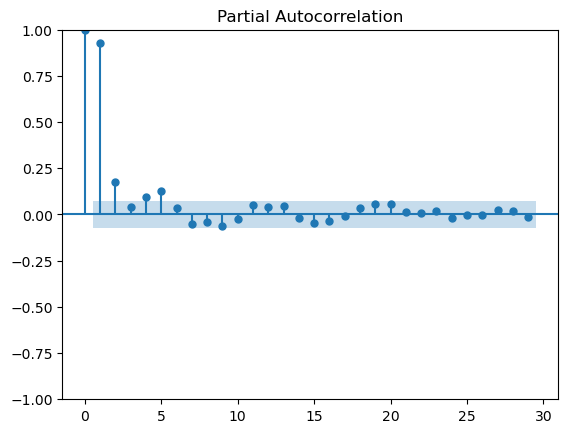

In [79]:
test_stationarity(england_cases)

Test Statistic                  -1.520652
p-value                          0.523271
#lags used                      15.000000
number of observations used    715.000000
dtype: float64
criticality 1% : -3.4395289262948894
criticality 5% : -2.8655907692307694
criticality 10% : -2.5689271030368235


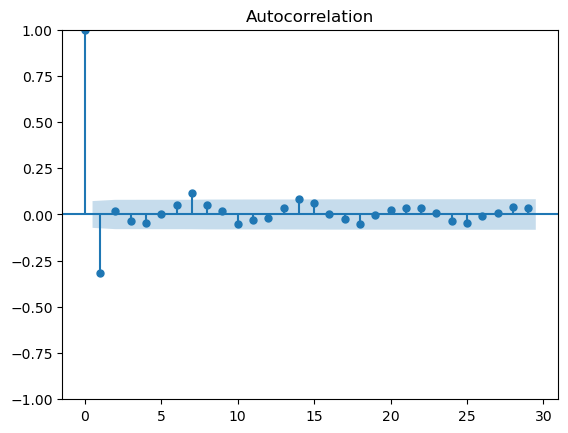

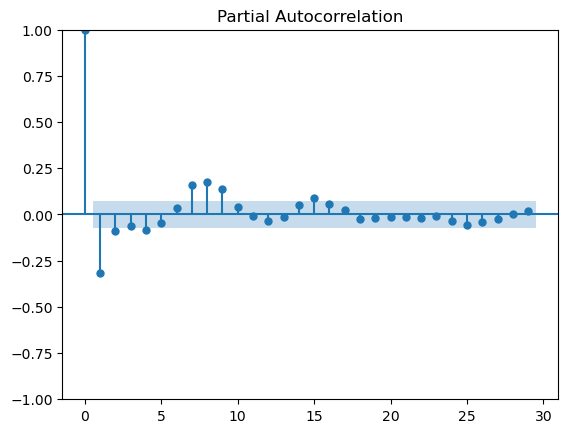

In [80]:
england_cases_stationary = england_cases.diff(periods = 1).fillna(0)
test_stationarity(england_cases_stationary)

# testing stationarity for Scotland cases

Test Statistic                   1.681553
p-value                          0.998083
#lags used                      20.000000
number of observations used    710.000000
dtype: float64
criticality 1% : -3.439593802573824
criticality 5% : -2.865619356068967
criticality 10% : -2.568942332870462


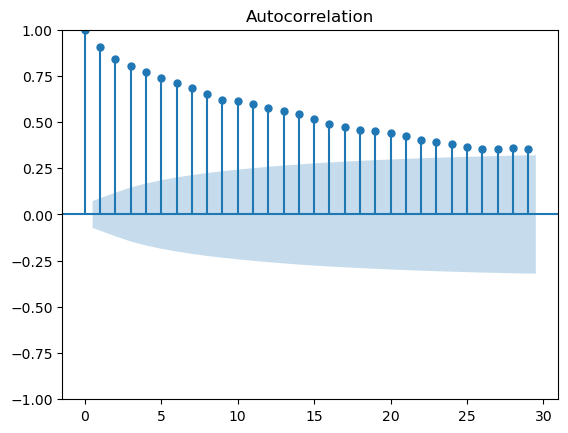

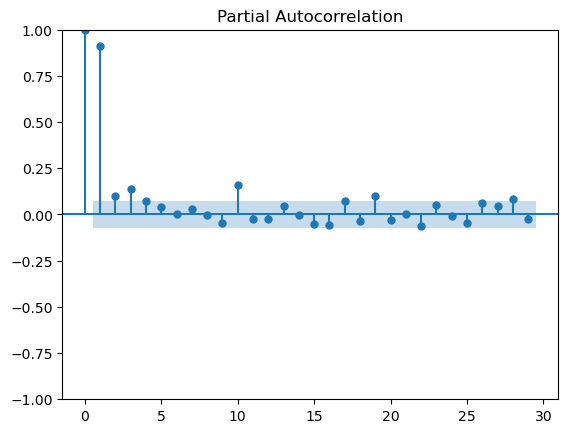

In [81]:
test_stationarity(scotland_cases)

Test Statistic                  -1.493269
p-value                          0.536839
#lags used                      19.000000
number of observations used    711.000000
dtype: float64
criticality 1% : -3.439580754053961
criticality 5% : -2.865613606467485
criticality 10% : -2.568939269723711


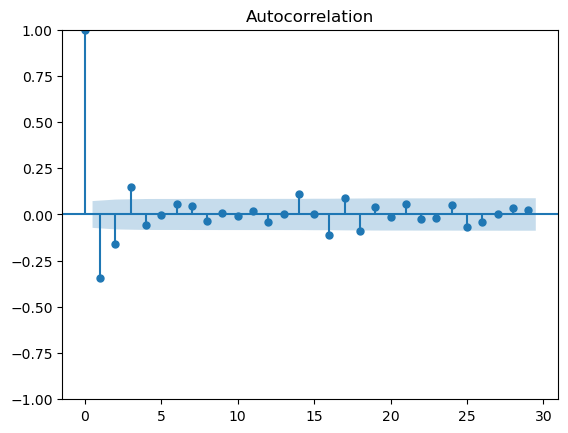

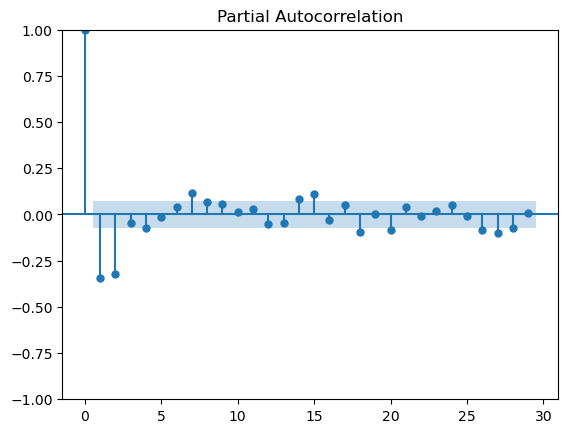

In [82]:
scotland_cases_stationary = scotland_cases.diff(periods = 1).fillna(0)
test_stationarity(scotland_cases_stationary)

# testing stationarity for Ireland cases

Test Statistic                   0.542145
p-value                          0.986099
#lags used                      11.000000
number of observations used    719.000000
dtype: float64
criticality 1% : -3.439477677285233
criticality 5% : -2.865568186630048
criticality 10% : -2.5689150720653977


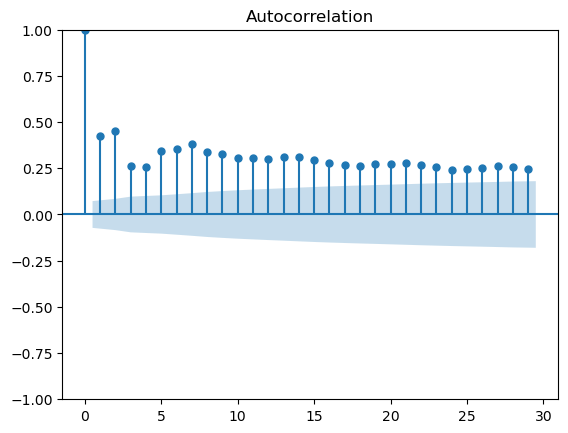

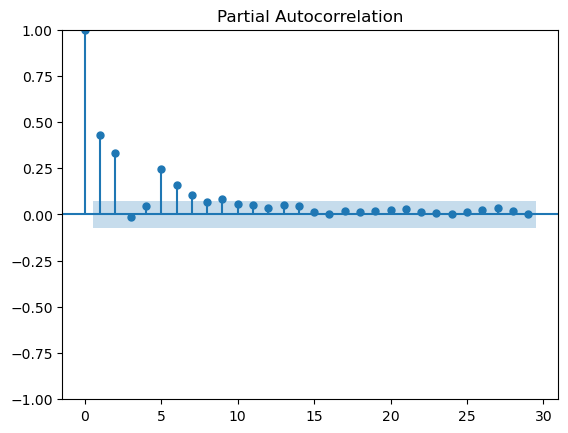

In [83]:
test_stationarity(ireland_cases)

Test Statistic                -6.821298e+00
p-value                        1.998781e-09
#lags used                     1.000000e+01
number of observations used    7.200000e+02
dtype: float64
criticality 1% : -3.439464954327953
criticality 5% : -2.8655625802683473
criticality 10% : -2.5689120852623457


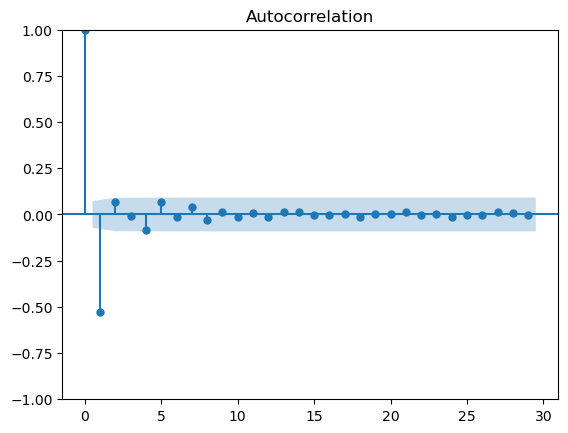

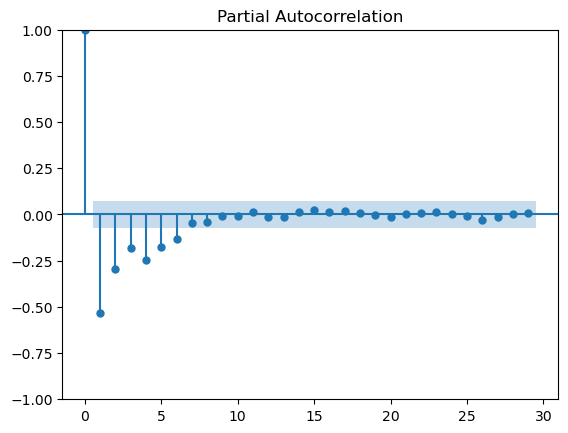

In [84]:
ireland_cases_stationary = ireland_cases.diff(periods = 1).fillna(0)
test_stationarity(ireland_cases_stationary)

# testing stationarity for Wales cases

Test Statistic                   1.597910
p-value                          0.997851
#lags used                      20.000000
number of observations used    710.000000
dtype: float64
criticality 1% : -3.439593802573824
criticality 5% : -2.865619356068967
criticality 10% : -2.568942332870462


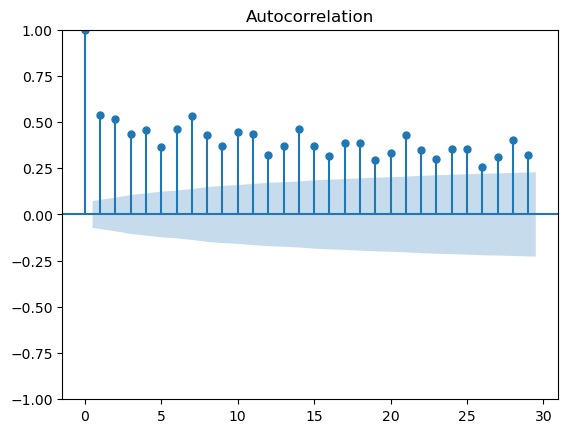

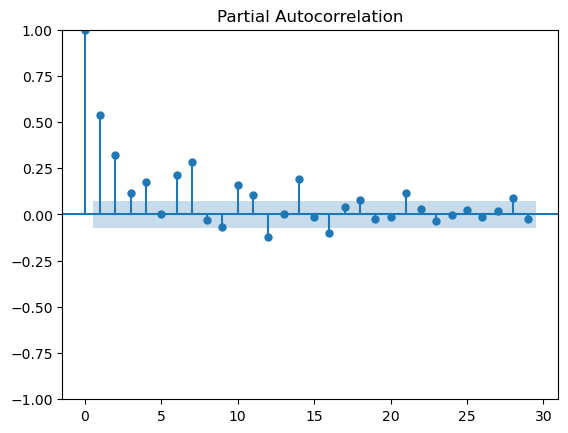

In [85]:
test_stationarity(wales_cases)

Test Statistic                   0.393830
p-value                          0.981263
#lags used                      19.000000
number of observations used    711.000000
dtype: float64
criticality 1% : -3.439580754053961
criticality 5% : -2.865613606467485
criticality 10% : -2.568939269723711


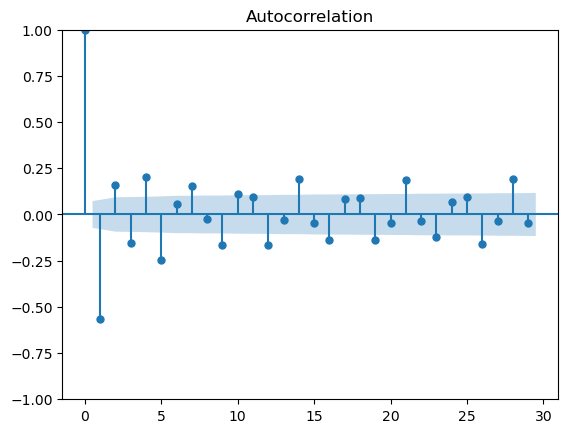

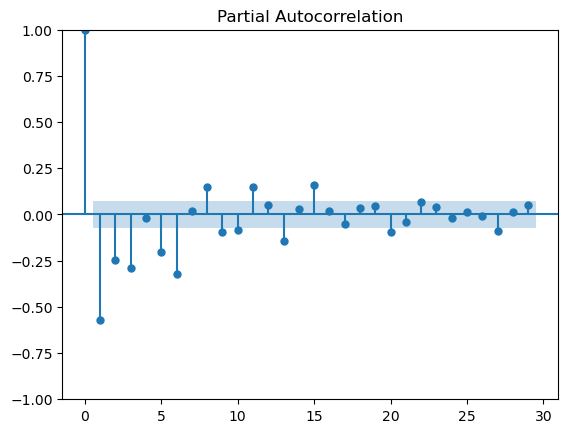

In [86]:
wales_cases_stationary = wales_cases.diff(periods = 1).fillna(0)
test_stationarity(wales_cases_stationary)

# testing stationarity for national deaths

Test Statistic                  -3.076538
p-value                          0.028339
#lags used                      15.000000
number of observations used    715.000000
dtype: float64
criticality 1% : -3.4395289262948894
criticality 5% : -2.8655907692307694
criticality 10% : -2.5689271030368235


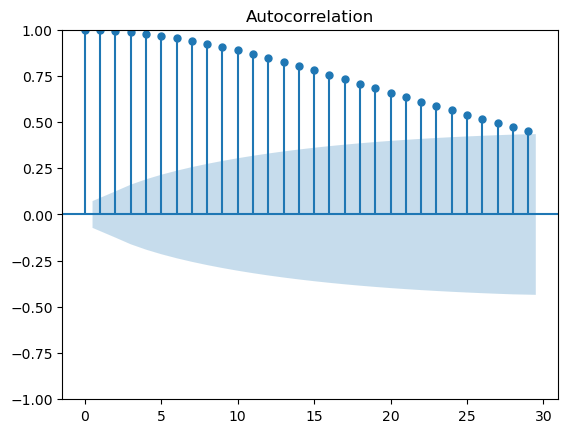

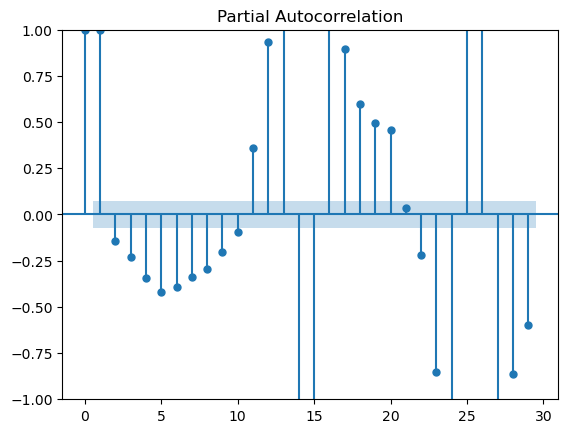

In [87]:
test_stationarity(national_deaths)

Test Statistic                -5.664118e+00
p-value                        9.235496e-07
#lags used                     1.500000e+01
number of observations used    7.150000e+02
dtype: float64
criticality 1% : -3.4395289262948894
criticality 5% : -2.8655907692307694
criticality 10% : -2.5689271030368235


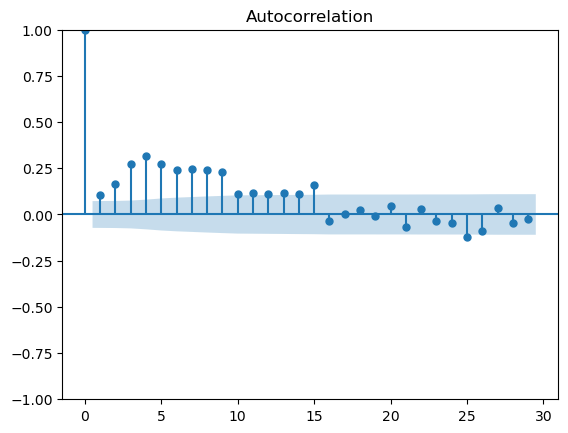

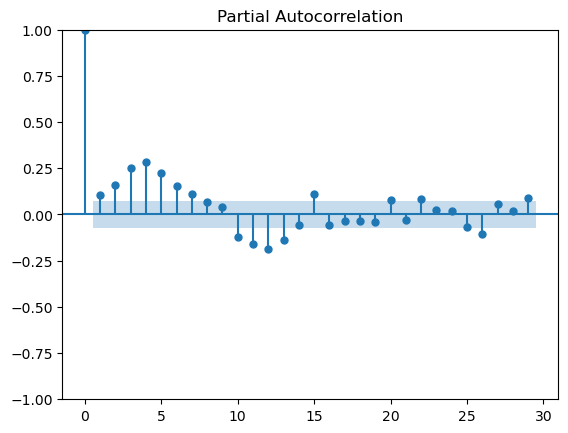

In [88]:
national_deaths_stationary = national_deaths.diff(periods=1).fillna(0)
test_stationarity(national_deaths_stationary)

# testing stationarity for England deaths

Test Statistic                  -3.552109
p-value                          0.006745
#lags used                      16.000000
number of observations used    714.000000
dtype: float64
criticality 1% : -3.4395418285955563
criticality 5% : -2.865596454500293
criticality 10% : -2.5689301318958955


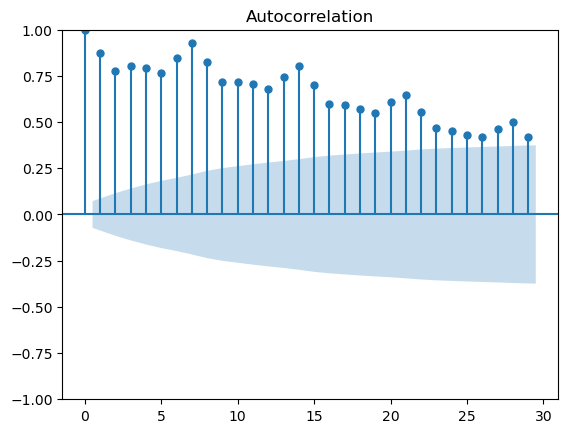

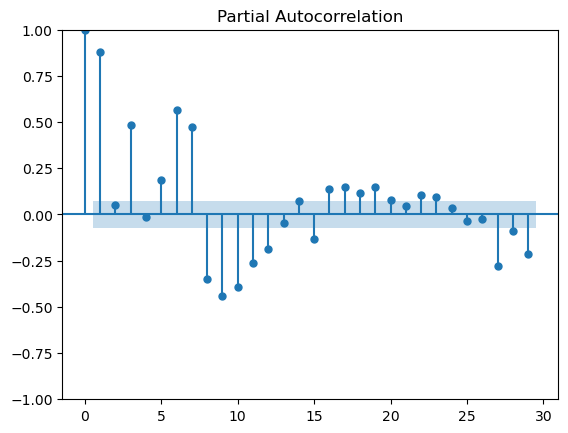

In [89]:
test_stationarity(england_deaths)

Test Statistic                  -5.570028
p-value                          0.000001
#lags used                      20.000000
number of observations used    710.000000
dtype: float64
criticality 1% : -3.439593802573824
criticality 5% : -2.865619356068967
criticality 10% : -2.568942332870462


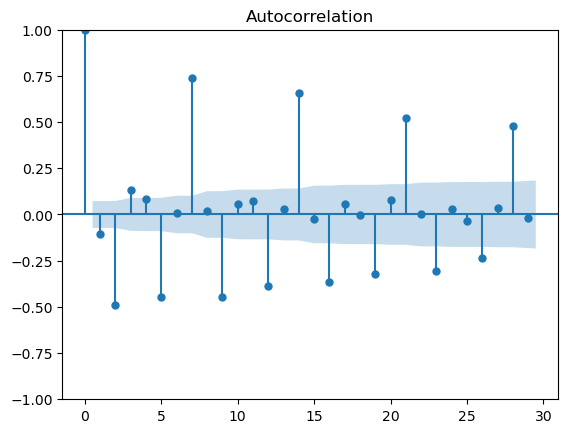

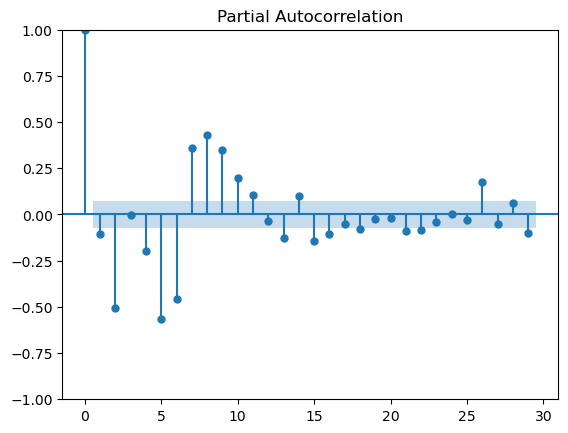

In [90]:
england_deaths_stationary = england_deaths.diff(periods=1).fillna(0)
test_stationarity(england_deaths_stationary)

# testing stationarity for Scotland deaths

Test Statistic                  -2.673443
p-value                          0.078748
#lags used                      15.000000
number of observations used    715.000000
dtype: float64
criticality 1% : -3.4395289262948894
criticality 5% : -2.8655907692307694
criticality 10% : -2.5689271030368235


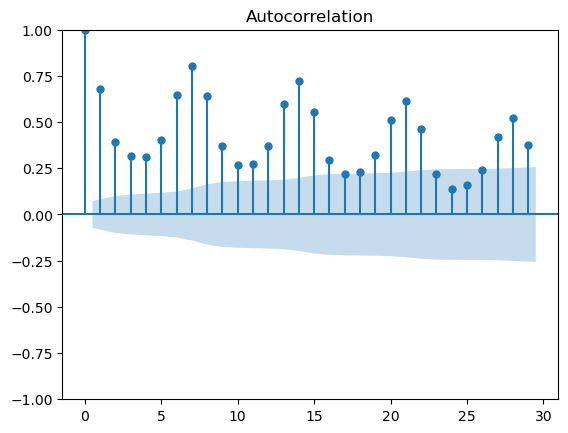

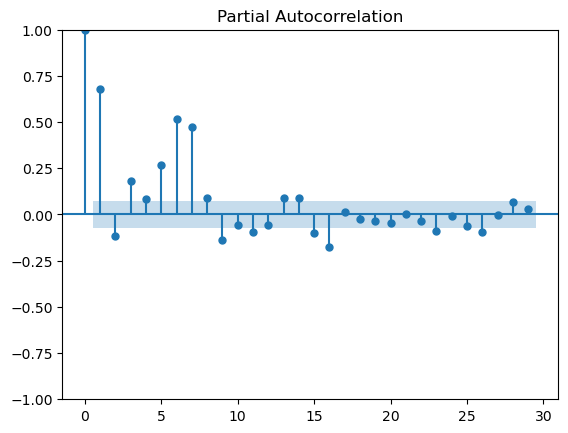

In [91]:
test_stationarity(scotland_deaths)

Test Statistic                -6.894415e+00
p-value                        1.330165e-09
#lags used                     1.400000e+01
number of observations used    7.160000e+02
dtype: float64
criticality 1% : -3.439516060164992
criticality 5% : -2.8655850998755263
criticality 10% : -2.5689240826597173


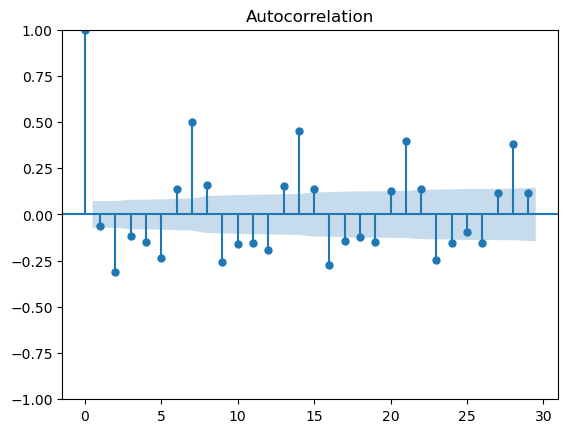

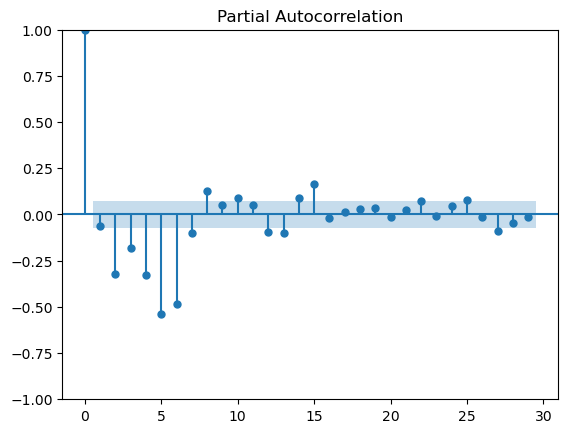

In [92]:
scotland_deaths_stationary = scotland_deaths.diff(periods=1).fillna(0)
test_stationarity(scotland_deaths_stationary)

# testing stationarity for Ireland deaths

Test Statistic                  -3.178467
p-value                          0.021265
#lags used                      20.000000
number of observations used    710.000000
dtype: float64
criticality 1% : -3.439593802573824
criticality 5% : -2.865619356068967
criticality 10% : -2.568942332870462


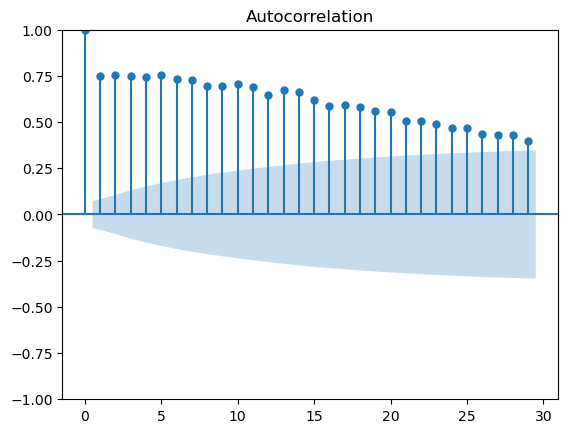

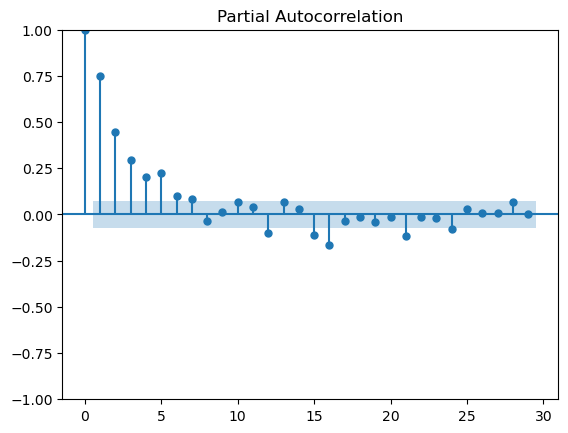

In [93]:
test_stationarity(ireland_deaths)

Test Statistic                -6.591081e+00
p-value                        7.111962e-09
#lags used                     1.400000e+01
number of observations used    7.160000e+02
dtype: float64
criticality 1% : -3.439516060164992
criticality 5% : -2.8655850998755263
criticality 10% : -2.5689240826597173


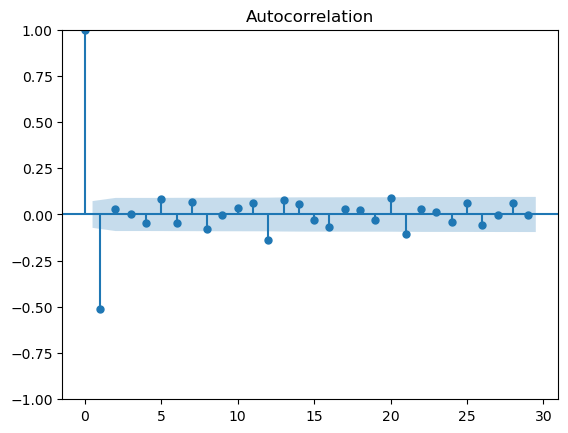

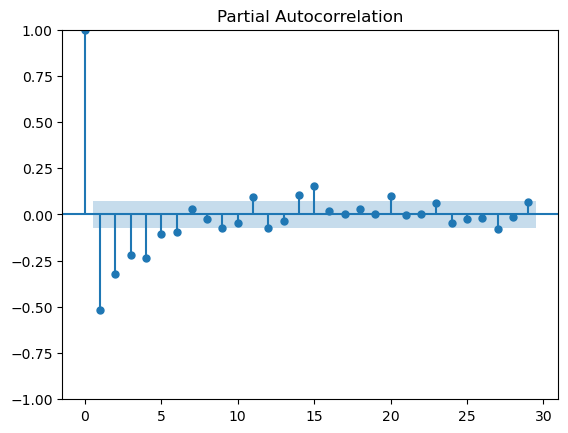

In [94]:
ireland_deaths_stationary = ireland_deaths.diff(periods=1).fillna(0)
test_stationarity(ireland_deaths_stationary)

# testing stationarity for Wales deaths

Test Statistic                  -2.189003
p-value                          0.210261
#lags used                      16.000000
number of observations used    714.000000
dtype: float64
criticality 1% : -3.4395418285955563
criticality 5% : -2.865596454500293
criticality 10% : -2.5689301318958955


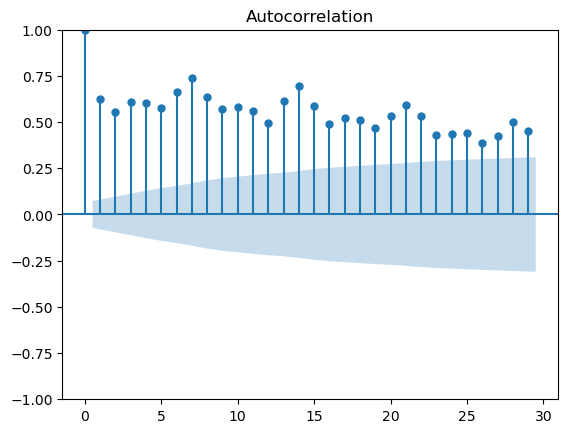

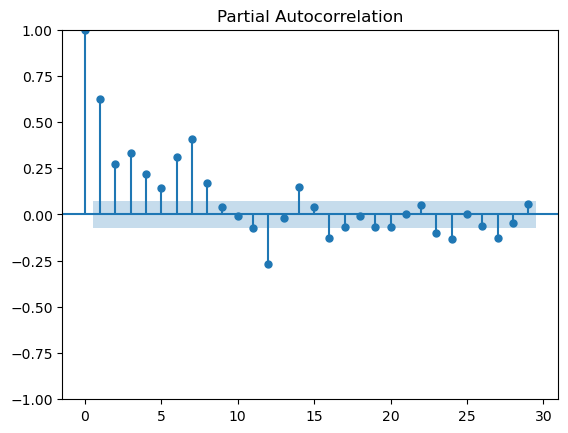

In [95]:
test_stationarity(wales_deaths)

Test Statistic                -6.709256e+00
p-value                        3.716542e-09
#lags used                     1.500000e+01
number of observations used    7.150000e+02
dtype: float64
criticality 1% : -3.4395289262948894
criticality 5% : -2.8655907692307694
criticality 10% : -2.5689271030368235


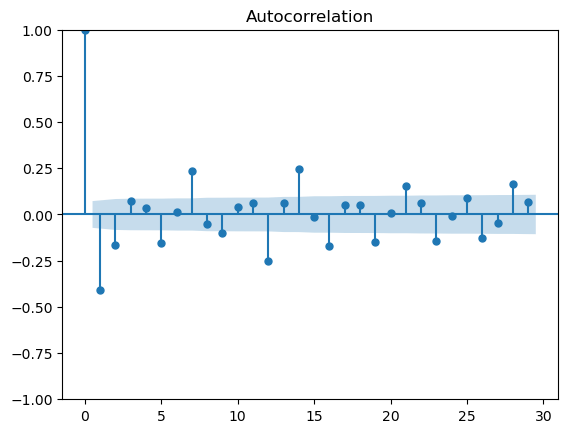

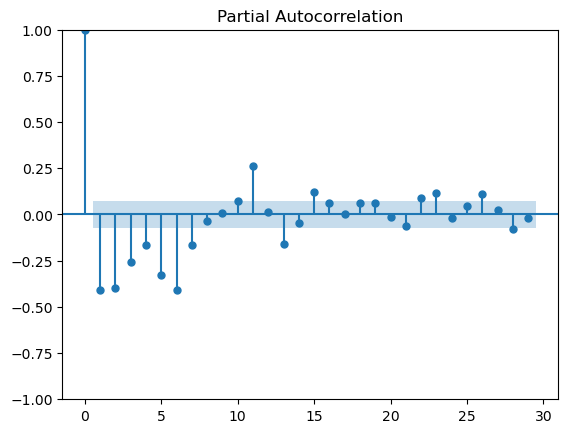

In [96]:
wales_deaths_stationary = wales_deaths.diff(periods=1).fillna(0)
test_stationarity(wales_deaths_stationary)

In [97]:
# evaluate parameters
p_values = [0,1,5,6,7,8,10,14,15,21,28] #Only selecting values above significance threshold to save time
d_values = [1]
q_values = [0,1,2,3,4,5,6,9,13,20,28]
warnings.filterwarnings("ignore")
optimal_order_train = arima_parameters(national_train, p_values, d_values, q_values)



p_values = [0, 1, 2, 3, 4,5,6, 13, 20, 27] #Only selecting values above significance threshold to save time
d_values = [1]
q_values = [0, 1, 6, 7, 8, 13, 14, 15, 20, 21, 28]

england_optimal_order_ = arima_parameters(england_cases_train, p_values, d_values, q_values)



# evaluate parameters
p_values = [0,1, 2, 3, 4,5,6, 8,13, 14, 15]#Only selecting values above significance threshold to save time
d_values = [1]
q_values = [0,1,2,3,4,5,6, 7,8,9,10,11,12, 14, 16, 18, 19, 21, 23,28, 30,31]

scotland_optimal_order_ = arima_parameters(scotland_cases_train, p_values, d_values, q_values)



# evaluate parameters
p_values = [0, 1, 2, 3, 4,5,6, 8, 11, 13,14, 15, 17, 18, 20, 26]#Only selecting values above significance threshold to save time
d_values = [1]
q_values = [0, 1, 3, 5, 6, 27]

ireland_optimal_order_ = arima_parameters(ireland_cases_train, p_values, d_values, q_values)



# evaluate parameters
p_values = [0, 1, 2, 3, 4,5,6,7, 8, 11, 13,14, 16, 17, 20, 25, 27, 28]#Only selecting values above significance threshold to save time
d_values = [1]
q_values =  [0, 1, 4, 5, 6, 7, 9, 12, 14, 21, 27]

wales_optimal_order_ = arima_parameters(wales_cases_train, p_values, d_values, q_values)



# evaluate parameters
p_values = [0, 2, 3, 4,5,6, 7, 8,10, 11,12, 13, 14, 15,25, 26]#Only selecting values above significance threshold to save time
d_values = [1]
q_values = [0,2,3, 4,5,6, 7,8,9,10,11,12, 13, 14, 15, 25, 30, 31]

national_deaths_order = arima_parameters(national_deaths_train, p_values, d_values, q_values)

p_values = [0,1, 2, 3, 4,5,6, 7, 8, 9, 10, 11, 13, 16, 17]#Only selecting values above significance threshold to save time
d_values = [1]
q_values = [0,1,2,5,6, 7,8,9, 13, 14, 15,16,20,21]

england_deaths_order = arima_parameters(england_deaths_train, p_values, d_values, q_values)

p_values = [0,1, 2, 3, 4,5,6, 8,13, 14, 15]#Only selecting values above significance threshold to save time
d_values = [1]
q_values = [0,1,2,3,4,5,6, 7,8,9,10,11,12, 14, 16, 18, 19, 21, 23,28, 30,31]

scotland_deaths_order = arima_parameters(scotland_deaths_train, p_values, d_values, q_values)

# evaluate parameters
p_values = [0,1, 2, 3, 4,5,6, 11, 12, 13, 15, 27]#Only selecting values above significance threshold to save time
d_values = [1]
q_values = [0,1,7, 12,16,28]

ireland_deaths_order = arima_parameters(ireland_deaths_train, p_values, d_values, q_values)

# evaluate parameters
p_values = [0,1, 2, 3, 4,5,6, 7, 11, 13, 14, 21,24]#Only selecting values above significance threshold to save time
d_values = [1]
q_values = [0,1,2,5,6, 7,8, 12, 14, 16,19,21,27,28]

wales_deaths_order = arima_parameters(wales_deaths_train, p_values, d_values, q_values)



best_aic = pd.DataFrame({  "national cases ": optimal_order_train[0:3],
                "england cases":england_optimal_order_[0:3],
                "england deaths": england_deaths_order[0:3],
                "ireland deaths": ireland_deaths_order[0:3],
                "ireland cases": ireland_optimal_order_[0:3],
                "national deaths": national_deaths_order[0:3],
                "scotland deaths": scotland_deaths_order[0:3],
                "scotland cases": scotland_optimal_order_[0:3],
                "wales deaths" : wales_deaths_order[0:3],
                "wales cases": wales_optimal_order_[0:3]}).T

best_aic.columns = "p value", 'd value', "q value"
best_aic.to_csv('best_aic.csv')


Best ARIMA order(21, 1, 9) AIC=9240.455
Best ARIMA order(1, 1, 6) AIC=10072.096
Best ARIMA order(2, 1, 3) AIC=6766.894
Best ARIMA order(6, 1, 5) AIC=6725.712
Best ARIMA order(0, 1, 21) AIC=7816.920
Best ARIMA order(26, 1, 15) AIC=84.000
Best ARIMA order(9, 1, 8) AIC=5882.070
Best ARIMA order(4, 1, 7) AIC=4046.549
Best ARIMA order(12, 1, 12) AIC=2563.458
Best ARIMA order(11, 1, 5) AIC=39.037


In [99]:
#importing the best aic csv
best_aic = pd.read_csv('best_aic.csv', index_col=0)

# National cases Prediction

# ARIMA prediction

In [102]:
national_cases_1prediction = []
for i in range(len(national_test)):
    p = arima(national_valid, best_aic.loc['national cases '], 1)
    national_cases_1prediction.append(p)
    national_valid = national_valid.drop(index = national_valid.index[0])
    national_valid = national_valid.append(national_test.iloc[i])
    
    
    

In [103]:
national_cases_1prediction = pd.Series(national_cases_1prediction)

In [104]:
national_cases_1prediction.index = national_test.index

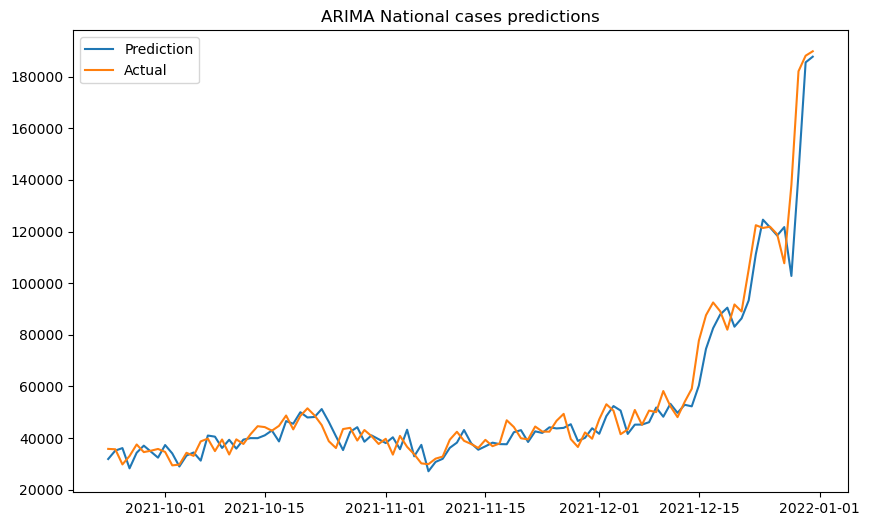

In [105]:
plot_predictions(national_cases_1prediction, national_test, "ARIMA National cases predictions")

In [106]:
national_cases_day_1_mae, national_cases_day_1_mse, national_cases_day_1_rmse = evaluate_model(national_test, national_cases_1prediction)

In [107]:
print("MAE:{}, MSE:{}, RMSE:{}".format(national_cases_day_1_mae, national_cases_day_1_mse, national_cases_day_1_rmse))

MAE:4585.78824054488, MSE:54266265.22732102, RMSE:7366.564004155603


**England cases ARIMA**

In [110]:
england_cases_1prediction = []
rolling_england_cases_day1= england_cases_valid.copy()
for i in range(len(england_cases_test)):
    england_cases_1 = arima(rolling_england_cases_day1, best_aic.loc['england cases'], 1)
    england_cases_1prediction.append(england_cases_1)
    rolling_england_cases_day1 = rolling_england_cases_day1.drop(index = rolling_england_cases_day1.index[0])
    rolling_england_cases_day1 = rolling_england_cases_day1.append(england_cases_test.iloc[i])

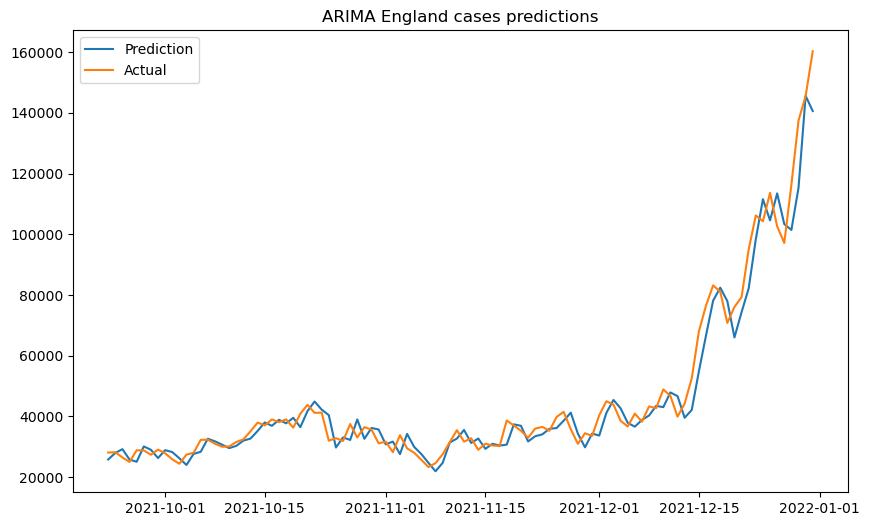

england_cases_day_1_MAE:3855.75056258291, england_cases_day_1_MSE:30513108.694755062, england_cases_day_1_RMSE:5523.86718656007


In [111]:
england_cases_1prediction = pd.Series(england_cases_1prediction)

england_cases_1prediction.index = england_cases_test.index

plot_predictions(england_cases_1prediction, england_cases_test, "ARIMA England cases predictions")
england_cases_day_1_mae, england_cases_day_1_mse, england_cases_day_1_rmse = evaluate_model(england_cases_test, england_cases_1prediction)

print("england_cases_day_1_MAE:{}, england_cases_day_1_MSE:{}, england_cases_day_1_RMSE:{}".format(england_cases_day_1_mae, england_cases_day_1_mse, england_cases_day_1_rmse))

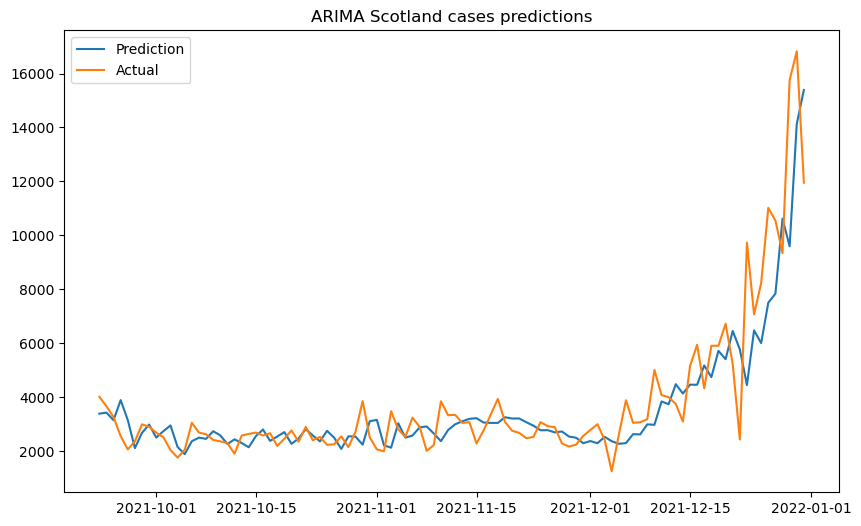

In [114]:
scotland_cases_1prediction = []
rolling_scotland_cases_day1= scotland_cases_valid.copy()
for i in range(len(scotland_cases_test)):
    scotland_cases_1 = arima(rolling_scotland_cases_day1, best_aic.loc['scotland cases'], 1)
    scotland_cases_1prediction.append(scotland_cases_1)
    rolling_scotland_cases_day1 = rolling_scotland_cases_day1.drop(index = rolling_scotland_cases_day1.index[0])
    rolling_scotland_cases_day1 = rolling_scotland_cases_day1.append(scotland_cases_test.iloc[i])

scotland_cases_1prediction = pd.Series(scotland_cases_1prediction)

scotland_cases_1prediction.index = scotland_cases_test.index

plot_predictions(scotland_cases_1prediction, scotland_cases_test, "ARIMA Scotland cases predictions")

In [115]:
scotland_cases_day_1_mae, scotland_cases_day_1_mse, scotland_cases_day_1_rmse = evaluate_model(scotland_cases_test, scotland_cases_1prediction)

print("scotland_cases_day_1_MAE:{}, scotland_cases_day_1_MSE:{}, scotland_cases_day_1_RMSE:{}".format(scotland_cases_day_1_mae, scotland_cases_day_1_mse, scotland_cases_day_1_rmse))

scotland_cases_day_1_MAE:770.0600903854472, scotland_cases_day_1_MSE:1627667.3894154942, scotland_cases_day_1_RMSE:1275.8006856149177


# Ireland cases ARIMA

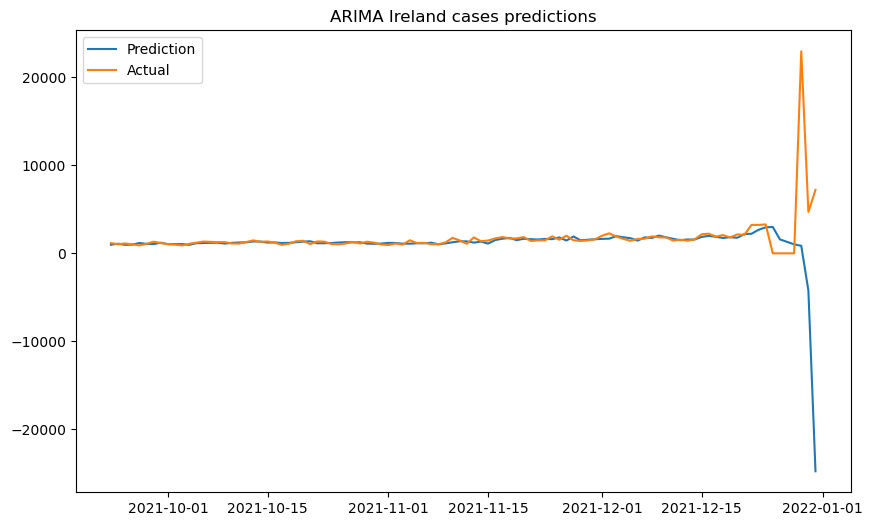

In [118]:

ireland_cases_1prediction = []
rolling_ireland_cases_day1= ireland_cases_valid.copy()
for i in range(len(ireland_cases_test)):
    ireland_cases_1 = arima(rolling_ireland_cases_day1, best_aic.loc['ireland cases'], 1)
    ireland_cases_1prediction.append(ireland_cases_1)
    rolling_ireland_cases_day1 = rolling_ireland_cases_day1.drop(index = rolling_ireland_cases_day1.index[0])
    rolling_ireland_cases_day1 = rolling_ireland_cases_day1.append(ireland_cases_test.iloc[i])

ireland_cases_1prediction = pd.Series(ireland_cases_1prediction)

ireland_cases_1prediction.index = ireland_cases_test.index

plot_predictions(ireland_cases_1prediction, ireland_cases_test, "ARIMA Ireland cases predictions")


In [119]:
ireland_cases_day_1_mae, ireland_cases_day_1_mse, ireland_cases_day_1_rmse = evaluate_model(ireland_cases_test, ireland_cases_1prediction)

print("ireland_cases_day_1_MAE:{}, ireland_cases_day_1_MSE:{}, ireland_cases_day_1_RMSE:{}".format(ireland_cases_day_1_mae, ireland_cases_day_1_mse, ireland_cases_day_1_rmse))

ireland_cases_day_1_MAE:866.2548972826154, ireland_cases_day_1_MSE:16123808.887030285, ireland_cases_day_1_RMSE:4015.446287404463


# Wales ARIMA fixed partitioning

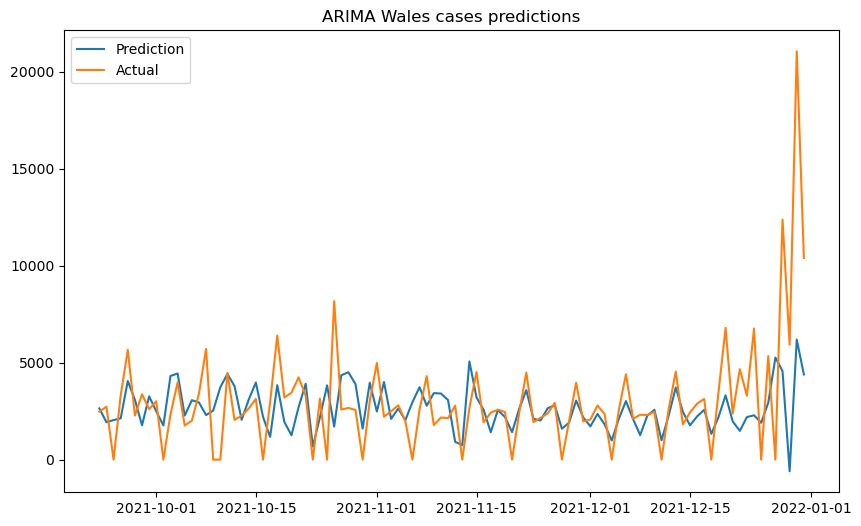

In [122]:
wales_cases_1prediction = []
rolling_wales_cases_day1= wales_cases_valid.copy()
for i in range(len(wales_cases_test)):
    wales_cases_1 = arima(rolling_wales_cases_day1, best_aic.loc['wales cases'], 1)
    wales_cases_1prediction.append(wales_cases_1)
    rolling_wales_cases_day1 = rolling_wales_cases_day1.drop(index = rolling_wales_cases_day1.index[0])
    rolling_wales_cases_day1 = rolling_wales_cases_day1.append(wales_cases_test.iloc[i])

wales_cases_1prediction = pd.Series(wales_cases_1prediction)

wales_cases_1prediction.index = wales_cases_test.index

plot_predictions(wales_cases_1prediction, wales_cases_test, "ARIMA Wales cases predictions")

In [123]:
wales_cases_day_1_mae, wales_cases_day_1_mse, wales_cases_day_1_rmse = evaluate_model(wales_cases_test, wales_cases_1prediction)

print("wales_cases_day_1_MAE:{}, wales_cases_day_1_MSE:{}, wales_cases_day_1_RMSE:{}".format(wales_cases_day_1_mae, wales_cases_day_1_mse, wales_cases_day_1_rmse))

wales_cases_day_1_MAE:1588.4278947923315, wales_cases_day_1_MSE:6502093.34742103, wales_cases_day_1_RMSE:2549.9202629535357


# Arima Death predictions

# National deaths ARIMA predictions


In [127]:
national_deaths_train , national_deaths_valid, national_deaths_test = data_split(national_deaths)

Next day national death prediction

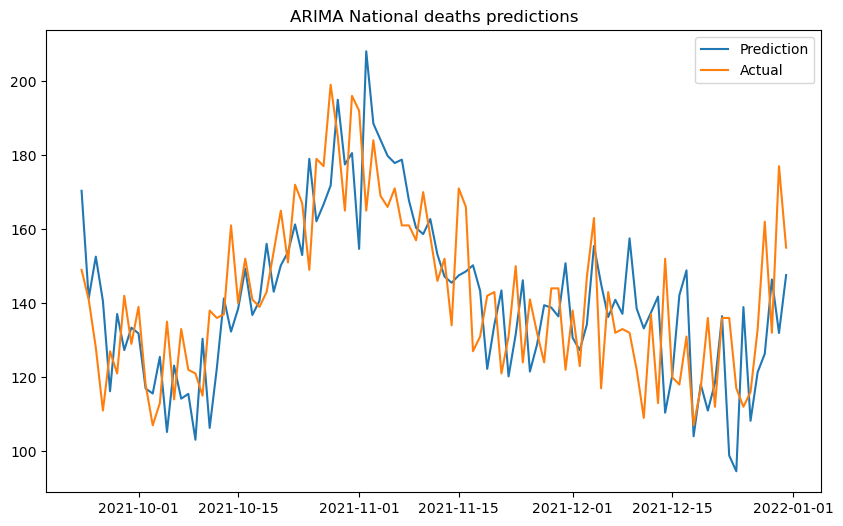

In [128]:
national_deaths_1prediction = []
rolling_national_deaths_day1= national_deaths_valid.copy()
for i in range(len(national_deaths_test)):
    national_deaths_1 = arima(rolling_national_deaths_day1, best_aic.loc['national deaths'], 1)
    national_deaths_1prediction.append(national_deaths_1)
    rolling_national_deaths_day1 = rolling_national_deaths_day1.drop(index = rolling_national_deaths_day1.index[0])
    rolling_national_deaths_day1 = rolling_national_deaths_day1.append(national_deaths_test.iloc[i])

national_deaths_1prediction = pd.Series(national_deaths_1prediction)

national_deaths_1prediction.index = national_deaths_test.index

plot_predictions(national_deaths_1prediction, national_deaths_test, "ARIMA National deaths predictions")

In [129]:
national_deaths_day_1_mae, national_deaths_day_1_mse, national_deaths_day_1_rmse = evaluate_model(national_deaths_test, national_deaths_1prediction)

print("national_deaths_day_1_MAE:{}, national_deaths_day_1_MSE:{}, national_deaths_day_1_RMSE:{}".format(national_deaths_day_1_mae, national_deaths_day_1_mse, national_deaths_day_1_rmse))

national_deaths_day_1_MAE:14.75993521464934, national_deaths_day_1_MSE:328.8526897805855, national_deaths_day_1_RMSE:18.13429595491883


# England deaths ARIMA predictions


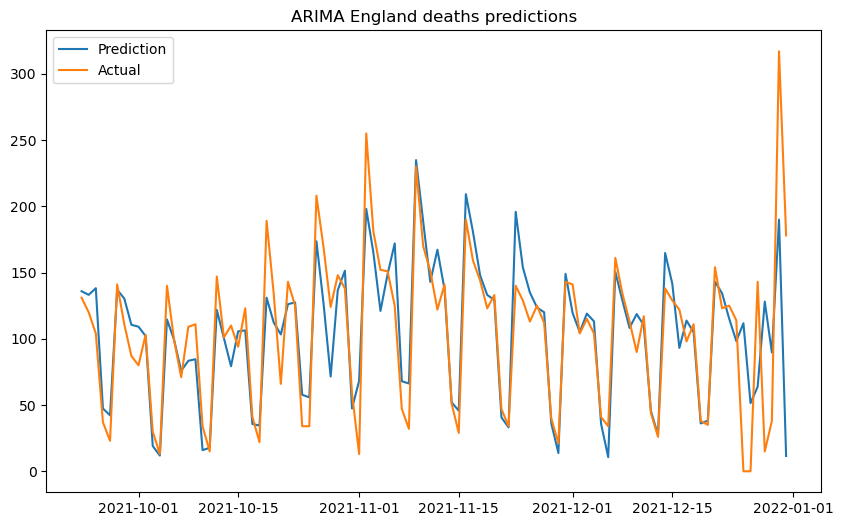

In [132]:
england_deaths_1prediction = []
rolling_england_deaths_day1= england_deaths_valid.copy()
for i in range(len(england_deaths_test)):
    england_deaths_1 = arima(rolling_england_deaths_day1, best_aic.loc['england deaths'], 1)
    england_deaths_1prediction.append(england_deaths_1)
    rolling_england_deaths_day1 = rolling_england_deaths_day1.drop(index = rolling_england_deaths_day1.index[0])
    rolling_england_deaths_day1 = rolling_england_deaths_day1.append(england_deaths_test.iloc[i])

england_deaths_1prediction = pd.Series(england_deaths_1prediction)

england_deaths_1prediction.index = england_deaths_test.index

plot_predictions(england_deaths_1prediction, england_deaths_test, "ARIMA England deaths predictions")

In [133]:
england_deaths_day_1_mae, england_deaths_day_1_mse, england_deaths_day_1_rmse = evaluate_model(england_deaths_test, england_deaths_1prediction)

print("england_deaths_day_1_MAE:{}, england_deaths_day_1_MSE:{}, england_deaths_day_1_RMSE:{}".format(england_deaths_day_1_mae, england_deaths_day_1_mse, england_deaths_day_1_rmse))

england_deaths_day_1_MAE:22.472514566547584, england_deaths_day_1_MSE:1259.8480879179215, england_deaths_day_1_RMSE:35.49433881505502


# Scotland deaths ARIMA predictions


In [136]:
scotland_deaths_train , scotland_deaths_valid, scotland_deaths_test = data_split(scotland_deaths)

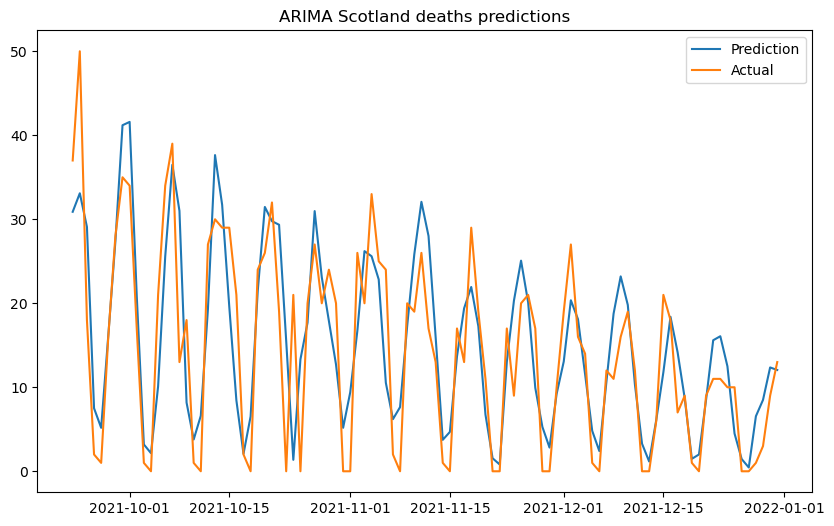

In [137]:
scotland_deaths_1prediction = []
rolling_scotland_deaths_day1= scotland_deaths_valid.copy()
for i in range(len(scotland_deaths_test)):
    scotland_deaths_1 = arima(rolling_scotland_deaths_day1, best_aic.loc['scotland deaths'], 1)
    scotland_deaths_1prediction.append(scotland_deaths_1)
    rolling_scotland_deaths_day1 = rolling_scotland_deaths_day1.drop(index = rolling_scotland_deaths_day1.index[0])
    rolling_scotland_deaths_day1 = rolling_scotland_deaths_day1.append(scotland_deaths_test.iloc[i])

scotland_deaths_1prediction = pd.Series(scotland_deaths_1prediction)

scotland_deaths_1prediction.index = scotland_deaths_test.index

plot_predictions(scotland_deaths_1prediction, scotland_deaths_test, "ARIMA Scotland deaths predictions")

In [138]:
scotland_deaths_day_1_mae, scotland_deaths_day_1_mse, scotland_deaths_day_1_rmse = evaluate_model(scotland_deaths_test, scotland_deaths_1prediction)

print("scotland_deaths_day_1_MAE:{}, scotland_deaths_day_1_MSE:{}, scotland_deaths_day_1_RMSE:{}".format(scotland_deaths_day_1_mae, scotland_deaths_day_1_mse, scotland_deaths_day_1_rmse))

scotland_deaths_day_1_MAE:5.300296600662206, scotland_deaths_day_1_MSE:44.989237743175465, scotland_deaths_day_1_RMSE:6.707401713269861


# Ireland deaths ARIMA predictions


In [141]:
ireland_deaths_train , ireland_deaths_valid, ireland_deaths_test = data_split(ireland_deaths)

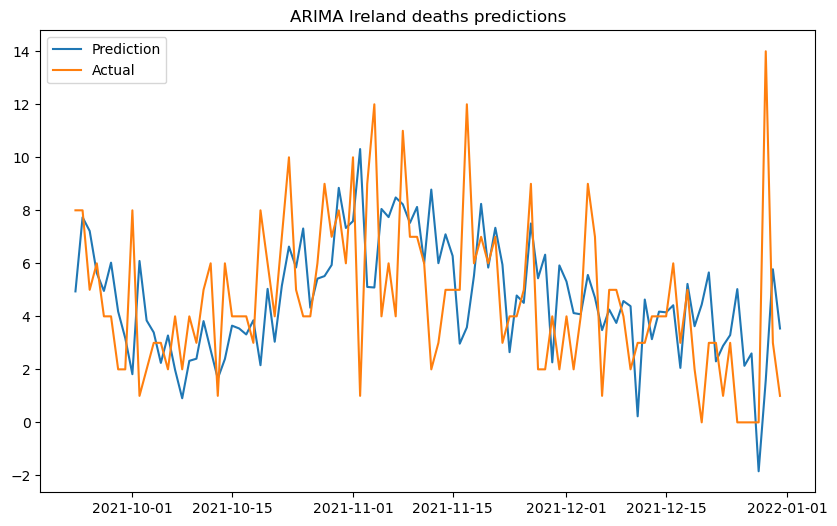

In [142]:
ireland_deaths_1prediction = []
rolling_ireland_deaths_day1= ireland_deaths_valid.copy()
for i in range(len(ireland_deaths_test)):
    ireland_deaths_1 = arima(rolling_ireland_deaths_day1, best_aic.loc['ireland deaths'], 1)
    ireland_deaths_1prediction.append(ireland_deaths_1)
    rolling_ireland_deaths_day1 = rolling_ireland_deaths_day1.drop(index = rolling_ireland_deaths_day1.index[0])
    rolling_ireland_deaths_day1 = rolling_ireland_deaths_day1.append(ireland_deaths_test.iloc[i])

ireland_deaths_1prediction = pd.Series(ireland_deaths_1prediction)

ireland_deaths_1prediction.index = ireland_deaths_test.index

plot_predictions(ireland_deaths_1prediction, ireland_deaths_test, "ARIMA Ireland deaths predictions")



In [143]:
ireland_deaths_day_1_mae, ireland_deaths_day_1_mse, ireland_deaths_day_1_rmse = evaluate_model(ireland_deaths_test, ireland_deaths_1prediction)

print("ireland_deaths_day_1_MAE:{}, ireland_deaths_day_1_MSE:{}, ireland_deaths_day_1_RMSE:{}".format(ireland_deaths_day_1_mae, ireland_deaths_day_1_mse, ireland_deaths_day_1_rmse))

ireland_deaths_day_1_MAE:2.1852219086173044, ireland_deaths_day_1_MSE:9.082034291885263, ireland_deaths_day_1_RMSE:3.0136413674963487


# Wales deaths ARIMA predictions


In [146]:
wales_deaths_train , wales_deaths_valid, wales_deaths_test = data_split(wales_deaths)

Next day Wales death prediction

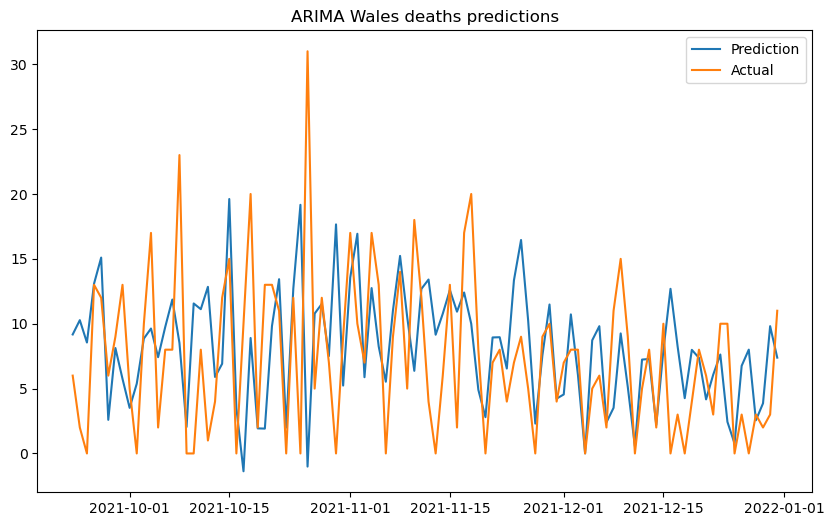

In [147]:
wales_deaths_1prediction = []
rolling_wales_deaths_day1= wales_deaths_valid.copy()
for i in range(len(wales_deaths_test)):
    wales_deaths_1 = arima(rolling_wales_deaths_day1, best_aic.loc['wales deaths'], 1)
    wales_deaths_1prediction.append(wales_deaths_1)
    rolling_wales_deaths_day1 = rolling_wales_deaths_day1.drop(index = rolling_wales_deaths_day1.index[0])
    rolling_wales_deaths_day1 = rolling_wales_deaths_day1.append(wales_deaths_test.iloc[i])

wales_deaths_1prediction = pd.Series(wales_deaths_1prediction)

wales_deaths_1prediction.index = wales_deaths_test.index

plot_predictions(wales_deaths_1prediction, wales_deaths_test, "ARIMA Wales deaths predictions")

In [148]:
wales_deaths_day_1_mae, wales_deaths_day_1_mse, wales_deaths_day_1_rmse = evaluate_model(wales_deaths_test, wales_deaths_1prediction)

print("wales_deaths_day_1_MAE:{}, wales_deaths_day_1_MSE:{}, wales_deaths_day_1_RMSE:{}".format(wales_deaths_day_1_mae, wales_deaths_day_1_mse, wales_deaths_day_1_rmse))

wales_deaths_day_1_MAE:4.756790218903471, wales_deaths_day_1_MSE:45.31350167689883, wales_deaths_day_1_RMSE:6.731530411199137


# Prophet model prediction

# National Cases Prophet Prediction

11:45:23 - cmdstanpy - INFO - Chain [1] start processing
11:45:23 - cmdstanpy - INFO - Chain [1] done processing
11:45:23 - cmdstanpy - ERROR - Chain [1] error: error during processing Operation not permitted
Optimization terminated abnormally. Falling back to Newton.
11:45:23 - cmdstanpy - INFO - Chain [1] start processing
11:45:23 - cmdstanpy - INFO - Chain [1] done processing
11:45:24 - cmdstanpy - INFO - Chain [1] start processing
11:45:24 - cmdstanpy - INFO - Chain [1] done processing
11:45:24 - cmdstanpy - ERROR - Chain [1] error: error during processing Operation not permitted
Optimization terminated abnormally. Falling back to Newton.
11:45:24 - cmdstanpy - INFO - Chain [1] start processing
11:45:25 - cmdstanpy - INFO - Chain [1] done processing
11:45:25 - cmdstanpy - INFO - Chain [1] start processing
11:45:25 - cmdstanpy - INFO - Chain [1] done processing
11:45:25 - cmdstanpy - ERROR - Chain [1] error: error during processing Operation not permitted
Optimization terminated abn

11:45:52 - cmdstanpy - INFO - Chain [1] start processing
11:45:52 - cmdstanpy - INFO - Chain [1] done processing
11:45:52 - cmdstanpy - INFO - Chain [1] start processing
11:45:52 - cmdstanpy - INFO - Chain [1] done processing
11:45:52 - cmdstanpy - ERROR - Chain [1] error: error during processing Operation not permitted
Optimization terminated abnormally. Falling back to Newton.
11:45:52 - cmdstanpy - INFO - Chain [1] start processing
11:45:53 - cmdstanpy - INFO - Chain [1] done processing
11:45:53 - cmdstanpy - INFO - Chain [1] start processing
11:45:53 - cmdstanpy - INFO - Chain [1] done processing
11:45:53 - cmdstanpy - ERROR - Chain [1] error: error during processing Operation not permitted
Optimization terminated abnormally. Falling back to Newton.
11:45:53 - cmdstanpy - INFO - Chain [1] start processing
11:45:53 - cmdstanpy - INFO - Chain [1] done processing
11:45:53 - cmdstanpy - INFO - Chain [1] start processing
11:45:53 - cmdstanpy - INFO - Chain [1] done processing
11:45:53 -

11:46:08 - cmdstanpy - ERROR - Chain [1] error: error during processing Operation not permitted
Optimization terminated abnormally. Falling back to Newton.
11:46:08 - cmdstanpy - INFO - Chain [1] start processing
11:46:08 - cmdstanpy - INFO - Chain [1] done processing
11:46:09 - cmdstanpy - INFO - Chain [1] start processing
11:46:09 - cmdstanpy - INFO - Chain [1] done processing
11:46:09 - cmdstanpy - ERROR - Chain [1] error: error during processing Operation not permitted
Optimization terminated abnormally. Falling back to Newton.
11:46:09 - cmdstanpy - INFO - Chain [1] start processing
11:46:10 - cmdstanpy - INFO - Chain [1] done processing
11:46:10 - cmdstanpy - INFO - Chain [1] start processing
11:46:10 - cmdstanpy - INFO - Chain [1] done processing
11:46:10 - cmdstanpy - ERROR - Chain [1] error: error during processing Operation not permitted
Optimization terminated abnormally. Falling back to Newton.
11:46:10 - cmdstanpy - INFO - Chain [1] start processing
11:46:11 - cmdstanpy - 

11:46:29 - cmdstanpy - INFO - Chain [1] done processing
11:46:29 - cmdstanpy - INFO - Chain [1] start processing
11:46:29 - cmdstanpy - INFO - Chain [1] done processing
11:46:29 - cmdstanpy - ERROR - Chain [1] error: error during processing Operation not permitted
Optimization terminated abnormally. Falling back to Newton.
11:46:29 - cmdstanpy - INFO - Chain [1] start processing
11:46:29 - cmdstanpy - INFO - Chain [1] done processing
11:46:30 - cmdstanpy - INFO - Chain [1] start processing
11:46:30 - cmdstanpy - INFO - Chain [1] done processing
11:46:30 - cmdstanpy - ERROR - Chain [1] error: error during processing Operation not permitted
Optimization terminated abnormally. Falling back to Newton.
11:46:30 - cmdstanpy - INFO - Chain [1] start processing
11:46:30 - cmdstanpy - INFO - Chain [1] done processing
11:46:30 - cmdstanpy - INFO - Chain [1] start processing
11:46:30 - cmdstanpy - INFO - Chain [1] done processing
11:46:30 - cmdstanpy - ERROR - Chain [1] error: error during proces

Optimization terminated abnormally. Falling back to Newton.
11:46:44 - cmdstanpy - INFO - Chain [1] start processing
11:46:44 - cmdstanpy - INFO - Chain [1] done processing
11:46:45 - cmdstanpy - INFO - Chain [1] start processing
11:46:45 - cmdstanpy - INFO - Chain [1] done processing
11:46:45 - cmdstanpy - ERROR - Chain [1] error: error during processing Operation not permitted
Optimization terminated abnormally. Falling back to Newton.
11:46:45 - cmdstanpy - INFO - Chain [1] start processing
11:46:45 - cmdstanpy - INFO - Chain [1] done processing
11:46:45 - cmdstanpy - INFO - Chain [1] start processing
11:46:45 - cmdstanpy - INFO - Chain [1] done processing
11:46:45 - cmdstanpy - ERROR - Chain [1] error: error during processing Operation not permitted
Optimization terminated abnormally. Falling back to Newton.
11:46:45 - cmdstanpy - INFO - Chain [1] start processing
11:46:46 - cmdstanpy - INFO - Chain [1] done processing
11:46:46 - cmdstanpy - INFO - Chain [1] start processing
11:46:

11:46:59 - cmdstanpy - INFO - Chain [1] start processing
11:46:59 - cmdstanpy - INFO - Chain [1] done processing
11:46:59 - cmdstanpy - ERROR - Chain [1] error: error during processing Operation not permitted
Optimization terminated abnormally. Falling back to Newton.
11:46:59 - cmdstanpy - INFO - Chain [1] start processing
11:46:59 - cmdstanpy - INFO - Chain [1] done processing
11:46:59 - cmdstanpy - INFO - Chain [1] start processing
11:46:59 - cmdstanpy - INFO - Chain [1] done processing
11:46:59 - cmdstanpy - ERROR - Chain [1] error: error during processing Operation not permitted
Optimization terminated abnormally. Falling back to Newton.
11:47:00 - cmdstanpy - INFO - Chain [1] start processing
11:47:00 - cmdstanpy - INFO - Chain [1] done processing
11:47:00 - cmdstanpy - INFO - Chain [1] start processing
11:47:00 - cmdstanpy - INFO - Chain [1] done processing
11:47:00 - cmdstanpy - ERROR - Chain [1] error: error during processing Operation not permitted
Optimization terminated abn

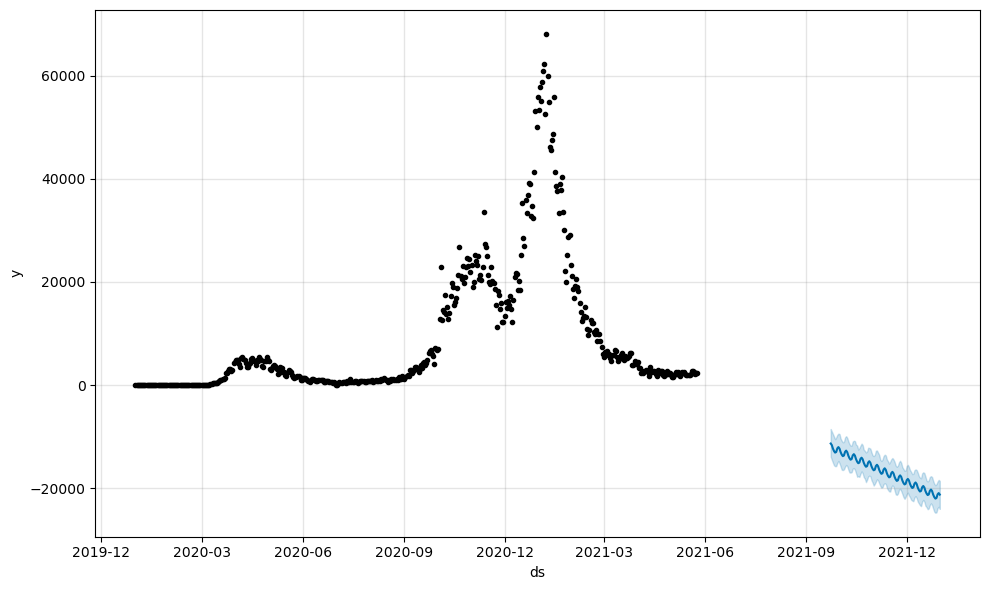

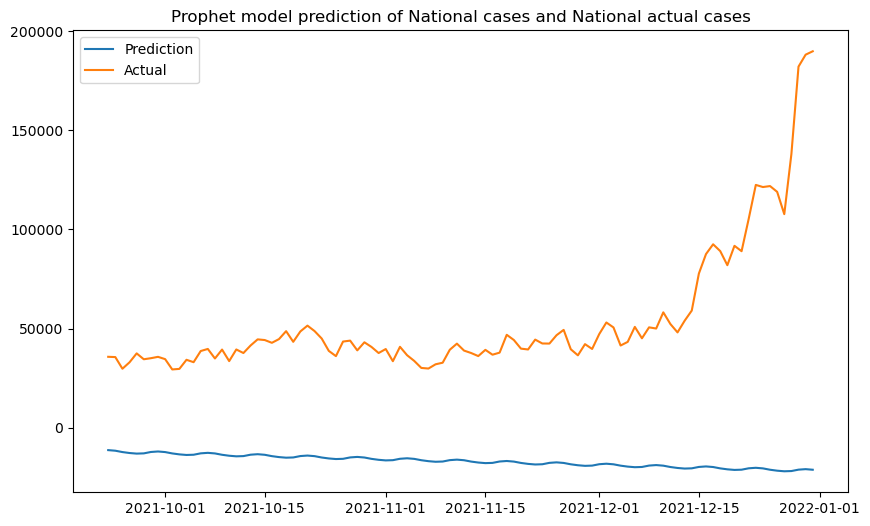

national_cases_day_1_mae_pro:70925.90030537828, national_cases_day_1_mse_pro:6249727094.068356, national_cases_day_1_rmse_pro:79055.21547670562


In [149]:
national_cases_train_pro , national_cases_valid_pro, national_cases_test_pro = national_train.copy() , national_valid.copy(), national_test.copy()

national_cases_train_pro = national_cases_train_pro.reset_index()
national_cases_valid_pro = national_cases_valid_pro.reset_index()
national_cases_test_pro = national_cases_test_pro.reset_index()

national_cases_train_pro.columns = ['ds','y'] 
national_cases_valid_pro.columns = ['ds','y']
national_cases_test_pro.columns = ['ds','y']

#prophet model hyperparameter tuning
national_cases_param_grid = {
    'changepoint_prior_scale': [0.001, 0.01, 0.1, 0.5, 1.0, 10.0],
    'seasonality_prior_scale': [0.01, 0.1, 1.0, 10.0],
    'seasonality_mode': ['multiplicative', 'additive']
    
}





# Use Parameter grid search to find the best hyperparameters
national_cases_best_params = {}
national_cases_lowest_rmse = float('inf')

for params in ParameterGrid(national_cases_param_grid):
    national_cases_model = Prophet(**params)
    national_cases_model.fit(national_cases_train_pro)
    national_cases_forecast = national_cases_model.predict(national_cases_valid_pro)
    national_cases_rmse = np.sqrt(mean_squared_error(national_cases_valid_pro['y'], national_cases_forecast['yhat']))
    if national_cases_rmse < national_cases_lowest_rmse:
        national_cases_best_params = params
        national_cases_lowest_rmse = national_cases_rmse

        



#prophet model implementation with best parameters for 1 day rolling forecast
rolling_national_cases_valid_pro_1d = national_cases_valid_pro.copy()
national_cases_predictions_pro_1d = []
for i in range(len(national_cases_test_pro)):  
    national_cases_prophet_1d = Prophet(**national_cases_best_params)
    national_cases_prophet_1d.fit(rolling_national_cases_valid_pro_1d)
    national_cases_future_1d = national_cases_test_pro.iloc[i:i+1]
    national_cases_forecast_1d = national_cases_model.predict(national_cases_future_1d)
    national_cases_predictions_pro_1d.append(national_cases_forecast_1d)
    rolling_national_cases_valid_pro_1d = rolling_national_cases_valid_pro_1d.drop(index = rolling_national_cases_valid_pro_1d.index[0])
    rolling_national_cases_valid_pro_1d = rolling_national_cases_valid_pro_1d.append(national_cases_future_1d)
    
national_cases_predictions_pro_1d_df= pd.DataFrame()
for i in range(len(national_cases_predictions_pro_1d)):
    national_cases_predictions_pro_1d_df= national_cases_predictions_pro_1d_df.append(national_cases_predictions_pro_1d[i])
    
national_cases_pro_predicted_val_1d = pd.Series(national_cases_predictions_pro_1d_df['yhat'])
national_cases_pro_actual_val_1d = national_cases_test_pro.set_index('ds')
national_cases_pro_predicted_val_1d.index= national_cases_pro_actual_val_1d.index
national_cases_model.plot(national_cases_predictions_pro_1d_df)

plot_predictions(national_cases_pro_predicted_val_1d, national_cases_pro_actual_val_1d, "Prophet model prediction of National cases and National actual cases")

national_cases_day_1_mae_pro, national_cases_day_1_mse_pro, national_cases_day_1_rmse_pro = evaluate_model(national_cases_pro_actual_val_1d, national_cases_pro_predicted_val_1d)

print("national_cases_day_1_mae_pro:{}, national_cases_day_1_mse_pro:{}, national_cases_day_1_rmse_pro:{}".format(national_cases_day_1_mae_pro, national_cases_day_1_mse_pro, national_cases_day_1_rmse_pro))

# England_cases_prophet_prediction

In [150]:
england_cases_train_pro , england_cases_valid_pro, england_cases_test_pro = england_cases_train.copy() , england_cases_valid.copy(), england_cases_test.copy()

In [151]:
england_cases_train_pro = england_cases_train_pro.reset_index()
england_cases_valid_pro = england_cases_valid_pro.reset_index()
england_cases_test_pro = england_cases_test_pro.reset_index()

In [152]:
england_cases_train_pro.columns = ['ds','y'] 
england_cases_valid_pro.columns = ['ds','y']
england_cases_test_pro.columns = ['ds','y']

In [153]:
#prophet model hyperparameter tuning
england_cases_param_grid = {
    'changepoint_prior_scale': [0.001, 0.01, 0.1, 0.5, 1.0, 10.0],
    'seasonality_prior_scale': [0.01, 0.1, 1.0, 10.0],
    'seasonality_mode': ['multiplicative', 'additive']
    
}




In [154]:
from sklearn.model_selection import ParameterGrid
# Use Parameter grid search to find the best hyperparameters
england_cases_best_params = {}
england_cases_lowest_rmse = float('inf')

for params in ParameterGrid(england_cases_param_grid):
    england_cases_model = Prophet(**params)
    england_cases_model.fit(england_cases_train_pro)
    england_cases_forecast = england_cases_model.predict(england_cases_test_pro)
    england_cases_rmse = np.sqrt(mean_squared_error(england_cases_test_pro['y'], england_cases_forecast['yhat']))
    if england_cases_rmse < england_cases_lowest_rmse:
        england_cases_best_params = params
        england_cases_lowest_rmse = england_cases_rmse

        

11:47:07 - cmdstanpy - INFO - Chain [1] start processing
11:47:07 - cmdstanpy - INFO - Chain [1] done processing
11:47:07 - cmdstanpy - ERROR - Chain [1] error: error during processing Operation not permitted
Optimization terminated abnormally. Falling back to Newton.
11:47:08 - cmdstanpy - INFO - Chain [1] start processing
11:47:08 - cmdstanpy - INFO - Chain [1] done processing
11:47:09 - cmdstanpy - INFO - Chain [1] start processing
11:47:09 - cmdstanpy - INFO - Chain [1] done processing
11:47:09 - cmdstanpy - ERROR - Chain [1] error: error during processing Operation not permitted
Optimization terminated abnormally. Falling back to Newton.
11:47:09 - cmdstanpy - INFO - Chain [1] start processing
11:47:09 - cmdstanpy - INFO - Chain [1] done processing
11:47:10 - cmdstanpy - INFO - Chain [1] start processing
11:47:10 - cmdstanpy - INFO - Chain [1] done processing
11:47:10 - cmdstanpy - ERROR - Chain [1] error: error during processing Operation not permitted
Optimization terminated abn

In [155]:
#prophet model implementation with best parameters for 1 day rolling forecast
rolling_england_cases_valid_pro_1d = england_cases_valid_pro.copy()
england_cases_predictions_pro_1d = []
for i in range(len(england_cases_test_pro)):  
    england_cases_prophet_1d = Prophet(**england_cases_best_params)
    england_cases_prophet_1d.fit(rolling_england_cases_valid_pro_1d)
    england_cases_future_1d = england_cases_test_pro.iloc[i:i+1]
    england_cases_forecast_1d = england_cases_model.predict(england_cases_future_1d)
    england_cases_predictions_pro_1d.append(england_cases_forecast_1d)
    rolling_england_cases_valid_pro_1d = rolling_england_cases_valid_pro_1d.drop(index = rolling_england_cases_valid_pro_1d.index[0])
    rolling_england_cases_valid_pro_1d = rolling_england_cases_valid_pro_1d.append(england_cases_future_1d)



11:47:38 - cmdstanpy - INFO - Chain [1] start processing
11:47:38 - cmdstanpy - INFO - Chain [1] done processing
11:47:38 - cmdstanpy - ERROR - Chain [1] error: error during processing Operation not permitted
Optimization terminated abnormally. Falling back to Newton.
11:47:38 - cmdstanpy - INFO - Chain [1] start processing
11:47:38 - cmdstanpy - INFO - Chain [1] done processing
11:47:38 - cmdstanpy - INFO - Chain [1] start processing
11:47:38 - cmdstanpy - INFO - Chain [1] done processing
11:47:38 - cmdstanpy - ERROR - Chain [1] error: error during processing Operation not permitted
Optimization terminated abnormally. Falling back to Newton.
11:47:38 - cmdstanpy - INFO - Chain [1] start processing
11:47:39 - cmdstanpy - INFO - Chain [1] done processing
11:47:39 - cmdstanpy - INFO - Chain [1] start processing
11:47:39 - cmdstanpy - INFO - Chain [1] done processing
11:47:39 - cmdstanpy - ERROR - Chain [1] error: error during processing Operation not permitted
Optimization terminated abn

Optimization terminated abnormally. Falling back to Newton.
11:47:49 - cmdstanpy - INFO - Chain [1] start processing
11:47:49 - cmdstanpy - INFO - Chain [1] done processing
11:47:50 - cmdstanpy - INFO - Chain [1] start processing
11:47:50 - cmdstanpy - INFO - Chain [1] done processing
11:47:50 - cmdstanpy - ERROR - Chain [1] error: error during processing Operation not permitted
Optimization terminated abnormally. Falling back to Newton.
11:47:50 - cmdstanpy - INFO - Chain [1] start processing
11:47:50 - cmdstanpy - INFO - Chain [1] done processing
11:47:50 - cmdstanpy - INFO - Chain [1] start processing
11:47:50 - cmdstanpy - INFO - Chain [1] done processing
11:47:50 - cmdstanpy - ERROR - Chain [1] error: error during processing Operation not permitted
Optimization terminated abnormally. Falling back to Newton.
11:47:50 - cmdstanpy - INFO - Chain [1] start processing
11:47:50 - cmdstanpy - INFO - Chain [1] done processing
11:47:51 - cmdstanpy - INFO - Chain [1] start processing
11:47:

11:48:04 - cmdstanpy - INFO - Chain [1] done processing
11:48:04 - cmdstanpy - ERROR - Chain [1] error: error during processing Operation not permitted
Optimization terminated abnormally. Falling back to Newton.
11:48:04 - cmdstanpy - INFO - Chain [1] start processing
11:48:06 - cmdstanpy - INFO - Chain [1] done processing
11:48:06 - cmdstanpy - INFO - Chain [1] start processing
11:48:06 - cmdstanpy - INFO - Chain [1] done processing
11:48:06 - cmdstanpy - ERROR - Chain [1] error: error during processing Operation not permitted
Optimization terminated abnormally. Falling back to Newton.
11:48:07 - cmdstanpy - INFO - Chain [1] start processing
11:48:07 - cmdstanpy - INFO - Chain [1] done processing
11:48:07 - cmdstanpy - INFO - Chain [1] start processing
11:48:07 - cmdstanpy - INFO - Chain [1] done processing
11:48:07 - cmdstanpy - ERROR - Chain [1] error: error during processing Operation not permitted
Optimization terminated abnormally. Falling back to Newton.
11:48:07 - cmdstanpy - I

11:48:26 - cmdstanpy - INFO - Chain [1] done processing
11:48:26 - cmdstanpy - ERROR - Chain [1] error: error during processing Operation not permitted
Optimization terminated abnormally. Falling back to Newton.
11:48:26 - cmdstanpy - INFO - Chain [1] start processing
11:48:26 - cmdstanpy - INFO - Chain [1] done processing
11:48:26 - cmdstanpy - INFO - Chain [1] start processing
11:48:26 - cmdstanpy - INFO - Chain [1] done processing
11:48:26 - cmdstanpy - ERROR - Chain [1] error: error during processing Operation not permitted
Optimization terminated abnormally. Falling back to Newton.
11:48:26 - cmdstanpy - INFO - Chain [1] start processing
11:48:26 - cmdstanpy - INFO - Chain [1] done processing
11:48:27 - cmdstanpy - INFO - Chain [1] start processing
11:48:27 - cmdstanpy - INFO - Chain [1] done processing
11:48:27 - cmdstanpy - ERROR - Chain [1] error: error during processing Operation not permitted
Optimization terminated abnormally. Falling back to Newton.
11:48:27 - cmdstanpy - I

11:48:42 - cmdstanpy - INFO - Chain [1] done processing
11:48:42 - cmdstanpy - INFO - Chain [1] start processing
11:48:42 - cmdstanpy - INFO - Chain [1] done processing
11:48:42 - cmdstanpy - ERROR - Chain [1] error: error during processing Operation not permitted
Optimization terminated abnormally. Falling back to Newton.
11:48:42 - cmdstanpy - INFO - Chain [1] start processing
11:48:43 - cmdstanpy - INFO - Chain [1] done processing
11:48:43 - cmdstanpy - INFO - Chain [1] start processing
11:48:43 - cmdstanpy - INFO - Chain [1] done processing
11:48:43 - cmdstanpy - ERROR - Chain [1] error: error during processing Operation not permitted
Optimization terminated abnormally. Falling back to Newton.
11:48:43 - cmdstanpy - INFO - Chain [1] start processing
11:48:44 - cmdstanpy - INFO - Chain [1] done processing
11:48:44 - cmdstanpy - INFO - Chain [1] start processing
11:48:44 - cmdstanpy - INFO - Chain [1] done processing
11:48:44 - cmdstanpy - ERROR - Chain [1] error: error during proces

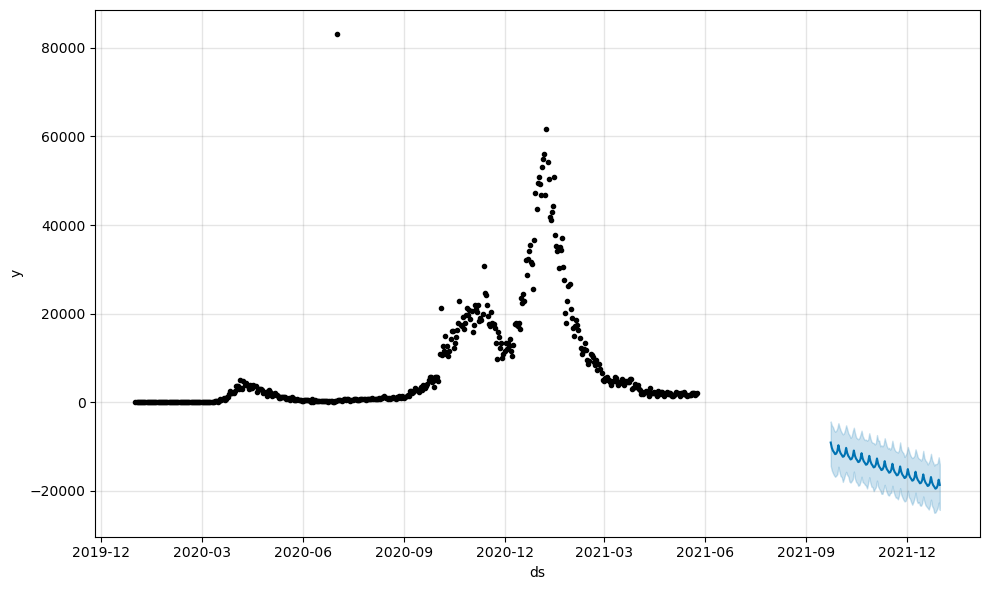

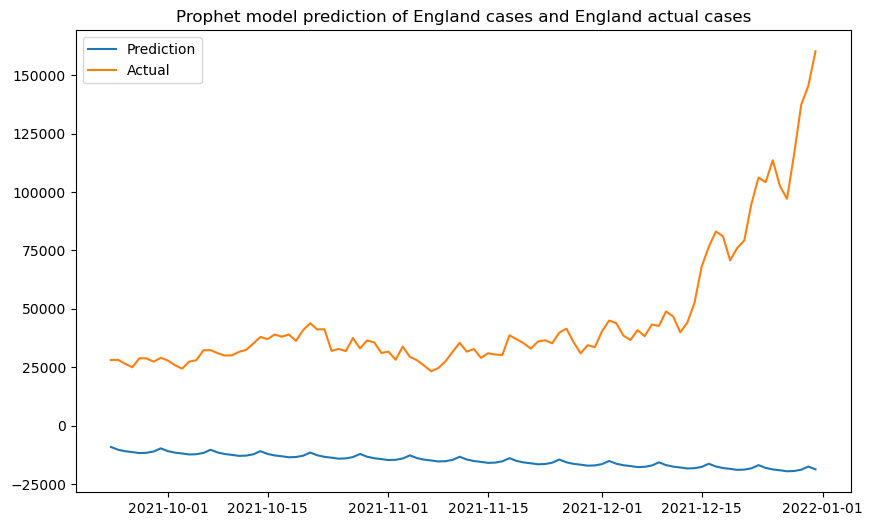

england_cases_day_1_mae_pro:60468.87286880203, england_cases_day_1_mse_pro:4524196370.891235, england_cases_day_1_rmse_pro:67262.14664200984


In [156]:
england_cases_predictions_pro_1d_df= pd.DataFrame()
for i in range(len(england_cases_predictions_pro_1d)):
    england_cases_predictions_pro_1d_df= england_cases_predictions_pro_1d_df.append(england_cases_predictions_pro_1d[i])
    
england_cases_pro_predicted_val_1d = pd.Series(england_cases_predictions_pro_1d_df['yhat'])
england_cases_pro_actual_val_1d = england_cases_test_pro.set_index('ds')
england_cases_pro_predicted_val_1d.index= england_cases_pro_actual_val_1d.index
england_cases_model.plot(england_cases_predictions_pro_1d_df)

plot_predictions(england_cases_pro_predicted_val_1d, england_cases_pro_actual_val_1d, "Prophet model prediction of England cases and England actual cases")

england_cases_day_1_mae_pro, england_cases_day_1_mse_pro, england_cases_day_1_rmse_pro = evaluate_model(england_cases_pro_actual_val_1d, england_cases_pro_predicted_val_1d)

print("england_cases_day_1_mae_pro:{}, england_cases_day_1_mse_pro:{}, england_cases_day_1_rmse_pro:{}".format(england_cases_day_1_mae_pro, england_cases_day_1_mse_pro, england_cases_day_1_rmse_pro))

In [157]:
len(england_cases_pro_predicted_val_1d)

100

**Ireland**

11:48:47 - cmdstanpy - INFO - Chain [1] start processing
11:48:47 - cmdstanpy - INFO - Chain [1] done processing
11:48:48 - cmdstanpy - INFO - Chain [1] start processing
11:48:48 - cmdstanpy - INFO - Chain [1] done processing
11:48:48 - cmdstanpy - INFO - Chain [1] start processing
11:48:48 - cmdstanpy - INFO - Chain [1] done processing
11:48:49 - cmdstanpy - INFO - Chain [1] start processing
11:48:49 - cmdstanpy - INFO - Chain [1] done processing
11:48:49 - cmdstanpy - INFO - Chain [1] start processing
11:48:49 - cmdstanpy - INFO - Chain [1] done processing
11:48:49 - cmdstanpy - INFO - Chain [1] start processing
11:48:49 - cmdstanpy - INFO - Chain [1] done processing
11:48:50 - cmdstanpy - INFO - Chain [1] start processing
11:48:50 - cmdstanpy - INFO - Chain [1] done processing
11:48:50 - cmdstanpy - INFO - Chain [1] start processing
11:48:50 - cmdstanpy - INFO - Chain [1] done processing
11:48:50 - cmdstanpy - INFO - Chain [1] start processing
11:48:51 - cmdstanpy - INFO - Chain [1]

11:49:18 - cmdstanpy - ERROR - Chain [1] error: error during processing Operation not permitted
Optimization terminated abnormally. Falling back to Newton.
11:49:18 - cmdstanpy - INFO - Chain [1] start processing
11:49:18 - cmdstanpy - INFO - Chain [1] done processing
11:49:18 - cmdstanpy - INFO - Chain [1] start processing
11:49:18 - cmdstanpy - INFO - Chain [1] done processing
11:49:18 - cmdstanpy - ERROR - Chain [1] error: error during processing Operation not permitted
Optimization terminated abnormally. Falling back to Newton.
11:49:18 - cmdstanpy - INFO - Chain [1] start processing
11:49:19 - cmdstanpy - INFO - Chain [1] done processing
11:49:19 - cmdstanpy - INFO - Chain [1] start processing
11:49:19 - cmdstanpy - INFO - Chain [1] done processing
11:49:19 - cmdstanpy - ERROR - Chain [1] error: error during processing Operation not permitted
Optimization terminated abnormally. Falling back to Newton.
11:49:19 - cmdstanpy - INFO - Chain [1] start processing
11:49:20 - cmdstanpy - 

11:49:31 - cmdstanpy - INFO - Chain [1] done processing
11:49:31 - cmdstanpy - INFO - Chain [1] start processing
11:49:31 - cmdstanpy - INFO - Chain [1] done processing
11:49:31 - cmdstanpy - ERROR - Chain [1] error: error during processing Operation not permitted
Optimization terminated abnormally. Falling back to Newton.
11:49:31 - cmdstanpy - INFO - Chain [1] start processing
11:49:32 - cmdstanpy - INFO - Chain [1] done processing
11:49:32 - cmdstanpy - INFO - Chain [1] start processing
11:49:32 - cmdstanpy - INFO - Chain [1] done processing
11:49:32 - cmdstanpy - ERROR - Chain [1] error: error during processing Operation not permitted
Optimization terminated abnormally. Falling back to Newton.
11:49:32 - cmdstanpy - INFO - Chain [1] start processing
11:49:32 - cmdstanpy - INFO - Chain [1] done processing
11:49:32 - cmdstanpy - INFO - Chain [1] start processing
11:49:32 - cmdstanpy - INFO - Chain [1] done processing
11:49:32 - cmdstanpy - ERROR - Chain [1] error: error during proces

Optimization terminated abnormally. Falling back to Newton.
11:49:49 - cmdstanpy - INFO - Chain [1] start processing
11:49:49 - cmdstanpy - INFO - Chain [1] done processing
11:49:49 - cmdstanpy - INFO - Chain [1] start processing
11:49:49 - cmdstanpy - INFO - Chain [1] done processing
11:49:49 - cmdstanpy - ERROR - Chain [1] error: error during processing Operation not permitted
Optimization terminated abnormally. Falling back to Newton.
11:49:49 - cmdstanpy - INFO - Chain [1] start processing
11:49:49 - cmdstanpy - INFO - Chain [1] done processing
11:49:50 - cmdstanpy - INFO - Chain [1] start processing
11:49:50 - cmdstanpy - INFO - Chain [1] done processing
11:49:50 - cmdstanpy - ERROR - Chain [1] error: error during processing Operation not permitted
Optimization terminated abnormally. Falling back to Newton.
11:49:50 - cmdstanpy - INFO - Chain [1] start processing
11:49:50 - cmdstanpy - INFO - Chain [1] done processing
11:49:50 - cmdstanpy - INFO - Chain [1] start processing
11:49:

11:50:07 - cmdstanpy - INFO - Chain [1] done processing
11:50:07 - cmdstanpy - INFO - Chain [1] start processing
11:50:07 - cmdstanpy - INFO - Chain [1] done processing
11:50:07 - cmdstanpy - INFO - Chain [1] start processing
11:50:07 - cmdstanpy - INFO - Chain [1] done processing
11:50:07 - cmdstanpy - ERROR - Chain [1] error: error during processing Operation not permitted
Optimization terminated abnormally. Falling back to Newton.
11:50:07 - cmdstanpy - INFO - Chain [1] start processing
11:50:08 - cmdstanpy - INFO - Chain [1] done processing
11:50:08 - cmdstanpy - INFO - Chain [1] start processing
11:50:08 - cmdstanpy - INFO - Chain [1] done processing
11:50:08 - cmdstanpy - ERROR - Chain [1] error: error during processing Operation not permitted
Optimization terminated abnormally. Falling back to Newton.
11:50:08 - cmdstanpy - INFO - Chain [1] start processing
11:50:09 - cmdstanpy - INFO - Chain [1] done processing
11:50:09 - cmdstanpy - INFO - Chain [1] start processing
11:50:09 -

Optimization terminated abnormally. Falling back to Newton.
11:50:29 - cmdstanpy - INFO - Chain [1] start processing
11:50:30 - cmdstanpy - INFO - Chain [1] done processing
11:50:30 - cmdstanpy - INFO - Chain [1] start processing
11:50:30 - cmdstanpy - INFO - Chain [1] done processing
11:50:30 - cmdstanpy - ERROR - Chain [1] error: error during processing Operation not permitted
Optimization terminated abnormally. Falling back to Newton.
11:50:30 - cmdstanpy - INFO - Chain [1] start processing
11:50:30 - cmdstanpy - INFO - Chain [1] done processing


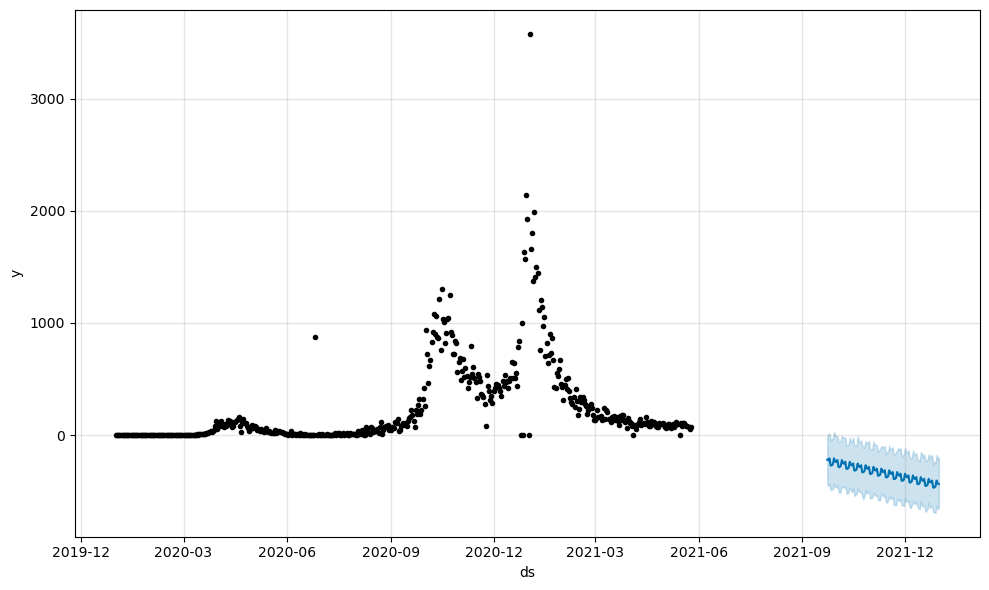

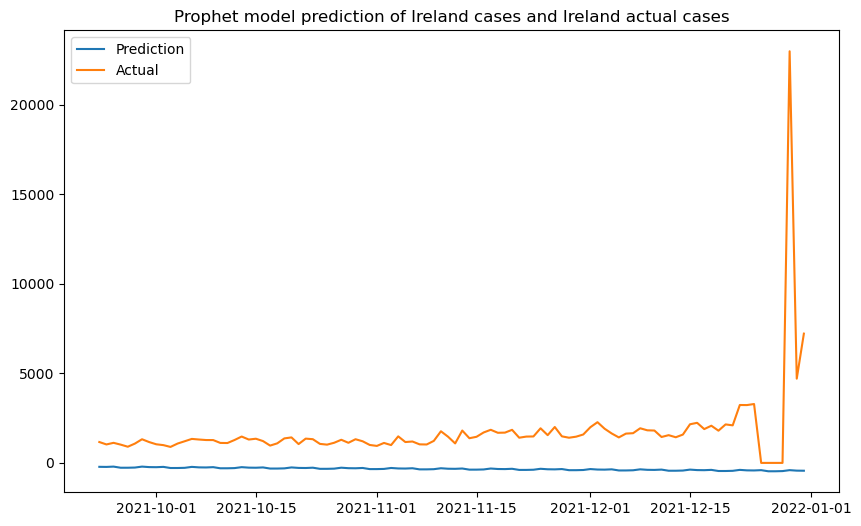

ireland_cases_day_1_mae_pro:2062.976111017073, ireland_cases_day_1_mse_pro:9608829.408882096, ireland_cases_day_1_rmse_pro:3099.811189231063


In [158]:
ireland_cases_train_pro , ireland_cases_valid_pro, ireland_cases_test_pro = ireland_cases_train.copy() , ireland_cases_valid.copy(), ireland_cases_test.copy()

ireland_cases_train_pro = ireland_cases_train_pro.reset_index()
ireland_cases_valid_pro = ireland_cases_valid_pro.reset_index()
ireland_cases_test_pro = ireland_cases_test_pro.reset_index()

ireland_cases_train_pro.columns = ['ds','y'] 
ireland_cases_valid_pro.columns = ['ds','y']
ireland_cases_test_pro.columns = ['ds','y']

#prophet model hyperparameter tuning
ireland_cases_param_grid = {
    'changepoint_prior_scale': [0.001, 0.01, 0.1, 0.5, 1.0, 10.0],
    'seasonality_prior_scale': [0.01, 0.1, 1.0, 10.0],
    'seasonality_mode': ['multiplicative', 'additive']
    
}





# Use Parameter grid search to find the best hyperparameters
ireland_cases_best_params = {}
ireland_cases_lowest_rmse = float('inf')

for params in ParameterGrid(ireland_cases_param_grid):
    ireland_cases_model = Prophet(**params)
    ireland_cases_model.fit(ireland_cases_train_pro)
    ireland_cases_forecast = ireland_cases_model.predict(ireland_cases_valid_pro)
    ireland_cases_rmse = np.sqrt(mean_squared_error(ireland_cases_valid_pro['y'], ireland_cases_forecast['yhat']))
    if ireland_cases_rmse < ireland_cases_lowest_rmse:
        ireland_cases_best_params = params
        ireland_cases_lowest_rmse = ireland_cases_rmse

        



#prophet model implementation with best parameters for 1 day rolling forecast
rolling_ireland_cases_valid_pro_1d = ireland_cases_valid_pro.copy()
ireland_cases_predictions_pro_1d = []
for i in range(len(ireland_cases_test_pro)):  
    ireland_cases_prophet_1d = Prophet(**ireland_cases_best_params)
    ireland_cases_prophet_1d.fit(rolling_ireland_cases_valid_pro_1d)
    ireland_cases_future_1d = ireland_cases_test_pro.iloc[i:i+1]
    ireland_cases_forecast_1d = ireland_cases_model.predict(ireland_cases_future_1d)
    ireland_cases_predictions_pro_1d.append(ireland_cases_forecast_1d)
    rolling_ireland_cases_valid_pro_1d = rolling_ireland_cases_valid_pro_1d.drop(index = rolling_ireland_cases_valid_pro_1d.index[0])
    rolling_ireland_cases_valid_pro_1d = rolling_ireland_cases_valid_pro_1d.append(ireland_cases_future_1d)
    
ireland_cases_predictions_pro_1d_df= pd.DataFrame()
for i in range(len(ireland_cases_predictions_pro_1d)):
    ireland_cases_predictions_pro_1d_df= ireland_cases_predictions_pro_1d_df.append(ireland_cases_predictions_pro_1d[i])
    
ireland_cases_pro_predicted_val_1d = pd.Series(ireland_cases_predictions_pro_1d_df['yhat'])
ireland_cases_pro_actual_val_1d = ireland_cases_test_pro.set_index('ds')
ireland_cases_pro_predicted_val_1d.index= ireland_cases_pro_actual_val_1d.index
ireland_cases_model.plot(ireland_cases_predictions_pro_1d_df)

plot_predictions(ireland_cases_pro_predicted_val_1d, ireland_cases_pro_actual_val_1d, "Prophet model prediction of Ireland cases and Ireland actual cases")

ireland_cases_day_1_mae_pro, ireland_cases_day_1_mse_pro, ireland_cases_day_1_rmse_pro = evaluate_model(ireland_cases_pro_actual_val_1d, ireland_cases_pro_predicted_val_1d)

print("ireland_cases_day_1_mae_pro:{}, ireland_cases_day_1_mse_pro:{}, ireland_cases_day_1_rmse_pro:{}".format(ireland_cases_day_1_mae_pro, ireland_cases_day_1_mse_pro, ireland_cases_day_1_rmse_pro))

**Scotland**

11:50:31 - cmdstanpy - INFO - Chain [1] start processing
11:50:31 - cmdstanpy - INFO - Chain [1] done processing
11:50:31 - cmdstanpy - ERROR - Chain [1] error: error during processing Operation not permitted
Optimization terminated abnormally. Falling back to Newton.
11:50:31 - cmdstanpy - INFO - Chain [1] start processing
11:50:32 - cmdstanpy - INFO - Chain [1] done processing
11:50:33 - cmdstanpy - INFO - Chain [1] start processing
11:50:33 - cmdstanpy - INFO - Chain [1] done processing
11:50:33 - cmdstanpy - ERROR - Chain [1] error: error during processing Operation not permitted
Optimization terminated abnormally. Falling back to Newton.
11:50:33 - cmdstanpy - INFO - Chain [1] start processing
11:50:34 - cmdstanpy - INFO - Chain [1] done processing
11:50:34 - cmdstanpy - INFO - Chain [1] start processing
11:50:34 - cmdstanpy - INFO - Chain [1] done processing
11:50:34 - cmdstanpy - ERROR - Chain [1] error: error during processing Operation not permitted
Optimization terminated abn

11:51:05 - cmdstanpy - INFO - Chain [1] start processing
11:51:05 - cmdstanpy - INFO - Chain [1] done processing
11:51:05 - cmdstanpy - INFO - Chain [1] start processing
11:51:05 - cmdstanpy - INFO - Chain [1] done processing
11:51:05 - cmdstanpy - ERROR - Chain [1] error: error during processing Operation not permitted
Optimization terminated abnormally. Falling back to Newton.
11:51:05 - cmdstanpy - INFO - Chain [1] start processing
11:51:05 - cmdstanpy - INFO - Chain [1] done processing
11:51:06 - cmdstanpy - INFO - Chain [1] start processing
11:51:06 - cmdstanpy - INFO - Chain [1] done processing
11:51:06 - cmdstanpy - ERROR - Chain [1] error: error during processing Operation not permitted
Optimization terminated abnormally. Falling back to Newton.
11:51:06 - cmdstanpy - INFO - Chain [1] start processing
11:51:06 - cmdstanpy - INFO - Chain [1] done processing
11:51:06 - cmdstanpy - INFO - Chain [1] start processing
11:51:06 - cmdstanpy - INFO - Chain [1] done processing
11:51:06 -

11:51:18 - cmdstanpy - ERROR - Chain [1] error: error during processing Operation not permitted
Optimization terminated abnormally. Falling back to Newton.
11:51:18 - cmdstanpy - INFO - Chain [1] start processing
11:51:19 - cmdstanpy - INFO - Chain [1] done processing
11:51:20 - cmdstanpy - INFO - Chain [1] start processing
11:51:20 - cmdstanpy - INFO - Chain [1] done processing
11:51:20 - cmdstanpy - ERROR - Chain [1] error: error during processing Operation not permitted
Optimization terminated abnormally. Falling back to Newton.
11:51:20 - cmdstanpy - INFO - Chain [1] start processing
11:51:21 - cmdstanpy - INFO - Chain [1] done processing
11:51:21 - cmdstanpy - INFO - Chain [1] start processing
11:51:21 - cmdstanpy - INFO - Chain [1] done processing
11:51:21 - cmdstanpy - ERROR - Chain [1] error: error during processing Operation not permitted
Optimization terminated abnormally. Falling back to Newton.
11:51:21 - cmdstanpy - INFO - Chain [1] start processing
11:51:21 - cmdstanpy - 

11:51:31 - cmdstanpy - INFO - Chain [1] done processing
11:51:32 - cmdstanpy - INFO - Chain [1] start processing
11:51:32 - cmdstanpy - INFO - Chain [1] done processing
11:51:32 - cmdstanpy - ERROR - Chain [1] error: error during processing Operation not permitted
Optimization terminated abnormally. Falling back to Newton.
11:51:32 - cmdstanpy - INFO - Chain [1] start processing
11:51:32 - cmdstanpy - INFO - Chain [1] done processing
11:51:32 - cmdstanpy - INFO - Chain [1] start processing
11:51:32 - cmdstanpy - INFO - Chain [1] done processing
11:51:32 - cmdstanpy - ERROR - Chain [1] error: error during processing Operation not permitted
Optimization terminated abnormally. Falling back to Newton.
11:51:32 - cmdstanpy - INFO - Chain [1] start processing
11:51:33 - cmdstanpy - INFO - Chain [1] done processing
11:51:33 - cmdstanpy - INFO - Chain [1] start processing
11:51:33 - cmdstanpy - INFO - Chain [1] done processing
11:51:33 - cmdstanpy - ERROR - Chain [1] error: error during proces

Optimization terminated abnormally. Falling back to Newton.
11:51:47 - cmdstanpy - INFO - Chain [1] start processing
11:51:47 - cmdstanpy - INFO - Chain [1] done processing
11:51:47 - cmdstanpy - INFO - Chain [1] start processing
11:51:47 - cmdstanpy - INFO - Chain [1] done processing
11:51:47 - cmdstanpy - ERROR - Chain [1] error: error during processing Operation not permitted
Optimization terminated abnormally. Falling back to Newton.
11:51:47 - cmdstanpy - INFO - Chain [1] start processing
11:51:48 - cmdstanpy - INFO - Chain [1] done processing
11:51:48 - cmdstanpy - INFO - Chain [1] start processing
11:51:48 - cmdstanpy - INFO - Chain [1] done processing
11:51:48 - cmdstanpy - ERROR - Chain [1] error: error during processing Operation not permitted
Optimization terminated abnormally. Falling back to Newton.
11:51:48 - cmdstanpy - INFO - Chain [1] start processing
11:51:48 - cmdstanpy - INFO - Chain [1] done processing
11:51:49 - cmdstanpy - INFO - Chain [1] start processing
11:51:

11:52:01 - cmdstanpy - INFO - Chain [1] done processing
11:52:01 - cmdstanpy - ERROR - Chain [1] error: error during processing Operation not permitted
Optimization terminated abnormally. Falling back to Newton.
11:52:01 - cmdstanpy - INFO - Chain [1] start processing
11:52:01 - cmdstanpy - INFO - Chain [1] done processing
11:52:01 - cmdstanpy - INFO - Chain [1] start processing
11:52:01 - cmdstanpy - INFO - Chain [1] done processing
11:52:01 - cmdstanpy - ERROR - Chain [1] error: error during processing Operation not permitted
Optimization terminated abnormally. Falling back to Newton.
11:52:01 - cmdstanpy - INFO - Chain [1] start processing
11:52:02 - cmdstanpy - INFO - Chain [1] done processing
11:52:02 - cmdstanpy - INFO - Chain [1] start processing
11:52:02 - cmdstanpy - INFO - Chain [1] done processing
11:52:02 - cmdstanpy - ERROR - Chain [1] error: error during processing Operation not permitted
Optimization terminated abnormally. Falling back to Newton.
11:52:02 - cmdstanpy - I

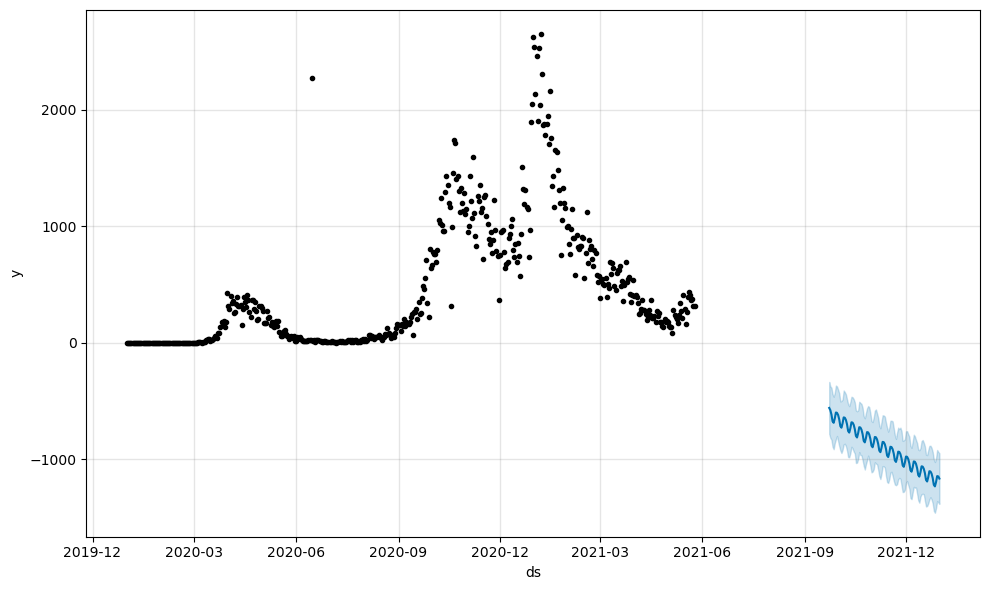

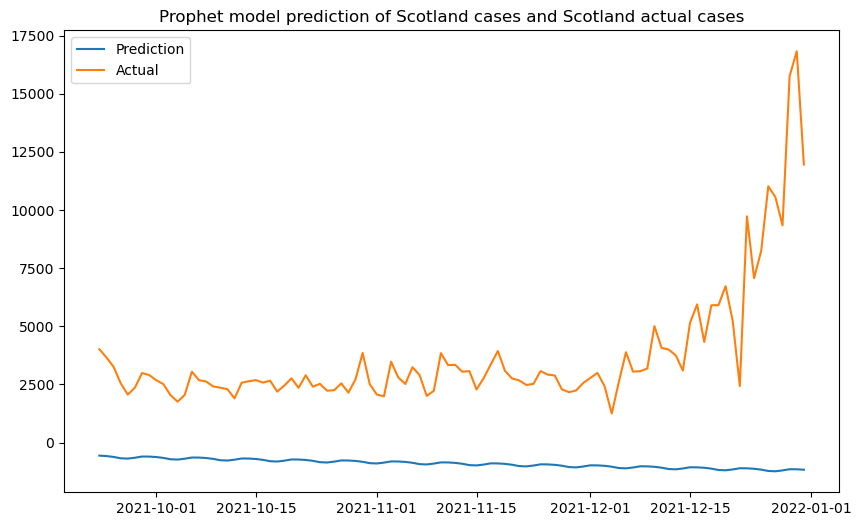

scotland_cases_day_1_mae_pro:4624.738551478656, scotland_cases_day_1_mse_pro:29127261.976627015, scotland_cases_day_1_rmse_pro:5396.967850249528


In [159]:
scotland_cases_train_pro , scotland_cases_valid_pro, scotland_cases_test_pro = scotland_cases_train.copy() , scotland_cases_valid.copy(), scotland_cases_test.copy()

scotland_cases_train_pro = scotland_cases_train_pro.reset_index()
scotland_cases_valid_pro = scotland_cases_valid_pro.reset_index()
scotland_cases_test_pro = scotland_cases_test_pro.reset_index()

scotland_cases_train_pro.columns = ['ds','y'] 
scotland_cases_valid_pro.columns = ['ds','y']
scotland_cases_test_pro.columns = ['ds','y']

#prophet model hyperparameter tuning
scotland_cases_param_grid = {
    'changepoint_prior_scale': [0.001, 0.01, 0.1, 0.5, 1.0, 10.0],
    'seasonality_prior_scale': [0.01, 0.1, 1.0, 10.0],
    'seasonality_mode': ['multiplicative', 'additive']
    
}





# Use Parameter grid search to find the best hyperparameters
scotland_cases_best_params = {}
scotland_cases_lowest_rmse = float('inf')

for params in ParameterGrid(scotland_cases_param_grid):
    scotland_cases_model = Prophet(**params)
    scotland_cases_model.fit(scotland_cases_train_pro)
    scotland_cases_forecast = scotland_cases_model.predict(scotland_cases_valid_pro)
    scotland_cases_rmse = np.sqrt(mean_squared_error(scotland_cases_valid_pro['y'], scotland_cases_forecast['yhat']))
    if scotland_cases_rmse < scotland_cases_lowest_rmse:
        scotland_cases_best_params = params
        scotland_cases_lowest_rmse = scotland_cases_rmse

        



#prophet model implementation with best parameters for 1 day rolling forecast
rolling_scotland_cases_valid_pro_1d = scotland_cases_valid_pro.copy()
scotland_cases_predictions_pro_1d = []
for i in range(len(scotland_cases_test_pro)):  
    scotland_cases_prophet_1d = Prophet(**scotland_cases_best_params)
    scotland_cases_prophet_1d.fit(rolling_scotland_cases_valid_pro_1d)
    scotland_cases_future_1d = scotland_cases_test_pro.iloc[i:i+1]
    scotland_cases_forecast_1d = scotland_cases_model.predict(scotland_cases_future_1d)
    scotland_cases_predictions_pro_1d.append(scotland_cases_forecast_1d)
    rolling_scotland_cases_valid_pro_1d = rolling_scotland_cases_valid_pro_1d.drop(index = rolling_scotland_cases_valid_pro_1d.index[0])
    rolling_scotland_cases_valid_pro_1d = rolling_scotland_cases_valid_pro_1d.append(scotland_cases_future_1d)
    
scotland_cases_predictions_pro_1d_df= pd.DataFrame()
for i in range(len(scotland_cases_predictions_pro_1d)):
    scotland_cases_predictions_pro_1d_df= scotland_cases_predictions_pro_1d_df.append(scotland_cases_predictions_pro_1d[i])
    
scotland_cases_pro_predicted_val_1d = pd.Series(scotland_cases_predictions_pro_1d_df['yhat'])
scotland_cases_pro_actual_val_1d = scotland_cases_test_pro.set_index('ds')
scotland_cases_pro_predicted_val_1d.index= scotland_cases_pro_actual_val_1d.index
scotland_cases_model.plot(scotland_cases_predictions_pro_1d_df)

plot_predictions(scotland_cases_pro_predicted_val_1d, scotland_cases_pro_actual_val_1d, "Prophet model prediction of Scotland cases and Scotland actual cases")

scotland_cases_day_1_mae_pro, scotland_cases_day_1_mse_pro, scotland_cases_day_1_rmse_pro = evaluate_model(scotland_cases_pro_actual_val_1d, scotland_cases_pro_predicted_val_1d)

print("scotland_cases_day_1_mae_pro:{}, scotland_cases_day_1_mse_pro:{}, scotland_cases_day_1_rmse_pro:{}".format(scotland_cases_day_1_mae_pro, scotland_cases_day_1_mse_pro, scotland_cases_day_1_rmse_pro))

**Wales**

11:52:09 - cmdstanpy - INFO - Chain [1] start processing
11:52:09 - cmdstanpy - INFO - Chain [1] done processing
11:52:10 - cmdstanpy - INFO - Chain [1] start processing
11:52:10 - cmdstanpy - INFO - Chain [1] done processing
11:52:10 - cmdstanpy - INFO - Chain [1] start processing
11:52:10 - cmdstanpy - INFO - Chain [1] done processing
11:52:11 - cmdstanpy - INFO - Chain [1] start processing
11:52:11 - cmdstanpy - INFO - Chain [1] done processing
11:52:11 - cmdstanpy - INFO - Chain [1] start processing
11:52:11 - cmdstanpy - INFO - Chain [1] done processing
11:52:12 - cmdstanpy - INFO - Chain [1] start processing
11:52:12 - cmdstanpy - INFO - Chain [1] done processing
11:52:12 - cmdstanpy - INFO - Chain [1] start processing
11:52:12 - cmdstanpy - INFO - Chain [1] done processing
11:52:12 - cmdstanpy - INFO - Chain [1] start processing
11:52:12 - cmdstanpy - INFO - Chain [1] done processing
11:52:13 - cmdstanpy - INFO - Chain [1] start processing
11:52:13 - cmdstanpy - INFO - Chain [1]

11:52:40 - cmdstanpy - ERROR - Chain [1] error: error during processing Operation not permitted
Optimization terminated abnormally. Falling back to Newton.
11:52:40 - cmdstanpy - INFO - Chain [1] start processing
11:52:42 - cmdstanpy - INFO - Chain [1] done processing
11:52:42 - cmdstanpy - INFO - Chain [1] start processing
11:52:42 - cmdstanpy - INFO - Chain [1] done processing
11:52:42 - cmdstanpy - INFO - Chain [1] start processing
11:52:42 - cmdstanpy - INFO - Chain [1] done processing
11:52:42 - cmdstanpy - ERROR - Chain [1] error: error during processing Operation not permitted
Optimization terminated abnormally. Falling back to Newton.
11:52:42 - cmdstanpy - INFO - Chain [1] start processing
11:52:43 - cmdstanpy - INFO - Chain [1] done processing
11:52:43 - cmdstanpy - INFO - Chain [1] start processing
11:52:43 - cmdstanpy - INFO - Chain [1] done processing
11:52:43 - cmdstanpy - ERROR - Chain [1] error: error during processing Operation not permitted
Optimization terminated abn

11:53:07 - cmdstanpy - INFO - Chain [1] start processing
11:53:07 - cmdstanpy - INFO - Chain [1] done processing
11:53:07 - cmdstanpy - INFO - Chain [1] start processing
11:53:07 - cmdstanpy - INFO - Chain [1] done processing
11:53:08 - cmdstanpy - INFO - Chain [1] start processing
11:53:08 - cmdstanpy - INFO - Chain [1] done processing
11:53:08 - cmdstanpy - ERROR - Chain [1] error: error during processing Operation not permitted
Optimization terminated abnormally. Falling back to Newton.
11:53:08 - cmdstanpy - INFO - Chain [1] start processing
11:53:08 - cmdstanpy - INFO - Chain [1] done processing
11:53:08 - cmdstanpy - INFO - Chain [1] start processing
11:53:08 - cmdstanpy - INFO - Chain [1] done processing
11:53:08 - cmdstanpy - ERROR - Chain [1] error: error during processing Operation not permitted
Optimization terminated abnormally. Falling back to Newton.
11:53:08 - cmdstanpy - INFO - Chain [1] start processing
11:53:09 - cmdstanpy - INFO - Chain [1] done processing
11:53:09 -

11:53:22 - cmdstanpy - ERROR - Chain [1] error: error during processing Operation not permitted
Optimization terminated abnormally. Falling back to Newton.
11:53:22 - cmdstanpy - INFO - Chain [1] start processing
11:53:23 - cmdstanpy - INFO - Chain [1] done processing
11:53:23 - cmdstanpy - INFO - Chain [1] start processing
11:53:23 - cmdstanpy - INFO - Chain [1] done processing
11:53:23 - cmdstanpy - ERROR - Chain [1] error: error during processing Operation not permitted
Optimization terminated abnormally. Falling back to Newton.
11:53:23 - cmdstanpy - INFO - Chain [1] start processing
11:53:23 - cmdstanpy - INFO - Chain [1] done processing
11:53:23 - cmdstanpy - INFO - Chain [1] start processing
11:53:24 - cmdstanpy - INFO - Chain [1] done processing
11:53:24 - cmdstanpy - ERROR - Chain [1] error: error during processing Operation not permitted
Optimization terminated abnormally. Falling back to Newton.
11:53:24 - cmdstanpy - INFO - Chain [1] start processing
11:53:24 - cmdstanpy - 

Optimization terminated abnormally. Falling back to Newton.
11:53:40 - cmdstanpy - INFO - Chain [1] start processing
11:53:40 - cmdstanpy - INFO - Chain [1] done processing
11:53:40 - cmdstanpy - INFO - Chain [1] start processing
11:53:40 - cmdstanpy - INFO - Chain [1] done processing
11:53:40 - cmdstanpy - ERROR - Chain [1] error: error during processing Operation not permitted
Optimization terminated abnormally. Falling back to Newton.
11:53:40 - cmdstanpy - INFO - Chain [1] start processing
11:53:41 - cmdstanpy - INFO - Chain [1] done processing
11:53:41 - cmdstanpy - INFO - Chain [1] start processing
11:53:41 - cmdstanpy - INFO - Chain [1] done processing
11:53:41 - cmdstanpy - ERROR - Chain [1] error: error during processing Operation not permitted
Optimization terminated abnormally. Falling back to Newton.
11:53:41 - cmdstanpy - INFO - Chain [1] start processing
11:53:41 - cmdstanpy - INFO - Chain [1] done processing
11:53:41 - cmdstanpy - INFO - Chain [1] start processing
11:53:

11:53:51 - cmdstanpy - INFO - Chain [1] start processing
11:53:51 - cmdstanpy - INFO - Chain [1] done processing


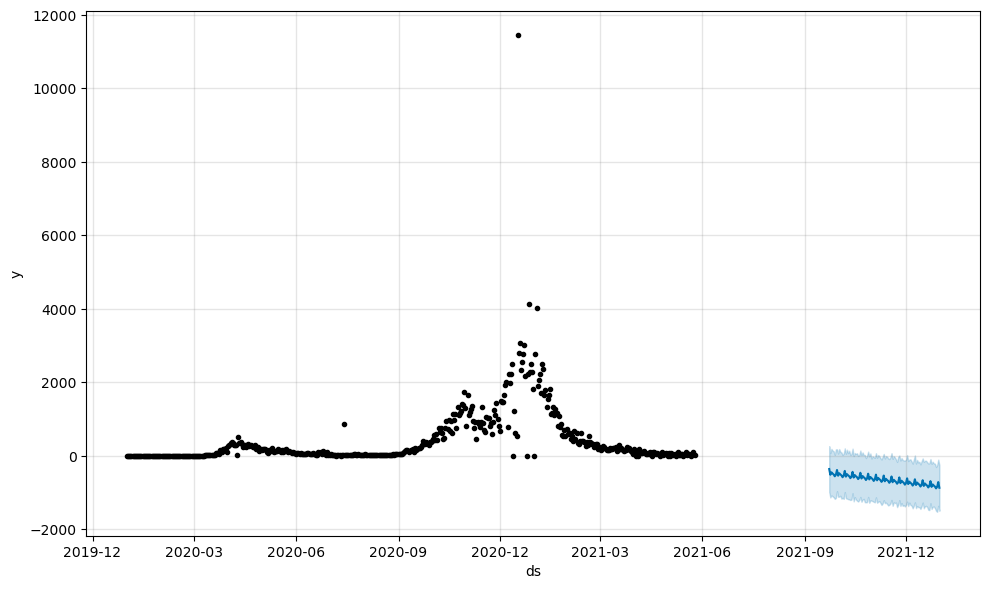

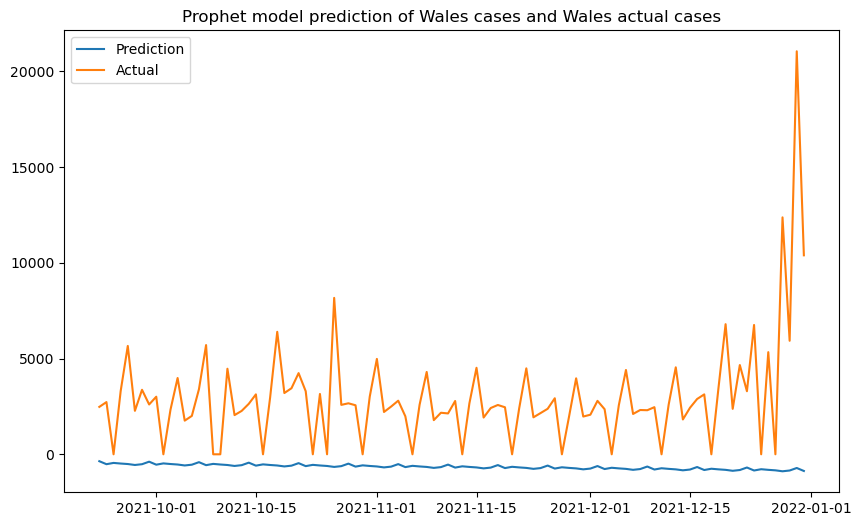

wales_cases_day_1_mae_pro:3642.4101161199674, wales_cases_day_1_mse_pro:21076468.003122546, wales_cases_day_1_rmse_pro:4590.911456685104


In [160]:
wales_cases_train_pro , wales_cases_valid_pro, wales_cases_test_pro = wales_cases_train.copy() , wales_cases_valid.copy(), wales_cases_test.copy()

wales_cases_train_pro = wales_cases_train_pro.reset_index()
wales_cases_valid_pro = wales_cases_valid_pro.reset_index()
wales_cases_test_pro = wales_cases_test_pro.reset_index()

wales_cases_train_pro.columns = ['ds','y'] 
wales_cases_valid_pro.columns = ['ds','y']
wales_cases_test_pro.columns = ['ds','y']

#prophet model hyperparameter tuning
wales_cases_param_grid = {
    'changepoint_prior_scale': [0.001, 0.01, 0.1, 0.5, 1.0, 10.0],
    'seasonality_prior_scale': [0.01, 0.1, 1.0, 10.0],
    'seasonality_mode': ['multiplicative', 'additive']
    
}


# Use Parameter grid search to find the best hyperparameters
wales_cases_best_params = {}
wales_cases_lowest_rmse = float('inf')

for params in ParameterGrid(wales_cases_param_grid):
    wales_cases_model = Prophet(**params)
    wales_cases_model.fit(wales_cases_train_pro)
    wales_cases_forecast = wales_cases_model.predict(wales_cases_valid_pro)
    wales_cases_rmse = np.sqrt(mean_squared_error(wales_cases_valid_pro['y'], wales_cases_forecast['yhat']))
    if wales_cases_rmse < wales_cases_lowest_rmse:
        wales_cases_best_params = params
        wales_cases_lowest_rmse = wales_cases_rmse

        



#prophet model implementation with best parameters for 1 day rolling forecast
rolling_wales_cases_valid_pro_1d = wales_cases_valid_pro.copy()
wales_cases_predictions_pro_1d = []
for i in range(len(wales_cases_test_pro)):  
    wales_cases_prophet_1d = Prophet(**wales_cases_best_params)
    wales_cases_prophet_1d.fit(rolling_wales_cases_valid_pro_1d)
    wales_cases_future_1d = wales_cases_test_pro.iloc[i:i+1]
    wales_cases_forecast_1d = wales_cases_model.predict(wales_cases_future_1d)
    wales_cases_predictions_pro_1d.append(wales_cases_forecast_1d)
    rolling_wales_cases_valid_pro_1d = rolling_wales_cases_valid_pro_1d.drop(index = rolling_wales_cases_valid_pro_1d.index[0])
    rolling_wales_cases_valid_pro_1d = rolling_wales_cases_valid_pro_1d.append(wales_cases_future_1d)
    
wales_cases_predictions_pro_1d_df= pd.DataFrame()
for i in range(len(wales_cases_predictions_pro_1d)):
    wales_cases_predictions_pro_1d_df= wales_cases_predictions_pro_1d_df.append(wales_cases_predictions_pro_1d[i])
    
wales_cases_pro_predicted_val_1d = pd.Series(wales_cases_predictions_pro_1d_df['yhat'])
wales_cases_pro_actual_val_1d = wales_cases_test_pro.set_index('ds')
wales_cases_pro_predicted_val_1d.index= wales_cases_pro_actual_val_1d.index
wales_cases_model.plot(wales_cases_predictions_pro_1d_df)

plot_predictions(wales_cases_pro_predicted_val_1d, wales_cases_pro_actual_val_1d, "Prophet model prediction of Wales cases and Wales actual cases")

wales_cases_day_1_mae_pro, wales_cases_day_1_mse_pro, wales_cases_day_1_rmse_pro = evaluate_model(wales_cases_pro_actual_val_1d, wales_cases_pro_predicted_val_1d)

print("wales_cases_day_1_mae_pro:{}, wales_cases_day_1_mse_pro:{}, wales_cases_day_1_rmse_pro:{}".format(wales_cases_day_1_mae_pro, wales_cases_day_1_mse_pro, wales_cases_day_1_rmse_pro))

**Prophet Deaths Predictions**

#National Deaths

11:53:52 - cmdstanpy - INFO - Chain [1] start processing
11:53:52 - cmdstanpy - INFO - Chain [1] done processing
11:53:52 - cmdstanpy - ERROR - Chain [1] error: error during processing Operation not permitted
Optimization terminated abnormally. Falling back to Newton.
11:53:52 - cmdstanpy - INFO - Chain [1] start processing
11:53:53 - cmdstanpy - INFO - Chain [1] done processing
11:53:53 - cmdstanpy - INFO - Chain [1] start processing
11:53:53 - cmdstanpy - INFO - Chain [1] done processing
11:53:53 - cmdstanpy - ERROR - Chain [1] error: error during processing Operation not permitted
Optimization terminated abnormally. Falling back to Newton.
11:53:53 - cmdstanpy - INFO - Chain [1] start processing
11:53:54 - cmdstanpy - INFO - Chain [1] done processing
11:53:54 - cmdstanpy - INFO - Chain [1] start processing
11:53:54 - cmdstanpy - INFO - Chain [1] done processing
11:53:54 - cmdstanpy - ERROR - Chain [1] error: error during processing Operation not permitted
Optimization terminated abn

11:54:29 - cmdstanpy - INFO - Chain [1] done processing
11:54:29 - cmdstanpy - INFO - Chain [1] start processing
11:54:29 - cmdstanpy - INFO - Chain [1] done processing
11:54:30 - cmdstanpy - INFO - Chain [1] start processing
11:54:30 - cmdstanpy - INFO - Chain [1] done processing
11:54:30 - cmdstanpy - INFO - Chain [1] start processing
11:54:30 - cmdstanpy - INFO - Chain [1] done processing
11:54:30 - cmdstanpy - INFO - Chain [1] start processing
11:54:30 - cmdstanpy - INFO - Chain [1] done processing
11:54:31 - cmdstanpy - INFO - Chain [1] start processing
11:54:31 - cmdstanpy - INFO - Chain [1] done processing
11:54:31 - cmdstanpy - INFO - Chain [1] start processing
11:54:31 - cmdstanpy - INFO - Chain [1] done processing
11:54:31 - cmdstanpy - INFO - Chain [1] start processing
11:54:31 - cmdstanpy - INFO - Chain [1] done processing
11:54:31 - cmdstanpy - INFO - Chain [1] start processing
11:54:32 - cmdstanpy - INFO - Chain [1] done processing
11:54:32 - cmdstanpy - INFO - Chain [1] 

11:54:52 - cmdstanpy - INFO - Chain [1] done processing
11:54:53 - cmdstanpy - INFO - Chain [1] start processing
11:54:53 - cmdstanpy - INFO - Chain [1] done processing
11:54:53 - cmdstanpy - INFO - Chain [1] start processing
11:54:53 - cmdstanpy - INFO - Chain [1] done processing
11:54:53 - cmdstanpy - INFO - Chain [1] start processing
11:54:53 - cmdstanpy - INFO - Chain [1] done processing
11:54:54 - cmdstanpy - INFO - Chain [1] start processing
11:54:54 - cmdstanpy - INFO - Chain [1] done processing
11:54:54 - cmdstanpy - INFO - Chain [1] start processing
11:54:54 - cmdstanpy - INFO - Chain [1] done processing
11:54:54 - cmdstanpy - INFO - Chain [1] start processing
11:54:54 - cmdstanpy - INFO - Chain [1] done processing
11:54:55 - cmdstanpy - INFO - Chain [1] start processing
11:54:55 - cmdstanpy - INFO - Chain [1] done processing
11:54:55 - cmdstanpy - INFO - Chain [1] start processing
11:54:55 - cmdstanpy - INFO - Chain [1] done processing
11:54:55 - cmdstanpy - INFO - Chain [1] 

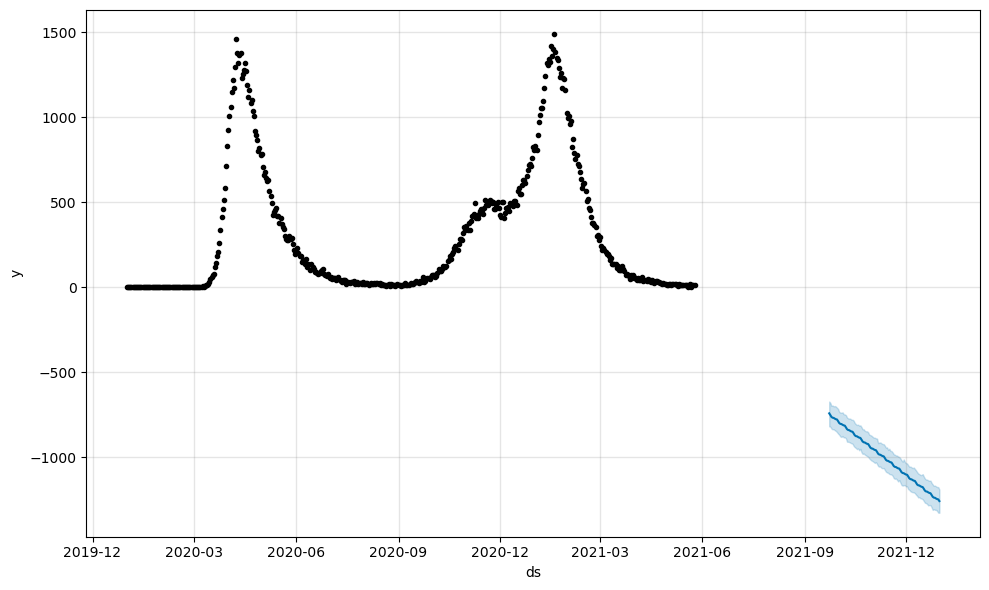

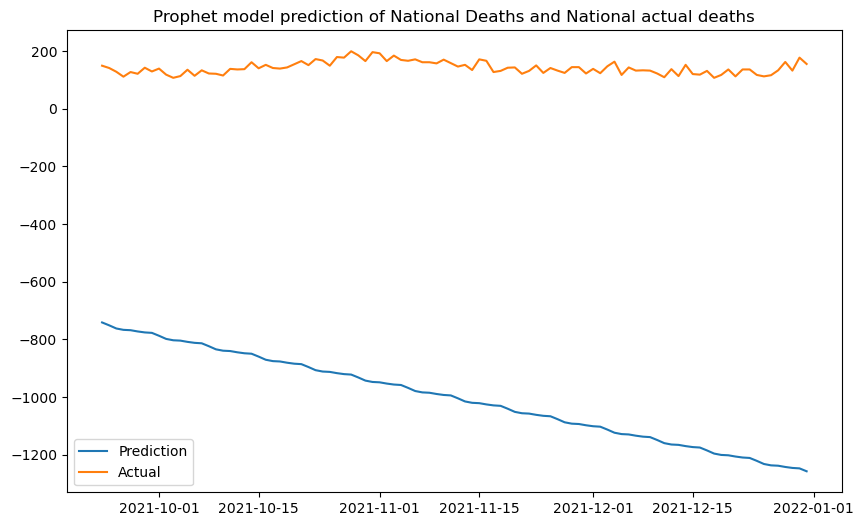

national_deaths_day_1_mae_pro:1144.268470253241, national_deaths_day_1_mse_pro:1331151.3954013211, national_deaths_day_1_rmse_pro:1153.7553446902516


In [161]:
national_deaths_train_pro , national_deaths_valid_pro, national_deaths_test_pro = national_deaths_train.copy() , national_deaths_valid.copy(), national_deaths_test.copy()

national_deaths_train_pro = national_deaths_train_pro.reset_index()
national_deaths_valid_pro = national_deaths_valid_pro.reset_index()
national_deaths_test_pro = national_deaths_test_pro.reset_index()

national_deaths_train_pro.columns = ['ds','y'] 
national_deaths_valid_pro.columns = ['ds','y'] 
national_deaths_test_pro.columns = ['ds','y']

#prophet model hyperparameter tuning
national_deaths_param_grid = {
    'changepoint_prior_scale': [0.001, 0.01, 0.1, 0.5, 1.0, 10.0],
    'seasonality_prior_scale': [0.01, 0.1, 1.0, 10.0],
    'seasonality_mode': ['multiplicative', 'additive']
    
}





# Use Parameter grid search to find the best hyperparameters
national_deaths_best_params = {}
national_deaths_lowest_rmse = float('inf')

for params in ParameterGrid(national_deaths_param_grid):
    national_deaths_model = Prophet(**params)
    national_deaths_model.fit(national_deaths_train_pro)
    national_deaths_forecast = national_deaths_model.predict(national_deaths_valid_pro)
    national_deaths_rmse = np.sqrt(mean_squared_error(national_deaths_valid_pro['y'], national_deaths_forecast['yhat']))
    if national_deaths_rmse < national_deaths_lowest_rmse:
        national_deaths_best_params = params
        national_deaths_lowest_rmse = national_deaths_rmse

        



#prophet model implementation with best parameters for 1 day rolling forecast
rolling_national_deaths_valid_pro_1d = national_deaths_valid_pro.copy()
national_deaths_predictions_pro_1d = []
for i in range(len(national_deaths_test_pro)):  
    national_deaths_prophet_1d = Prophet(**national_deaths_best_params)
    national_deaths_prophet_1d.fit(rolling_national_deaths_valid_pro_1d)
    national_deaths_future_1d = national_deaths_test_pro.iloc[i:i+1]
    national_deaths_forecast_1d = national_deaths_model.predict(national_deaths_future_1d)
    national_deaths_predictions_pro_1d.append(national_deaths_forecast_1d)
    rolling_national_deaths_valid_pro_1d = rolling_national_deaths_valid_pro_1d.drop(index = rolling_national_deaths_valid_pro_1d.index[0])
    rolling_national_deaths_valid_pro_1d = rolling_national_deaths_valid_pro_1d.append(national_deaths_future_1d)
    
national_deaths_predictions_pro_1d_df= pd.DataFrame()
for i in range(len(national_deaths_predictions_pro_1d)):
    national_deaths_predictions_pro_1d_df= national_deaths_predictions_pro_1d_df.append(national_deaths_predictions_pro_1d[i])
    
national_deaths_pro_predicted_val_1d = pd.Series(national_deaths_predictions_pro_1d_df['yhat'])
national_deaths_pro_actual_val_1d = national_deaths_test_pro.set_index('ds')
national_deaths_pro_predicted_val_1d.index= national_deaths_pro_actual_val_1d.index
national_deaths_model.plot(national_deaths_predictions_pro_1d_df)

plot_predictions(national_deaths_pro_predicted_val_1d, national_deaths_pro_actual_val_1d, "Prophet model prediction of National Deaths and National actual deaths")

national_deaths_day_1_mae_pro, national_deaths_day_1_mse_pro, national_deaths_day_1_rmse_pro = evaluate_model(national_deaths_pro_actual_val_1d, national_deaths_pro_predicted_val_1d)

print("national_deaths_day_1_mae_pro:{}, national_deaths_day_1_mse_pro:{}, national_deaths_day_1_rmse_pro:{}".format(national_deaths_day_1_mae_pro, national_deaths_day_1_mse_pro, national_deaths_day_1_rmse_pro))

#England Deaths

11:55:00 - cmdstanpy - INFO - Chain [1] start processing
11:55:00 - cmdstanpy - INFO - Chain [1] done processing
11:55:00 - cmdstanpy - ERROR - Chain [1] error: error during processing Operation not permitted
Optimization terminated abnormally. Falling back to Newton.
11:55:00 - cmdstanpy - INFO - Chain [1] start processing
11:55:01 - cmdstanpy - INFO - Chain [1] done processing
11:55:01 - cmdstanpy - INFO - Chain [1] start processing
11:55:01 - cmdstanpy - INFO - Chain [1] done processing
11:55:01 - cmdstanpy - ERROR - Chain [1] error: error during processing Operation not permitted
Optimization terminated abnormally. Falling back to Newton.
11:55:02 - cmdstanpy - INFO - Chain [1] start processing
11:55:07 - cmdstanpy - INFO - Chain [1] done processing
11:55:07 - cmdstanpy - INFO - Chain [1] start processing
11:55:07 - cmdstanpy - INFO - Chain [1] done processing
11:55:07 - cmdstanpy - ERROR - Chain [1] error: error during processing Operation not permitted
Optimization terminated abn

Optimization terminated abnormally. Falling back to Newton.
11:55:42 - cmdstanpy - INFO - Chain [1] start processing
11:55:42 - cmdstanpy - INFO - Chain [1] done processing
11:55:43 - cmdstanpy - INFO - Chain [1] start processing
11:55:43 - cmdstanpy - INFO - Chain [1] done processing
11:55:43 - cmdstanpy - ERROR - Chain [1] error: error during processing Operation not permitted
Optimization terminated abnormally. Falling back to Newton.
11:55:43 - cmdstanpy - INFO - Chain [1] start processing
11:55:43 - cmdstanpy - INFO - Chain [1] done processing
11:55:43 - cmdstanpy - INFO - Chain [1] start processing
11:55:43 - cmdstanpy - INFO - Chain [1] done processing
11:55:44 - cmdstanpy - INFO - Chain [1] start processing
11:55:44 - cmdstanpy - INFO - Chain [1] done processing
11:55:44 - cmdstanpy - INFO - Chain [1] start processing
11:55:44 - cmdstanpy - INFO - Chain [1] done processing
11:55:44 - cmdstanpy - INFO - Chain [1] start processing
11:55:44 - cmdstanpy - INFO - Chain [1] done proc

11:55:59 - cmdstanpy - INFO - Chain [1] done processing
11:55:59 - cmdstanpy - INFO - Chain [1] start processing
11:55:59 - cmdstanpy - INFO - Chain [1] done processing
11:55:59 - cmdstanpy - INFO - Chain [1] start processing
11:56:00 - cmdstanpy - INFO - Chain [1] done processing
11:56:00 - cmdstanpy - ERROR - Chain [1] error: error during processing Operation not permitted
Optimization terminated abnormally. Falling back to Newton.
11:56:00 - cmdstanpy - INFO - Chain [1] start processing
11:56:00 - cmdstanpy - INFO - Chain [1] done processing
11:56:00 - cmdstanpy - INFO - Chain [1] start processing
11:56:00 - cmdstanpy - INFO - Chain [1] done processing
11:56:00 - cmdstanpy - ERROR - Chain [1] error: error during processing Operation not permitted
Optimization terminated abnormally. Falling back to Newton.
11:56:00 - cmdstanpy - INFO - Chain [1] start processing
11:56:01 - cmdstanpy - INFO - Chain [1] done processing
11:56:01 - cmdstanpy - INFO - Chain [1] start processing
11:56:01 -

11:56:21 - cmdstanpy - INFO - Chain [1] done processing
11:56:21 - cmdstanpy - ERROR - Chain [1] error: error during processing Operation not permitted
Optimization terminated abnormally. Falling back to Newton.
11:56:21 - cmdstanpy - INFO - Chain [1] start processing
11:56:22 - cmdstanpy - INFO - Chain [1] done processing
11:56:22 - cmdstanpy - INFO - Chain [1] start processing
11:56:22 - cmdstanpy - INFO - Chain [1] done processing
11:56:23 - cmdstanpy - INFO - Chain [1] start processing
11:56:23 - cmdstanpy - INFO - Chain [1] done processing
11:56:23 - cmdstanpy - INFO - Chain [1] start processing
11:56:23 - cmdstanpy - INFO - Chain [1] done processing
11:56:24 - cmdstanpy - INFO - Chain [1] start processing
11:56:24 - cmdstanpy - INFO - Chain [1] done processing
11:56:25 - cmdstanpy - INFO - Chain [1] start processing
11:56:25 - cmdstanpy - INFO - Chain [1] done processing
11:56:25 - cmdstanpy - ERROR - Chain [1] error: error during processing Operation not permitted
Optimization t

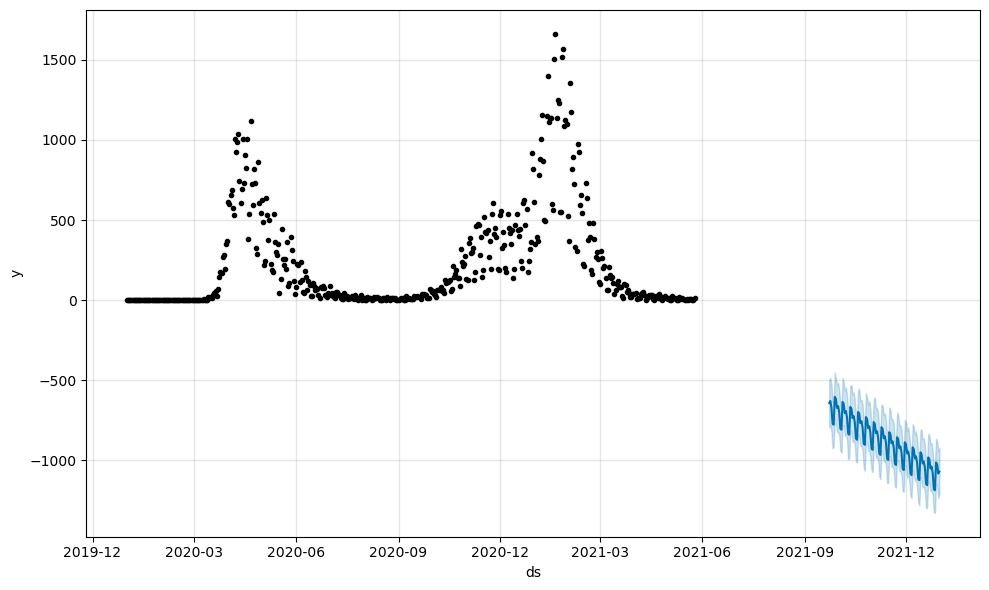

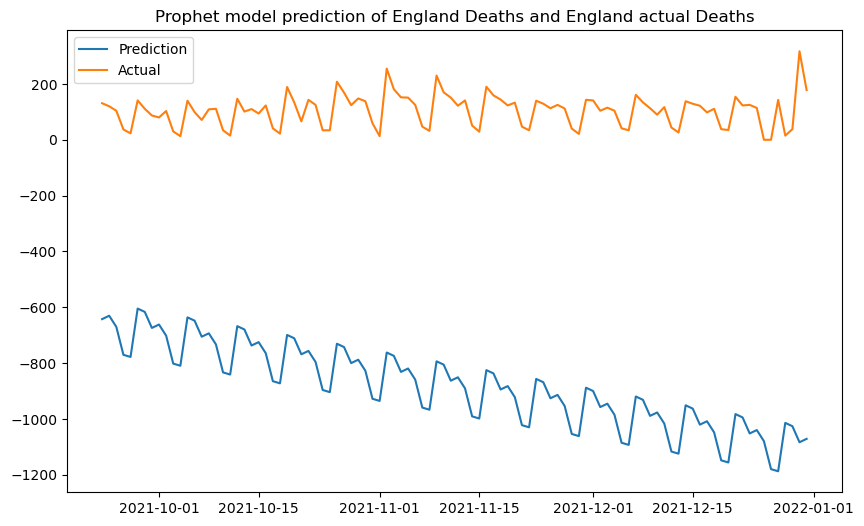

england_deaths_day_1_mae_pro:985.4912586413818, england_deaths_day_1_mse_pro:990474.9644991623, england_deaths_day_1_rmse_pro:995.2260871275241


In [162]:
england_deaths_train_pro , england_deaths_valid_pro, england_deaths_test_pro = england_deaths_train.copy() , england_deaths_valid.copy(), england_deaths_test.copy()

england_deaths_train_pro = england_deaths_train_pro.reset_index()
england_deaths_valid_pro = england_deaths_valid_pro.reset_index()
england_deaths_test_pro = england_deaths_test_pro.reset_index()

england_deaths_train_pro.columns = ['ds','y'] 
england_deaths_valid_pro.columns = ['ds','y']
england_deaths_test_pro.columns = ['ds','y']

#prophet model hyperparameter tuning
england_deaths_param_grid = {
    'changepoint_prior_scale': [0.001, 0.01, 0.1, 0.5, 1.0, 10.0],
    'seasonality_prior_scale': [0.01, 0.1, 1.0, 10.0],
    'seasonality_mode': ['multiplicative', 'additive']
    
}





# Use Parameter grid search to find the best hyperparameters
england_deaths_best_params = {}
england_deaths_lowest_rmse = float('inf')

for params in ParameterGrid(england_deaths_param_grid):
    england_deaths_model = Prophet(**params)
    england_deaths_model.fit(england_deaths_train_pro)
    england_deaths_forecast = england_deaths_model.predict(england_deaths_valid_pro)
    england_deaths_rmse = np.sqrt(mean_squared_error(england_deaths_valid_pro['y'], england_deaths_forecast['yhat']))
    if england_deaths_rmse < england_deaths_lowest_rmse:
        england_deaths_best_params = params
        england_deaths_lowest_rmse = england_deaths_rmse

        



#prophet model implementation with best parameters for 1 day rolling forecast
rolling_england_deaths_valid_pro_1d = england_deaths_valid_pro.copy()
england_deaths_predictions_pro_1d = []
for i in range(len(england_deaths_test_pro)):  
    england_deaths_prophet_1d = Prophet(**england_deaths_best_params)
    england_deaths_prophet_1d.fit(rolling_england_deaths_valid_pro_1d)
    england_deaths_future_1d = england_deaths_test_pro.iloc[i:i+1]
    england_deaths_forecast_1d = england_deaths_model.predict(england_deaths_future_1d)
    england_deaths_predictions_pro_1d.append(england_deaths_forecast_1d)
    rolling_england_deaths_valid_pro_1d = rolling_england_deaths_valid_pro_1d.drop(index = rolling_england_deaths_valid_pro_1d.index[0])
    rolling_england_deaths_valid_pro_1d = rolling_england_deaths_valid_pro_1d.append(england_deaths_future_1d)
    
england_deaths_predictions_pro_1d_df= pd.DataFrame()
for i in range(len(england_deaths_predictions_pro_1d)):
    england_deaths_predictions_pro_1d_df= england_deaths_predictions_pro_1d_df.append(england_deaths_predictions_pro_1d[i])
    
england_deaths_pro_predicted_val_1d = pd.Series(england_deaths_predictions_pro_1d_df['yhat'])
england_deaths_pro_actual_val_1d = england_deaths_test_pro.set_index('ds')
england_deaths_pro_predicted_val_1d.index= england_deaths_pro_actual_val_1d.index
england_deaths_model.plot(england_deaths_predictions_pro_1d_df)

plot_predictions(england_deaths_pro_predicted_val_1d, england_deaths_pro_actual_val_1d, "Prophet model prediction of England Deaths and England actual Deaths")

england_deaths_day_1_mae_pro, england_deaths_day_1_mse_pro, england_deaths_day_1_rmse_pro = evaluate_model(england_deaths_pro_actual_val_1d, england_deaths_pro_predicted_val_1d)

print("england_deaths_day_1_mae_pro:{}, england_deaths_day_1_mse_pro:{}, england_deaths_day_1_rmse_pro:{}".format(england_deaths_day_1_mae_pro, england_deaths_day_1_mse_pro, england_deaths_day_1_rmse_pro))

#Scotland

11:56:31 - cmdstanpy - INFO - Chain [1] start processing
11:56:31 - cmdstanpy - INFO - Chain [1] done processing
11:56:31 - cmdstanpy - INFO - Chain [1] start processing
11:56:31 - cmdstanpy - INFO - Chain [1] done processing
11:56:31 - cmdstanpy - INFO - Chain [1] start processing
11:56:31 - cmdstanpy - INFO - Chain [1] done processing
11:56:32 - cmdstanpy - INFO - Chain [1] start processing
11:56:32 - cmdstanpy - INFO - Chain [1] done processing
11:56:32 - cmdstanpy - INFO - Chain [1] start processing
11:56:32 - cmdstanpy - INFO - Chain [1] done processing
11:56:32 - cmdstanpy - INFO - Chain [1] start processing
11:56:32 - cmdstanpy - INFO - Chain [1] done processing
11:56:33 - cmdstanpy - INFO - Chain [1] start processing
11:56:33 - cmdstanpy - INFO - Chain [1] done processing
11:56:33 - cmdstanpy - INFO - Chain [1] start processing
11:56:33 - cmdstanpy - INFO - Chain [1] done processing
11:56:34 - cmdstanpy - INFO - Chain [1] start processing
11:56:34 - cmdstanpy - INFO - Chain [1]

11:57:04 - cmdstanpy - INFO - Chain [1] start processing
11:57:04 - cmdstanpy - INFO - Chain [1] done processing
11:57:04 - cmdstanpy - INFO - Chain [1] start processing
11:57:04 - cmdstanpy - INFO - Chain [1] done processing
11:57:04 - cmdstanpy - INFO - Chain [1] start processing
11:57:04 - cmdstanpy - INFO - Chain [1] done processing
11:57:04 - cmdstanpy - ERROR - Chain [1] error: error during processing Operation not permitted
Optimization terminated abnormally. Falling back to Newton.
11:57:04 - cmdstanpy - INFO - Chain [1] start processing
11:57:05 - cmdstanpy - INFO - Chain [1] done processing
11:57:05 - cmdstanpy - INFO - Chain [1] start processing
11:57:05 - cmdstanpy - INFO - Chain [1] done processing
11:57:05 - cmdstanpy - INFO - Chain [1] start processing
11:57:05 - cmdstanpy - INFO - Chain [1] done processing
11:57:05 - cmdstanpy - INFO - Chain [1] start processing
11:57:06 - cmdstanpy - INFO - Chain [1] done processing
11:57:06 - cmdstanpy - ERROR - Chain [1] error: error

11:57:21 - cmdstanpy - INFO - Chain [1] start processing
11:57:21 - cmdstanpy - INFO - Chain [1] done processing
11:57:21 - cmdstanpy - INFO - Chain [1] start processing
11:57:21 - cmdstanpy - INFO - Chain [1] done processing
11:57:21 - cmdstanpy - INFO - Chain [1] start processing
11:57:21 - cmdstanpy - INFO - Chain [1] done processing
11:57:21 - cmdstanpy - INFO - Chain [1] start processing
11:57:21 - cmdstanpy - INFO - Chain [1] done processing
11:57:22 - cmdstanpy - INFO - Chain [1] start processing
11:57:22 - cmdstanpy - INFO - Chain [1] done processing
11:57:22 - cmdstanpy - INFO - Chain [1] start processing
11:57:22 - cmdstanpy - INFO - Chain [1] done processing
11:57:22 - cmdstanpy - ERROR - Chain [1] error: error during processing Operation not permitted
Optimization terminated abnormally. Falling back to Newton.
11:57:22 - cmdstanpy - INFO - Chain [1] start processing
11:57:22 - cmdstanpy - INFO - Chain [1] done processing
11:57:22 - cmdstanpy - INFO - Chain [1] start process

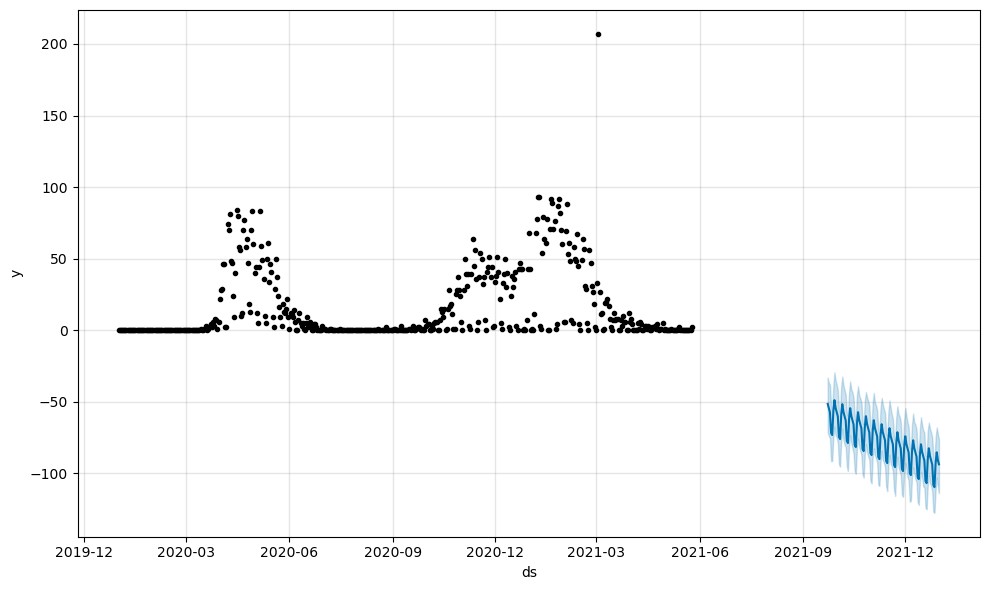

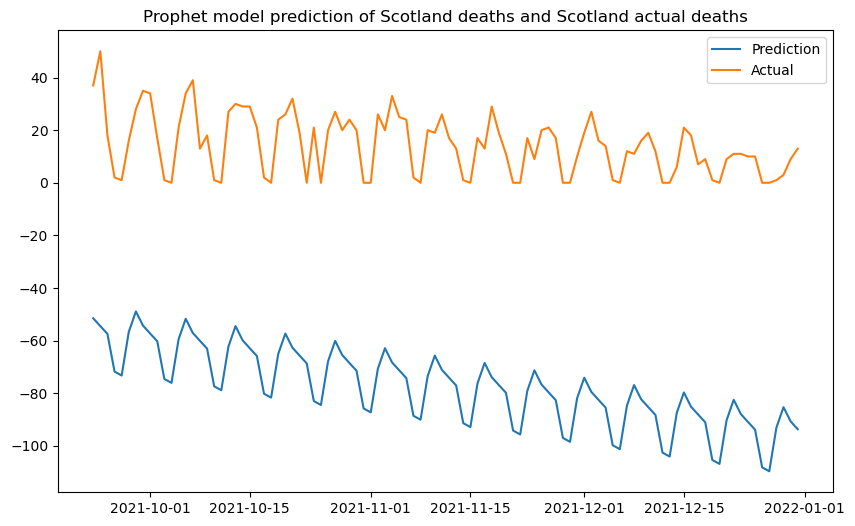

scotland_deaths_day_1_mae_pro:91.96924661126384, scotland_deaths_day_1_mse_pro:8545.442737012323, scotland_deaths_day_1_rmse_pro:92.44156390397299


In [163]:
scotland_deaths_train_pro , scotland_deaths_valid_pro, scotland_deaths_test_pro = scotland_deaths_train.copy() , scotland_deaths_valid.copy(), scotland_deaths_test.copy()

scotland_deaths_train_pro = scotland_deaths_train_pro.reset_index()
scotland_deaths_valid_pro = scotland_deaths_valid_pro.reset_index()
scotland_deaths_test_pro = scotland_deaths_test_pro.reset_index()

scotland_deaths_train_pro.columns = ['ds','y'] 
scotland_deaths_valid_pro.columns = ['ds','y']
scotland_deaths_test_pro.columns = ['ds','y']

#prophet model hyperparameter tuning
scotland_deaths_param_grid = {
    'changepoint_prior_scale': [0.001, 0.01, 0.1, 0.5, 1.0, 10.0],
    'seasonality_prior_scale': [0.01, 0.1, 1.0, 10.0],
    'seasonality_mode': ['multiplicative', 'additive']
    
}





# Use Parameter grid search to find the best hyperparameters
scotland_deaths_best_params = {}
scotland_deaths_lowest_rmse = float('inf')

for params in ParameterGrid(scotland_deaths_param_grid):
    scotland_deaths_model = Prophet(**params)
    scotland_deaths_model.fit(scotland_deaths_train_pro)
    scotland_deaths_forecast = scotland_deaths_model.predict(scotland_deaths_valid_pro)
    scotland_deaths_rmse = np.sqrt(mean_squared_error(scotland_deaths_valid_pro['y'], scotland_deaths_forecast['yhat']))
    if scotland_deaths_rmse < scotland_deaths_lowest_rmse:
        scotland_deaths_best_params = params
        scotland_deaths_lowest_rmse = scotland_deaths_rmse

        



#prophet model implementation with best parameters for 1 day rolling forecast
rolling_scotland_deaths_valid_pro_1d = scotland_deaths_valid_pro.copy()
scotland_deaths_predictions_pro_1d = []
for i in range(len(scotland_deaths_test_pro)):  
    scotland_deaths_prophet_1d = Prophet(**scotland_deaths_best_params)
    scotland_deaths_prophet_1d.fit(rolling_scotland_deaths_valid_pro_1d)
    scotland_deaths_future_1d = scotland_deaths_test_pro.iloc[i:i+1]
    scotland_deaths_forecast_1d = scotland_deaths_model.predict(scotland_deaths_future_1d)
    scotland_deaths_predictions_pro_1d.append(scotland_deaths_forecast_1d)
    rolling_scotland_deaths_valid_pro_1d = rolling_scotland_deaths_valid_pro_1d.drop(index = rolling_scotland_deaths_valid_pro_1d.index[0])
    rolling_scotland_deaths_valid_pro_1d = rolling_scotland_deaths_valid_pro_1d.append(scotland_deaths_future_1d)
    
scotland_deaths_predictions_pro_1d_df= pd.DataFrame()
for i in range(len(scotland_deaths_predictions_pro_1d)):
    scotland_deaths_predictions_pro_1d_df= scotland_deaths_predictions_pro_1d_df.append(scotland_deaths_predictions_pro_1d[i])
    
scotland_deaths_pro_predicted_val_1d = pd.Series(scotland_deaths_predictions_pro_1d_df['yhat'])
scotland_deaths_pro_actual_val_1d = scotland_deaths_test_pro.set_index('ds')
scotland_deaths_pro_predicted_val_1d.index= scotland_deaths_pro_actual_val_1d.index
scotland_deaths_model.plot(scotland_deaths_predictions_pro_1d_df)

plot_predictions(scotland_deaths_pro_predicted_val_1d, scotland_deaths_pro_actual_val_1d, "Prophet model prediction of Scotland deaths and Scotland actual deaths")

scotland_deaths_day_1_mae_pro, scotland_deaths_day_1_mse_pro, scotland_deaths_day_1_rmse_pro = evaluate_model(scotland_deaths_pro_actual_val_1d, scotland_deaths_pro_predicted_val_1d)

print("scotland_deaths_day_1_mae_pro:{}, scotland_deaths_day_1_mse_pro:{}, scotland_deaths_day_1_rmse_pro:{}".format(scotland_deaths_day_1_mae_pro, scotland_deaths_day_1_mse_pro, scotland_deaths_day_1_rmse_pro))

#Ireland

11:57:36 - cmdstanpy - INFO - Chain [1] start processing
11:57:36 - cmdstanpy - INFO - Chain [1] done processing
11:57:36 - cmdstanpy - ERROR - Chain [1] error: error during processing Operation not permitted
Optimization terminated abnormally. Falling back to Newton.
11:57:36 - cmdstanpy - INFO - Chain [1] start processing
11:57:37 - cmdstanpy - INFO - Chain [1] done processing
11:57:38 - cmdstanpy - INFO - Chain [1] start processing
11:57:38 - cmdstanpy - INFO - Chain [1] done processing
11:57:38 - cmdstanpy - ERROR - Chain [1] error: error during processing Operation not permitted
Optimization terminated abnormally. Falling back to Newton.
11:57:38 - cmdstanpy - INFO - Chain [1] start processing
11:57:39 - cmdstanpy - INFO - Chain [1] done processing
11:57:39 - cmdstanpy - INFO - Chain [1] start processing
11:57:39 - cmdstanpy - INFO - Chain [1] done processing
11:57:39 - cmdstanpy - ERROR - Chain [1] error: error during processing Operation not permitted
Optimization terminated abn

11:58:05 - cmdstanpy - INFO - Chain [1] done processing
11:58:05 - cmdstanpy - INFO - Chain [1] start processing
11:58:05 - cmdstanpy - INFO - Chain [1] done processing
11:58:05 - cmdstanpy - INFO - Chain [1] start processing
11:58:05 - cmdstanpy - INFO - Chain [1] done processing
11:58:05 - cmdstanpy - ERROR - Chain [1] error: error during processing Operation not permitted
Optimization terminated abnormally. Falling back to Newton.
11:58:05 - cmdstanpy - INFO - Chain [1] start processing
11:58:06 - cmdstanpy - INFO - Chain [1] done processing
11:58:06 - cmdstanpy - INFO - Chain [1] start processing
11:58:06 - cmdstanpy - INFO - Chain [1] done processing
11:58:06 - cmdstanpy - ERROR - Chain [1] error: error during processing Operation not permitted
Optimization terminated abnormally. Falling back to Newton.
11:58:06 - cmdstanpy - INFO - Chain [1] start processing
11:58:06 - cmdstanpy - INFO - Chain [1] done processing
11:58:07 - cmdstanpy - INFO - Chain [1] start processing
11:58:07 -

11:58:24 - cmdstanpy - ERROR - Chain [1] error: error during processing Operation not permitted
Optimization terminated abnormally. Falling back to Newton.
11:58:24 - cmdstanpy - INFO - Chain [1] start processing
11:58:24 - cmdstanpy - INFO - Chain [1] done processing
11:58:25 - cmdstanpy - INFO - Chain [1] start processing
11:58:25 - cmdstanpy - INFO - Chain [1] done processing
11:58:25 - cmdstanpy - INFO - Chain [1] start processing
11:58:25 - cmdstanpy - INFO - Chain [1] done processing
11:58:25 - cmdstanpy - INFO - Chain [1] start processing
11:58:25 - cmdstanpy - INFO - Chain [1] done processing
11:58:26 - cmdstanpy - INFO - Chain [1] start processing
11:58:26 - cmdstanpy - INFO - Chain [1] done processing
11:58:26 - cmdstanpy - INFO - Chain [1] start processing
11:58:26 - cmdstanpy - INFO - Chain [1] done processing
11:58:26 - cmdstanpy - ERROR - Chain [1] error: error during processing Operation not permitted
Optimization terminated abnormally. Falling back to Newton.
11:58:26 -

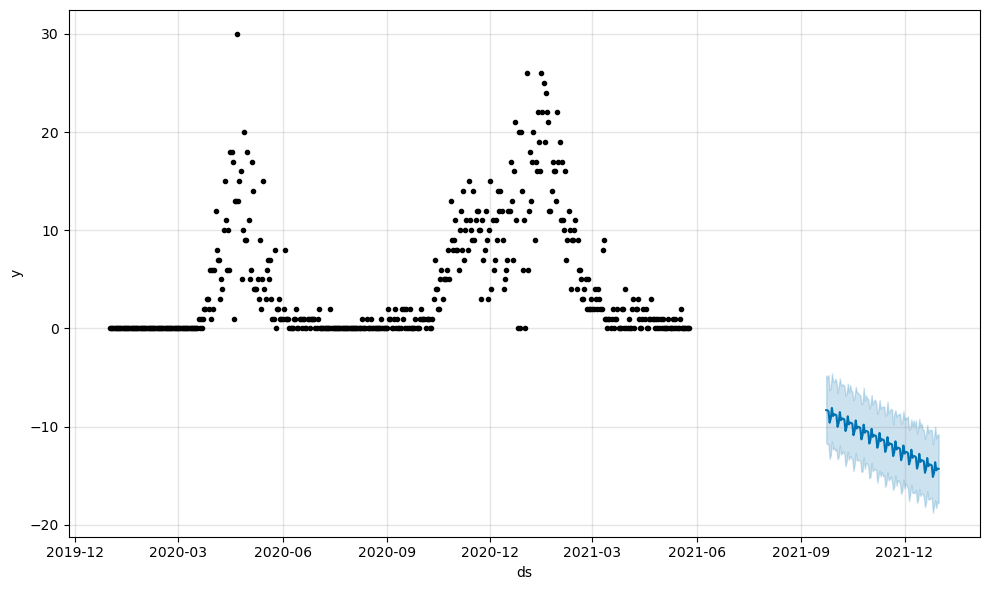

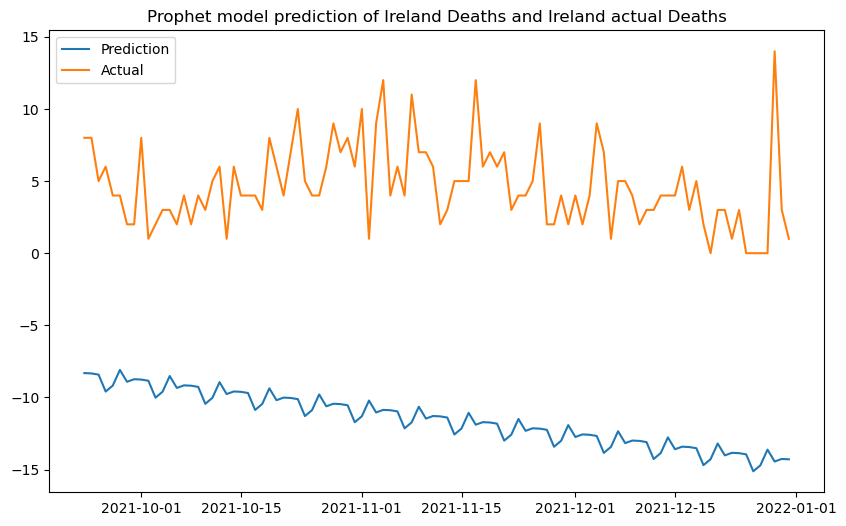

ireland_deaths_day_1_mae_pro:16.142755733438598, ireland_deaths_day_1_mse_pro:269.82865613056134, ireland_deaths_day_1_rmse_pro:16.42646206979949


In [164]:
ireland_deaths_train_pro , ireland_deaths_valid_pro, ireland_deaths_test_pro = ireland_deaths_train.copy() , ireland_deaths_valid.copy(), ireland_deaths_test.copy()

ireland_deaths_train_pro = ireland_deaths_train_pro.reset_index()
ireland_deaths_valid_pro = ireland_deaths_valid_pro.reset_index()
ireland_deaths_test_pro = ireland_deaths_test_pro.reset_index()

ireland_deaths_train_pro.columns = ['ds','y'] 
ireland_deaths_valid_pro.columns = ['ds','y']
ireland_deaths_test_pro.columns = ['ds','y']

#prophet model hyperparameter tuning
ireland_deaths_param_grid = {
    'changepoint_prior_scale': [0.001, 0.01, 0.1, 0.5, 1.0, 10.0],
    'seasonality_prior_scale': [0.01, 0.1, 1.0, 10.0],
    'seasonality_mode': ['multiplicative', 'additive']
    
}





# Use Parameter grid search to find the best hyperparameters
ireland_deaths_best_params = {}
ireland_deaths_lowest_rmse = float('inf')

for params in ParameterGrid(ireland_deaths_param_grid):
    ireland_deaths_model = Prophet(**params)
    ireland_deaths_model.fit(ireland_deaths_train_pro)
    ireland_deaths_forecast = ireland_deaths_model.predict(ireland_deaths_valid_pro)
    ireland_deaths_rmse = np.sqrt(mean_squared_error(ireland_deaths_valid_pro['y'], ireland_deaths_forecast['yhat']))
    if ireland_deaths_rmse < ireland_deaths_lowest_rmse:
        ireland_deaths_best_params = params
        ireland_deaths_lowest_rmse = ireland_deaths_rmse

        



#prophet model implementation with best parameters for 1 day rolling forecast
rolling_ireland_deaths_valid_pro_1d = ireland_deaths_valid_pro.copy()
ireland_deaths_predictions_pro_1d = []
for i in range(len(ireland_deaths_test_pro)):  
    ireland_deaths_prophet_1d = Prophet(**ireland_deaths_best_params)
    ireland_deaths_prophet_1d.fit(rolling_ireland_deaths_valid_pro_1d)
    ireland_deaths_future_1d = ireland_deaths_test_pro.iloc[i:i+1]
    ireland_deaths_forecast_1d = ireland_deaths_model.predict(ireland_deaths_future_1d)
    ireland_deaths_predictions_pro_1d.append(ireland_deaths_forecast_1d)
    rolling_ireland_deaths_valid_pro_1d = rolling_ireland_deaths_valid_pro_1d.drop(index = rolling_ireland_deaths_valid_pro_1d.index[0])
    rolling_ireland_deaths_valid_pro_1d = rolling_ireland_deaths_valid_pro_1d.append(ireland_deaths_future_1d)
    
ireland_deaths_predictions_pro_1d_df= pd.DataFrame()
for i in range(len(ireland_deaths_predictions_pro_1d)):
    ireland_deaths_predictions_pro_1d_df= ireland_deaths_predictions_pro_1d_df.append(ireland_deaths_predictions_pro_1d[i])
    
ireland_deaths_pro_predicted_val_1d = pd.Series(ireland_deaths_predictions_pro_1d_df['yhat'])
ireland_deaths_pro_actual_val_1d = ireland_deaths_test_pro.set_index('ds')
ireland_deaths_pro_predicted_val_1d.index= ireland_deaths_pro_actual_val_1d.index
ireland_deaths_model.plot(ireland_deaths_predictions_pro_1d_df)

plot_predictions(ireland_deaths_pro_predicted_val_1d, ireland_deaths_pro_actual_val_1d, "Prophet model prediction of Ireland Deaths and Ireland actual Deaths")

ireland_deaths_day_1_mae_pro, ireland_deaths_day_1_mse_pro, ireland_deaths_day_1_rmse_pro = evaluate_model(ireland_deaths_pro_actual_val_1d, ireland_deaths_pro_predicted_val_1d)

print("ireland_deaths_day_1_mae_pro:{}, ireland_deaths_day_1_mse_pro:{}, ireland_deaths_day_1_rmse_pro:{}".format(ireland_deaths_day_1_mae_pro, ireland_deaths_day_1_mse_pro, ireland_deaths_day_1_rmse_pro))

#Wales

11:58:42 - cmdstanpy - INFO - Chain [1] start processing
11:58:42 - cmdstanpy - INFO - Chain [1] done processing
11:58:42 - cmdstanpy - ERROR - Chain [1] error: error during processing Operation not permitted
Optimization terminated abnormally. Falling back to Newton.
11:58:42 - cmdstanpy - INFO - Chain [1] start processing
11:58:42 - cmdstanpy - INFO - Chain [1] done processing
11:58:43 - cmdstanpy - INFO - Chain [1] start processing
11:58:43 - cmdstanpy - INFO - Chain [1] done processing
11:58:43 - cmdstanpy - ERROR - Chain [1] error: error during processing Operation not permitted
Optimization terminated abnormally. Falling back to Newton.
11:58:43 - cmdstanpy - INFO - Chain [1] start processing
11:58:44 - cmdstanpy - INFO - Chain [1] done processing
11:58:44 - cmdstanpy - INFO - Chain [1] start processing
11:58:44 - cmdstanpy - INFO - Chain [1] done processing
11:58:44 - cmdstanpy - ERROR - Chain [1] error: error during processing Operation not permitted
Optimization terminated abn

11:59:11 - cmdstanpy - INFO - Chain [1] done processing
11:59:11 - cmdstanpy - INFO - Chain [1] start processing
11:59:11 - cmdstanpy - INFO - Chain [1] done processing
11:59:12 - cmdstanpy - INFO - Chain [1] start processing
11:59:12 - cmdstanpy - INFO - Chain [1] done processing
11:59:12 - cmdstanpy - INFO - Chain [1] start processing
11:59:12 - cmdstanpy - INFO - Chain [1] done processing
11:59:12 - cmdstanpy - INFO - Chain [1] start processing
11:59:12 - cmdstanpy - INFO - Chain [1] done processing
11:59:12 - cmdstanpy - INFO - Chain [1] start processing
11:59:12 - cmdstanpy - INFO - Chain [1] done processing
11:59:13 - cmdstanpy - INFO - Chain [1] start processing
11:59:13 - cmdstanpy - INFO - Chain [1] done processing
11:59:13 - cmdstanpy - INFO - Chain [1] start processing
11:59:13 - cmdstanpy - INFO - Chain [1] done processing
11:59:13 - cmdstanpy - ERROR - Chain [1] error: error during processing Operation not permitted
Optimization terminated abnormally. Falling back to Newto

11:59:27 - cmdstanpy - INFO - Chain [1] done processing
11:59:27 - cmdstanpy - INFO - Chain [1] start processing
11:59:27 - cmdstanpy - INFO - Chain [1] done processing
11:59:27 - cmdstanpy - INFO - Chain [1] start processing
11:59:27 - cmdstanpy - INFO - Chain [1] done processing
11:59:27 - cmdstanpy - INFO - Chain [1] start processing
11:59:27 - cmdstanpy - INFO - Chain [1] done processing
11:59:27 - cmdstanpy - INFO - Chain [1] start processing
11:59:27 - cmdstanpy - INFO - Chain [1] done processing
11:59:28 - cmdstanpy - INFO - Chain [1] start processing
11:59:28 - cmdstanpy - INFO - Chain [1] done processing
11:59:28 - cmdstanpy - ERROR - Chain [1] error: error during processing Operation not permitted
Optimization terminated abnormally. Falling back to Newton.
11:59:28 - cmdstanpy - INFO - Chain [1] start processing
11:59:28 - cmdstanpy - INFO - Chain [1] done processing
11:59:28 - cmdstanpy - INFO - Chain [1] start processing
11:59:28 - cmdstanpy - INFO - Chain [1] done processi

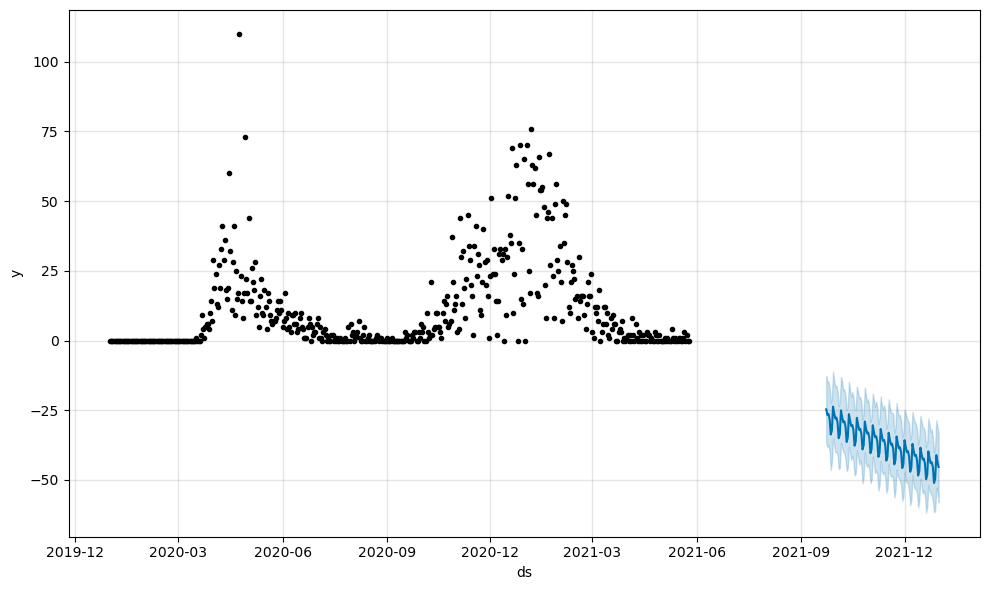

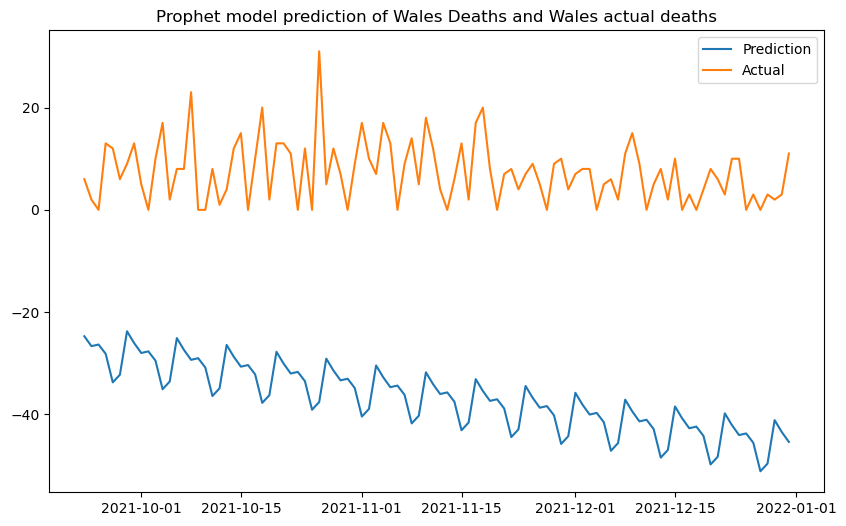

wales_deaths_day_1_mae_pro:44.13578355103245, wales_deaths_day_1_mse_pro:2012.7817660702556, wales_deaths_day_1_rmse_pro:44.86403644424179


In [165]:
wales_deaths_train_pro , wales_deaths_valid_pro, wales_deaths_test_pro = wales_deaths_train.copy() , wales_deaths_valid.copy(), wales_deaths_test.copy()

wales_deaths_train_pro = wales_deaths_train_pro.reset_index()
wales_deaths_valid_pro = wales_deaths_valid_pro.reset_index()
wales_deaths_test_pro = wales_deaths_test_pro.reset_index()

wales_deaths_train_pro.columns = ['ds','y'] 
wales_deaths_valid_pro.columns = ['ds','y']
wales_deaths_test_pro.columns = ['ds','y']

#prophet model hyperparameter tuning
wales_deaths_param_grid = {
    'changepoint_prior_scale': [0.001, 0.01, 0.1, 0.5, 1.0, 10.0],
    'seasonality_prior_scale': [0.01, 0.1, 1.0, 10.0],
    'seasonality_mode': ['multiplicative', 'additive']
    
}





# Use Parameter grid search to find the best hyperparameters
wales_deaths_best_params = {}
wales_deaths_lowest_rmse = float('inf')

for params in ParameterGrid(wales_deaths_param_grid):
    wales_deaths_model = Prophet(**params)
    wales_deaths_model.fit(wales_deaths_train_pro)
    wales_deaths_forecast = wales_deaths_model.predict(wales_deaths_valid_pro)
    wales_deaths_rmse = np.sqrt(mean_squared_error(wales_deaths_valid_pro['y'], wales_deaths_forecast['yhat']))
    if wales_deaths_rmse < wales_deaths_lowest_rmse:
        wales_deaths_best_params = params
        wales_deaths_lowest_rmse = wales_deaths_rmse

        



#prophet model implementation with best parameters for 1 day rolling forecast
rolling_wales_deaths_valid_pro_1d = wales_deaths_valid_pro.copy()
wales_deaths_predictions_pro_1d = []
for i in range(len(wales_deaths_test_pro)):  
    wales_deaths_prophet_1d = Prophet(**wales_deaths_best_params)
    wales_deaths_prophet_1d.fit(rolling_wales_deaths_valid_pro_1d)
    wales_deaths_future_1d = wales_deaths_test_pro.iloc[i:i+1]
    wales_deaths_forecast_1d = wales_deaths_model.predict(wales_deaths_future_1d)
    wales_deaths_predictions_pro_1d.append(wales_deaths_forecast_1d)
    rolling_wales_deaths_valid_pro_1d = rolling_wales_deaths_valid_pro_1d.drop(index = rolling_wales_deaths_valid_pro_1d.index[0])
    rolling_wales_deaths_valid_pro_1d = rolling_wales_deaths_valid_pro_1d.append(wales_deaths_future_1d)
    
wales_deaths_predictions_pro_1d_df= pd.DataFrame()
for i in range(len(wales_deaths_predictions_pro_1d)):
    wales_deaths_predictions_pro_1d_df= wales_deaths_predictions_pro_1d_df.append(wales_deaths_predictions_pro_1d[i])
    
wales_deaths_pro_predicted_val_1d = pd.Series(wales_deaths_predictions_pro_1d_df['yhat'])
wales_deaths_pro_actual_val_1d = wales_deaths_test_pro.set_index('ds')
wales_deaths_pro_predicted_val_1d.index= wales_deaths_pro_actual_val_1d.index
wales_deaths_model.plot(wales_deaths_predictions_pro_1d_df)

plot_predictions(wales_deaths_pro_predicted_val_1d, wales_deaths_pro_actual_val_1d, "Prophet model prediction of Wales Deaths and Wales actual deaths")

wales_deaths_day_1_mae_pro, wales_deaths_day_1_mse_pro, wales_deaths_day_1_rmse_pro = evaluate_model(wales_deaths_pro_actual_val_1d, wales_deaths_pro_predicted_val_1d)

print("wales_deaths_day_1_mae_pro:{}, wales_deaths_day_1_mse_pro:{}, wales_deaths_day_1_rmse_pro:{}".format(wales_deaths_day_1_mae_pro, wales_deaths_day_1_mse_pro, wales_deaths_day_1_rmse_pro))

# Deep learning Models

Preparing the data for LSTM and CNN-LSTM modelling

In [166]:
def data_prep(df, window):
    
    
    data = df.values
    window_size = window#sliding window

    X, y = [], []
    for i in range(window_size, len(data)):
        X.append(data[i-window_size:i])
        y.append(data[i])

    X = np.array(X)
    y = np.array(y)

    # Train/val split
    train_size = int(len(X) * 0.86)
    X_train, X_val = X[:train_size], X[train_size:]
    y_train, y_val = y[:train_size], y[train_size:]

    # Dataset using tf.data
    batch_size = 128
    buffer_size = 1000

    train_data = tf.data.Dataset.from_tensor_slices((X_train, y_train))
    train_data = train_data.cache().shuffle(buffer_size).batch(batch_size).prefetch(tf.data.experimental.AUTOTUNE)
    return (X_train, X_val, y_train, y_val, train_data)

In [167]:
# Create a DateTimeIndex
start_date = '2021-09-23'
end_date = '2021-12-31'

date_range_index = pd.date_range(start=start_date, end=end_date, freq='D').date  # 'D' for daily frequency


## Lstm Predictions

# National Cases Prediction

In [168]:
nc_X_train, nc_X_val, nc_y_train, nc_y_val, nc_train_data = data_prep(national_cases['daily_cases'], 20)

In [169]:
#building lstm model
nc_model = Sequential()
nc_model.add(LSTM(64, activation='relu', input_shape=(20, 1)))
nc_model.add(Dense(1))

nc_model.compile(loss='mse', optimizer='adam')

# Train model
nc_model.fit(nc_train_data, epochs=100, verbose=0)
nc_forecast = nc_model.predict(nc_X_val)
# plot
nc_forecast = nc_model.predict(nc_X_val)






4/4 [==============================] - 0s 4ms/step


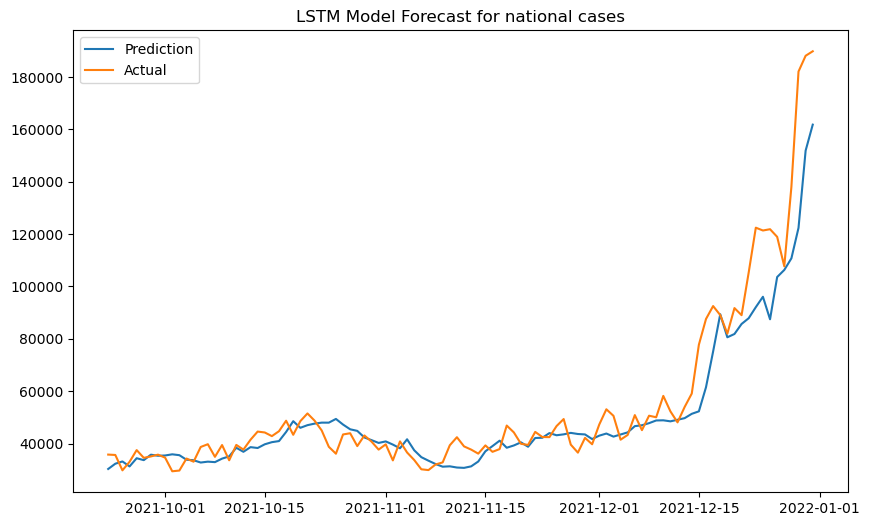

lstm_nc_mae:6711.531171875, lstm_nc_mse:132596480.81733826, lstm_nc_rmse:11515.054529499123


In [170]:
nc_forecast_df = pd.DataFrame(nc_forecast)
nc_y_val_df = pd.DataFrame(nc_y_val)
nc_forecast_df.index = date_range_index
nc_y_val_df.index = date_range_index
plot_predictions(nc_forecast_df, nc_y_val_df, title="LSTM Model Forecast for national cases")
# evaluate
lstm_nc_mae, lstm_nc_mse, lstm_nc_rmse = evaluate_model(nc_y_val, nc_forecast)
print("lstm_nc_mae:{}, lstm_nc_mse:{}, lstm_nc_rmse:{}".format(lstm_nc_mae, lstm_nc_mse, lstm_nc_rmse))

4/4 [==============================] - 0s 6ms/step


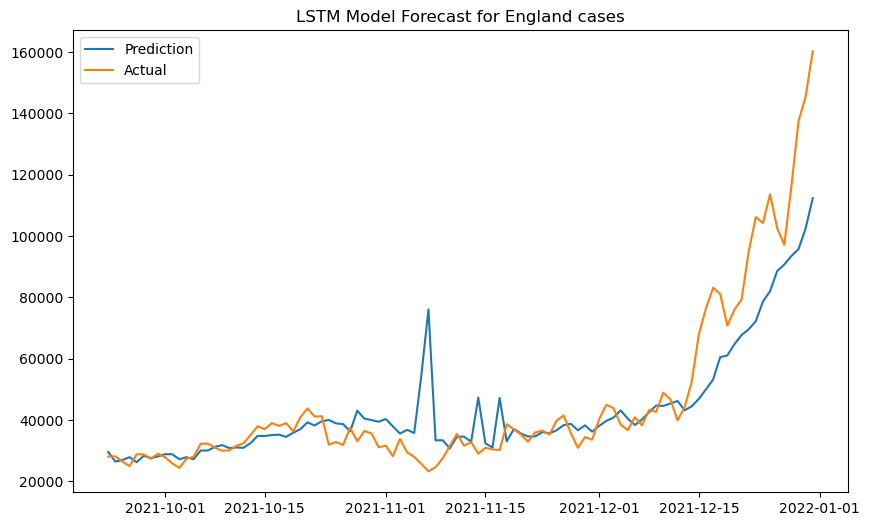

lstm_ec_mae:7848.28212890625, lstm_ec_mse:184255281.483336, lstm_ec_rmse:13574.06650504321


In [171]:
#England cases

ec_X_train, ec_X_val, ec_y_train, ec_y_val, ec_train_data = data_prep(england_cases['daily_cases'], 20)
#building lstm model
ec_model = Sequential()
ec_model.add(LSTM(64, activation='relu', input_shape=(20, 1)))
ec_model.add(Dense(1))

ec_model.compile(loss='mse', optimizer='adam')

# Train model
ec_model.fit(ec_train_data, epochs=100, verbose=0)

#model prediction

ec_forecast = ec_model.predict(ec_X_val)

ec_forecast_df = pd.DataFrame(ec_forecast)
ec_y_val_df = pd.DataFrame(ec_y_val)
ec_forecast_df.index = date_range_index
ec_y_val_df.index = date_range_index

#plot
plot_predictions(ec_forecast_df, ec_y_val_df, title="LSTM Model Forecast for England cases")
# evaluate
lstm_ec_mae, lstm_ec_mse, lstm_ec_rmse = evaluate_model(ec_y_val, ec_forecast)
print("lstm_ec_mae:{}, lstm_ec_mse:{}, lstm_ec_rmse:{}".format(lstm_ec_mae, lstm_ec_mse, lstm_ec_rmse))

4/4 [==============================] - 0s 4ms/step


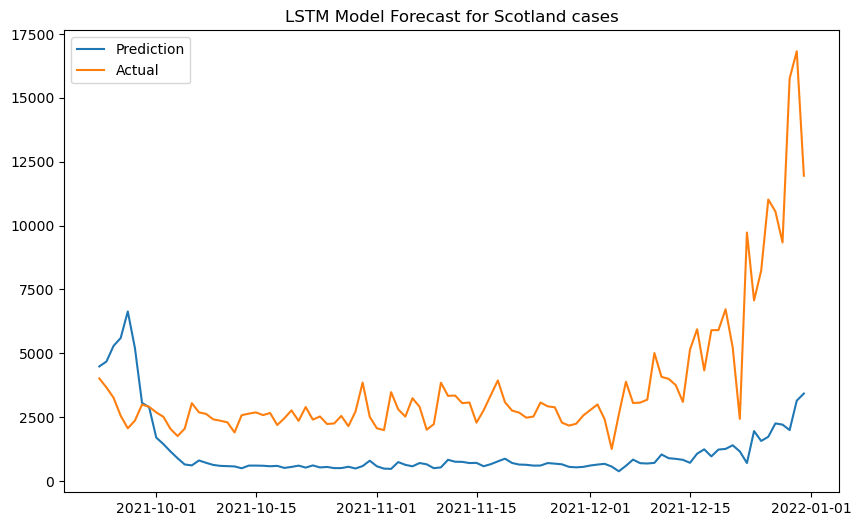

lstm_sc_mae:2840.812180786133, lstm_sc_mse:13487453.339581251, lstm_sc_rmse:3672.5268330648382


In [172]:
#Scotland cases

sc_X_train, sc_X_val, sc_y_train, sc_y_val, sc_train_data = data_prep(scotland_cases['daily_cases'], 20)
#building lstm model
sc_model = Sequential()
sc_model.add(LSTM(64, activation='relu', input_shape=(20, 1)))
sc_model.add(Dense(1))

sc_model.compile(loss='mse', optimizer='adam')

# Train model
sc_model.fit(sc_train_data, epochs=100, verbose=0)

# plot
sc_forecast = sc_model.predict(sc_X_val)
sc_forecast_df = pd.DataFrame(sc_forecast)
sc_y_val_df = pd.DataFrame(sc_y_val)
sc_forecast_df.index = date_range_index
sc_y_val_df.index = date_range_index

plot_predictions(sc_forecast_df, sc_y_val_df, title="LSTM Model Forecast for Scotland cases")
# evaluate
lstm_sc_mae, lstm_sc_mse, lstm_sc_rmse = evaluate_model(sc_y_val, sc_forecast)
print("lstm_sc_mae:{}, lstm_sc_mse:{}, lstm_sc_rmse:{}".format(lstm_sc_mae, lstm_sc_mse, lstm_sc_rmse))

4/4 [==============================] - 0s 7ms/step


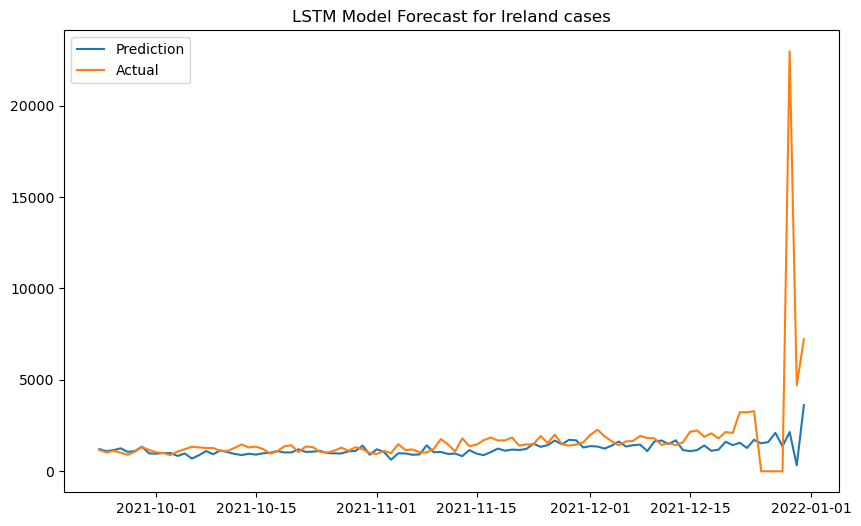

lstm_ic_mae:701.2783688354492, lstm_ic_mse:5018178.420841988, lstm_ic_rmse:2240.1291080743513


In [173]:
#Ireland cases

ic_X_train, ic_X_val, ic_y_train, ic_y_val, ic_train_data = data_prep(ireland_cases['daily_cases'], 20)
#building lstm model
ic_model = Sequential()
ic_model.add(LSTM(64, activation='relu', input_shape=(20, 1)))
ic_model.add(Dense(1))

ic_model.compile(loss='mse', optimizer='adam')

# Train model
ic_model.fit(ic_train_data, epochs=100, verbose=0)

# plot
ic_forecast = ic_model.predict(ic_X_val)
ic_forecast_df = pd.DataFrame(ic_forecast)
ic_y_val_df = pd.DataFrame(ic_y_val)
ic_forecast_df.index = date_range_index
ic_y_val_df.index = date_range_index

plot_predictions(ic_forecast_df, ic_y_val_df, title="LSTM Model Forecast for Ireland cases")
# evaluate
lstm_ic_mae, lstm_ic_mse, lstm_ic_rmse = evaluate_model(ic_y_val, ic_forecast)
print("lstm_ic_mae:{}, lstm_ic_mse:{}, lstm_ic_rmse:{}".format(lstm_ic_mae, lstm_ic_mse, lstm_ic_rmse))

4/4 [==============================] - 0s 3ms/step


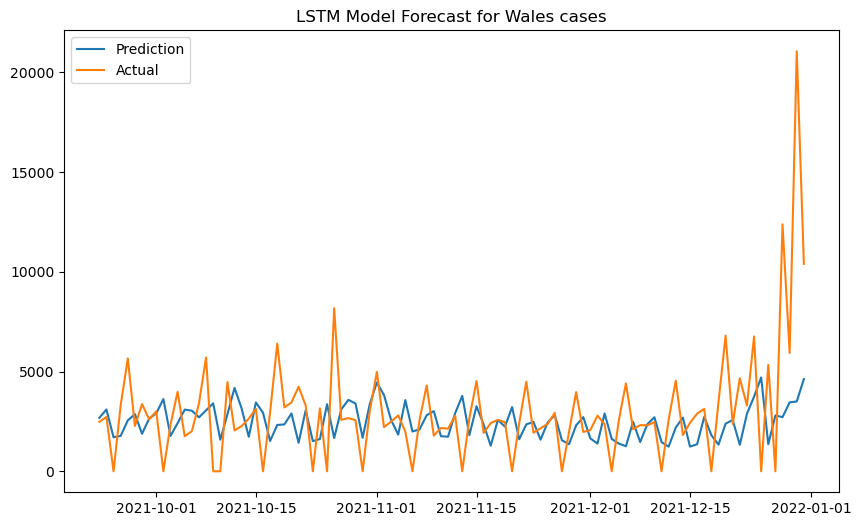

lstm_wc_mae:1734.451453857422, lstm_wc_mse:7870540.315997269, lstm_wc_rmse:2805.4483270944893


In [174]:
#Wales cases

wc_X_train, wc_X_val, wc_y_train, wc_y_val, wc_train_data = data_prep(wales_cases['daily_cases'], 20)
#building lstm model
wc_model = Sequential()
wc_model.add(LSTM(64, activation='relu', input_shape=(20, 1)))
wc_model.add(Dense(1))

wc_model.compile(loss='mse', optimizer='adam')

# Train model
wc_model.fit(wc_train_data, epochs=100, verbose=0)

# plot
wc_forecast = wc_model.predict(wc_X_val)
wc_forecast_df = pd.DataFrame(wc_forecast)
wc_y_val_df = pd.DataFrame(wc_y_val)
wc_forecast_df.index = date_range_index
wc_y_val_df.index = date_range_index

plot_predictions(wc_forecast_df, wc_y_val_df, title="LSTM Model Forecast for Wales cases")
# evaluate
lstm_wc_mae, lstm_wc_mse, lstm_wc_rmse = evaluate_model(wc_y_val, wc_forecast)
print("lstm_wc_mae:{}, lstm_wc_mse:{}, lstm_wc_rmse:{}".format(lstm_wc_mae, lstm_wc_mse, lstm_wc_rmse))

4/4 [==============================] - 0s 5ms/step


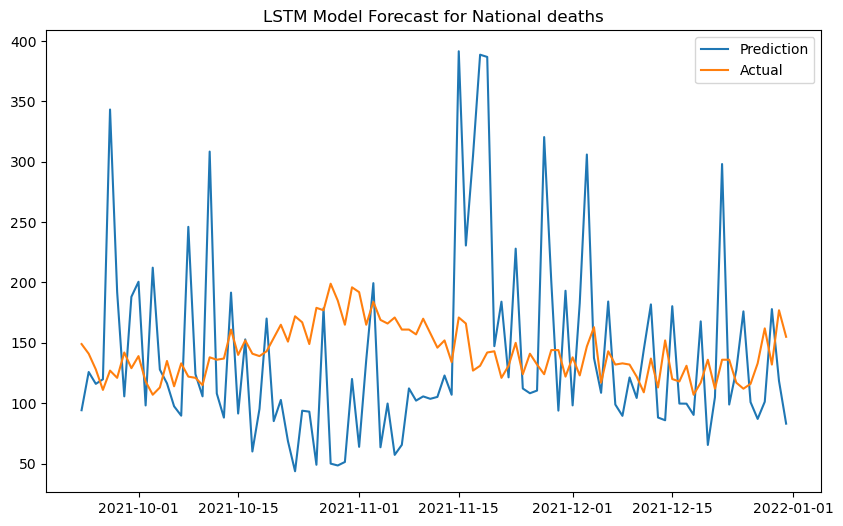

lstm_nd_mae:63.203958702087405, lstm_nd_mse:7043.739478513466, lstm_nd_rmse:83.92698897561776


In [175]:
#National deaths 

nd_X_train, nd_X_val, nd_y_train, nd_y_val, nd_train_data = data_prep(national_deaths['daily_deaths'], 20)
#building lstm model
nd_model = Sequential()
nd_model.add(LSTM(64, activation='relu', input_shape=(20, 1)))
nd_model.add(Dense(1))

nd_model.compile(loss='mse', optimizer='adam')

# Train model
nd_model.fit(nd_train_data, epochs=100, verbose=0)

# plot
nd_forecast = nd_model.predict(nd_X_val)
nd_forecast_df = pd.DataFrame(nd_forecast)
nd_y_val_df = pd.DataFrame(nd_y_val)
nd_forecast_df.index = date_range_index
nd_y_val_df.index = date_range_index

plot_predictions(nd_forecast_df, nd_y_val_df, title="LSTM Model Forecast for National deaths")
# evaluate
lstm_nd_mae, lstm_nd_mse, lstm_nd_rmse = evaluate_model(nd_y_val, nd_forecast)
print("lstm_nd_mae:{}, lstm_nd_mse:{}, lstm_nd_rmse:{}".format(lstm_nd_mae, lstm_nd_mse, lstm_nd_rmse))

4/4 [==============================] - 0s 5ms/step


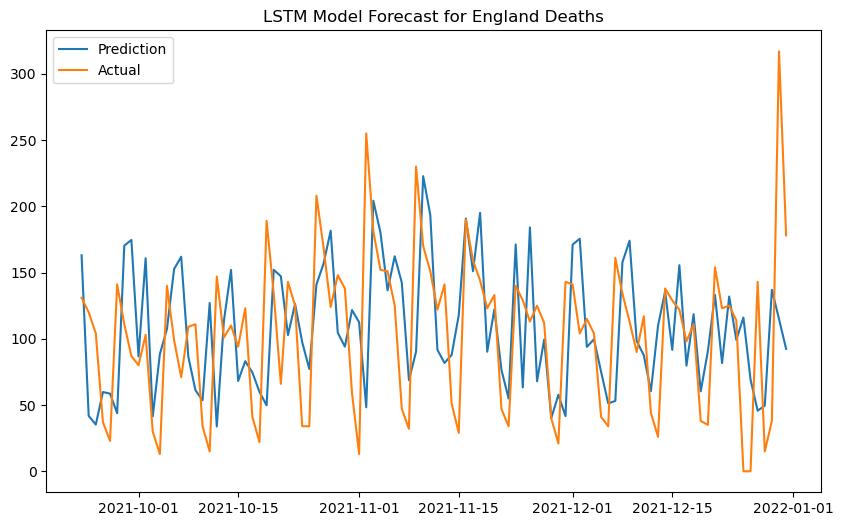

lstm_ed_mae:49.87461437225342, lstm_ed_mse:4029.2139369967813, lstm_ed_rmse:63.47608949042766


In [176]:
#England deaths

ed_X_train, ed_X_val, ed_y_train, ed_y_val, ed_train_data = data_prep(england_deaths['daily_deaths'], 20)
#building lstm model
ed_model = Sequential()
ed_model.add(LSTM(64, activation='relu', input_shape=(20, 1)))
ed_model.add(Dense(1))

ed_model.compile(loss='mse', optimizer='adam')

# Train model
ed_model.fit(ed_train_data, epochs=100, verbose=0)

# plot
ed_forecast = ed_model.predict(ed_X_val)

ed_forecast_df = pd.DataFrame(ed_forecast)
ed_y_val_df = pd.DataFrame(ed_y_val)
ed_forecast_df.index = date_range_index
ed_y_val_df.index = date_range_index
plot_predictions(ed_forecast_df, ed_y_val_df, title="LSTM Model Forecast for England Deaths")
# evaluate
lstm_ed_mae, lstm_ed_mse, lstm_ed_rmse = evaluate_model(ed_y_val, ed_forecast)
print("lstm_ed_mae:{}, lstm_ed_mse:{}, lstm_ed_rmse:{}".format(lstm_ed_mae, lstm_ed_mse, lstm_ed_rmse))

4/4 [==============================] - 0s 3ms/step


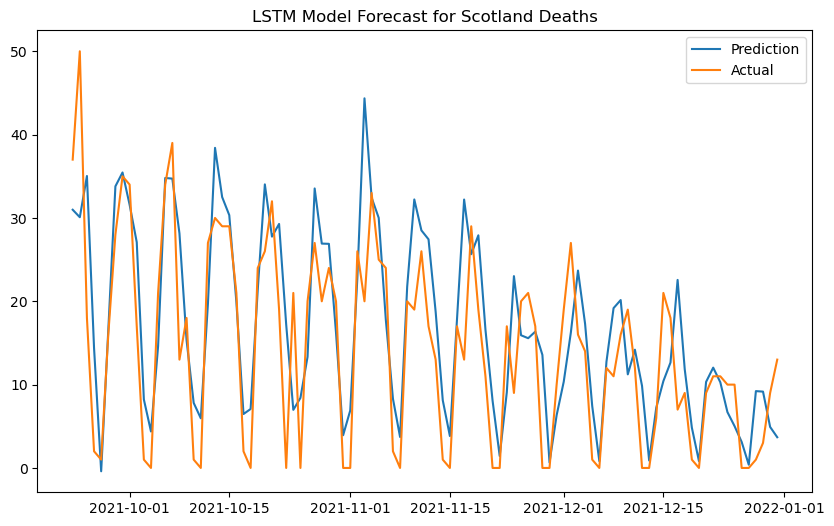

lstm_sd_mae:6.10903627038002, lstm_sd_mse:60.48240156126346, lstm_sd_rmse:7.777043240285054


In [177]:
#Scotland deaths

sd_X_train, sd_X_val, sd_y_train, sd_y_val, sd_train_data = data_prep(scotland_deaths['daily_deaths'], 20)
#building lstm model
sd_model = Sequential()
sd_model.add(LSTM(64, activation='relu', input_shape=(20, 1)))
sd_model.add(Dense(1))

sd_model.compile(loss='mse', optimizer='adam')

# Train model
sd_model.fit(sd_train_data, epochs=100, verbose=0)

# plot
sd_forecast = sd_model.predict(sd_X_val)
sd_forecast_df = pd.DataFrame(sd_forecast)
sd_y_val_df = pd.DataFrame(sd_y_val)
sd_forecast_df.index = date_range_index
sd_y_val_df.index = date_range_index
plot_predictions(sd_forecast_df, sd_y_val_df, title="LSTM Model Forecast for Scotland Deaths")
# evaluate
lstm_sd_mae, lstm_sd_mse, lstm_sd_rmse = evaluate_model(sd_y_val, sd_forecast)
print("lstm_sd_mae:{}, lstm_sd_mse:{}, lstm_sd_rmse:{}".format(lstm_sd_mae, lstm_sd_mse, lstm_sd_rmse))

4/4 [==============================] - 0s 4ms/step


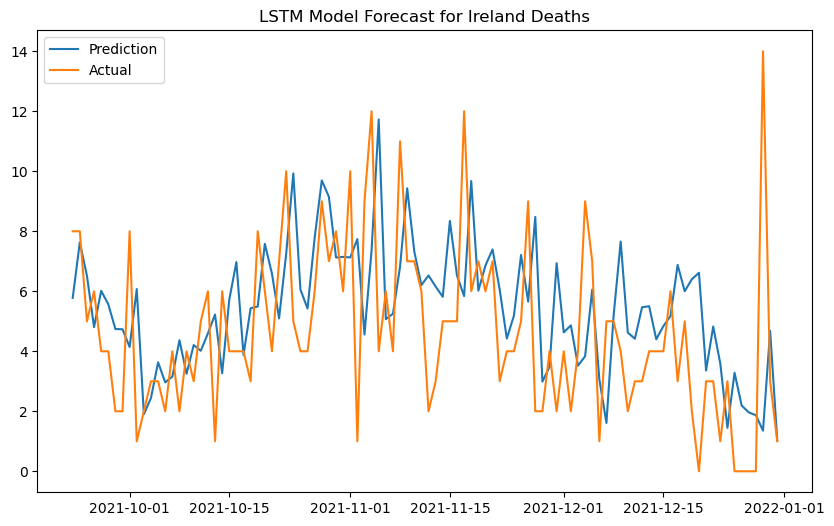

lstm_id_mae:2.3333527278900146, lstm_id_mse:9.292441383210736, lstm_id_rmse:3.048350600441284


In [178]:
#Ireland deaths

id_X_train, id_X_val, id_y_train, id_y_val, id_train_data = data_prep(ireland_deaths['daily_deaths'], 20)
#building lstm model
id_model = Sequential()
id_model.add(LSTM(64, activation='relu', input_shape=(20, 1)))
id_model.add(Dense(1))

id_model.compile(loss='mse', optimizer='adam')

# Train model
id_model.fit(id_train_data, epochs=100, verbose=0)

# plot
id_forecast = id_model.predict(id_X_val)
id_forecast_df = pd.DataFrame(id_forecast)
id_y_val_df = pd.DataFrame(id_y_val)
id_forecast_df.index = date_range_index
id_y_val_df.index = date_range_index
plot_predictions(id_forecast_df, id_y_val_df, title="LSTM Model Forecast for Ireland Deaths")
# evaluate
lstm_id_mae, lstm_id_mse, lstm_id_rmse = evaluate_model(id_y_val, id_forecast)
print("lstm_id_mae:{}, lstm_id_mse:{}, lstm_id_rmse:{}".format(lstm_id_mae, lstm_id_mse, lstm_id_rmse))

4/4 [==============================] - 0s 3ms/step


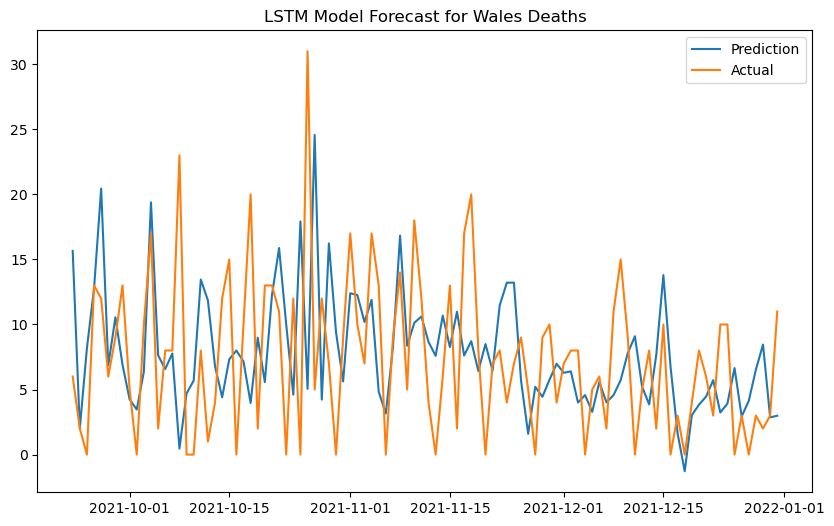

lstm_wd_mae:5.40139736533165, lstm_wd_mse:50.19905708573755, lstm_wd_rmse:7.0851292920974664


In [179]:
#Wales deaths

wd_X_train, wd_X_val, wd_y_train, wd_y_val, wd_train_data = data_prep(wales_deaths['daily_deaths'], 20)
#building lstm model
wd_model = Sequential()
wd_model.add(LSTM(64, activation='relu', input_shape=(20, 1)))
wd_model.add(Dense(1))

wd_model.compile(loss='mse', optimizer='adam')

# Train model
wd_model.fit(wd_train_data, epochs=100, verbose=0)

# plot
wd_forecast = wd_model.predict(wd_X_val)
wd_forecast_df = pd.DataFrame(wd_forecast)
wd_y_val_df = pd.DataFrame(wd_y_val)
wd_forecast_df.index = date_range_index
wd_y_val_df.index = date_range_index
plot_predictions(wd_forecast_df, wd_y_val_df, title="LSTM Model Forecast for Wales Deaths")
# evaluate
lstm_wd_mae, lstm_wd_mse, lstm_wd_rmse = evaluate_model(wd_y_val, wd_forecast)
print("lstm_wd_mae:{}, lstm_wd_mse:{}, lstm_wd_rmse:{}".format(lstm_wd_mae, lstm_wd_mse, lstm_wd_rmse))

# Cnn_LSTM Prediction

# National cases

4/4 [==============================] - 2s 9ms/step


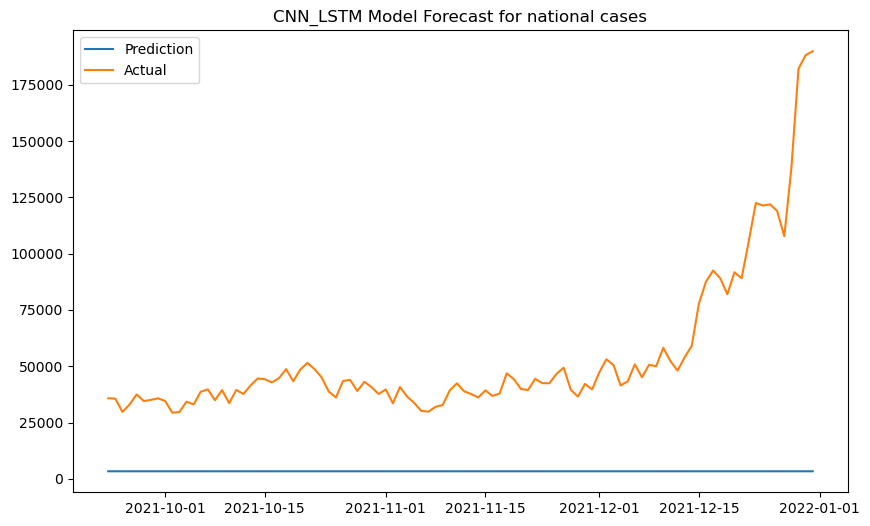

cnn_lstm_nc_mae:50716.03671630859, cnn_lstm_nc_mse:3661898224.464937, cnn_lstm_nc_rmse:60513.62015666338


In [180]:


# Model
cl_nc_model = Sequential([
    Conv1D(filters=64, kernel_size=3, strides=1, padding="causal", activation="relu", input_shape=[20, 1]),
    LSTM(64, return_sequences=True),
    LSTM(64),
    Dense(30, activation="relu"),
    Dense(10, activation="relu"),
    Dense(1)
])

# Compile model with optimizer and loss
cl_nc_model.compile(optimizer=tf.keras.optimizers.Adam(), loss='mse')

# Fit model
cl_nc_history = cl_nc_model.fit(nc_train_data, epochs=100, verbose=0)

cl_nc_forecast = cl_nc_model.predict(nc_X_val)
cl_nc_forecast_df = pd.DataFrame(cl_nc_forecast)
cl_nc_forecast_df.index = date_range_index


plot_predictions(cl_nc_forecast_df, nc_y_val_df, title="CNN_LSTM Model Forecast for national cases")
# evaluate
cnn_lstm_nc_mae, cnn_lstm_nc_mse, cnn_lstm_nc_rmse = evaluate_model(nc_y_val, cl_nc_forecast)
print("cnn_lstm_nc_mae:{}, cnn_lstm_nc_mse:{}, cnn_lstm_nc_rmse:{}".format(cnn_lstm_nc_mae, cnn_lstm_nc_mse, cnn_lstm_nc_rmse))

# England cases

4/4 [==============================] - 1s 6ms/step


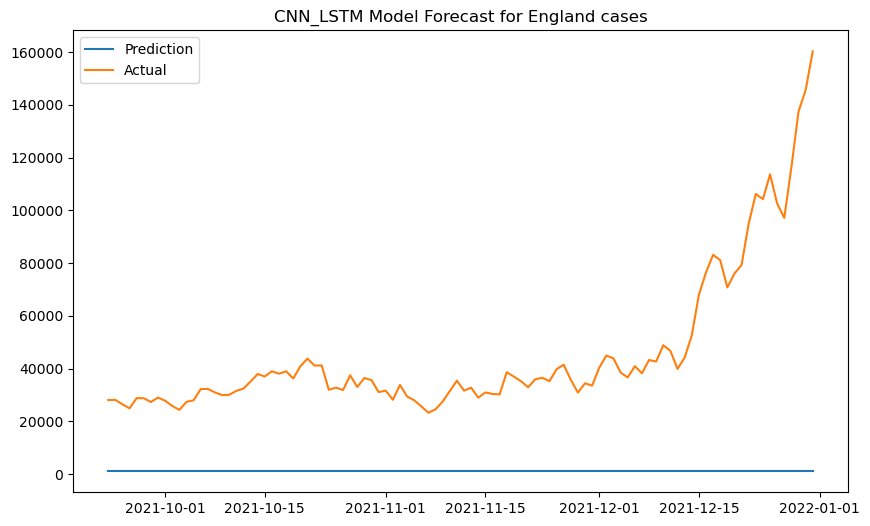

cnn_lstm_ec_mae:44504.12592895508, cnn_lstm_ec_mse:2751198774.2303867, cnn_lstm_ec_rmse:52451.87102697469


In [181]:


# Model
cl_ec_model = Sequential([
    Conv1D(filters=64, kernel_size=3, strides=1, padding="causal", activation="relu", input_shape=[20, 1]),
    LSTM(64, return_sequences=True),
    LSTM(64),
    Dense(30, activation="relu"),
    Dense(10, activation="relu"),
    Dense(1)
])

# Compile model with optimizer and loss
cl_ec_model.compile(optimizer=tf.keras.optimizers.Adam(), loss='mse')

# Fit model
cl_ec_history = cl_ec_model.fit(ec_train_data, epochs=100, verbose=0)

cl_ec_forecast = cl_ec_model.predict(ec_X_val)
cl_ec_forecast_df = pd.DataFrame(cl_ec_forecast)
cl_ec_forecast_df.index = date_range_index
plot_predictions(cl_ec_forecast_df, ec_y_val_df, title="CNN_LSTM Model Forecast for England cases")
# evaluate
cnn_lstm_ec_mae, cnn_lstm_ec_mse, cnn_lstm_ec_rmse = evaluate_model(ec_y_val, cl_ec_forecast)
print("cnn_lstm_ec_mae:{}, cnn_lstm_ec_mse:{}, cnn_lstm_ec_rmse:{}".format(cnn_lstm_ec_mae, cnn_lstm_ec_mse, cnn_lstm_ec_rmse))

# Scotland cases

4/4 [==============================] - 1s 5ms/step


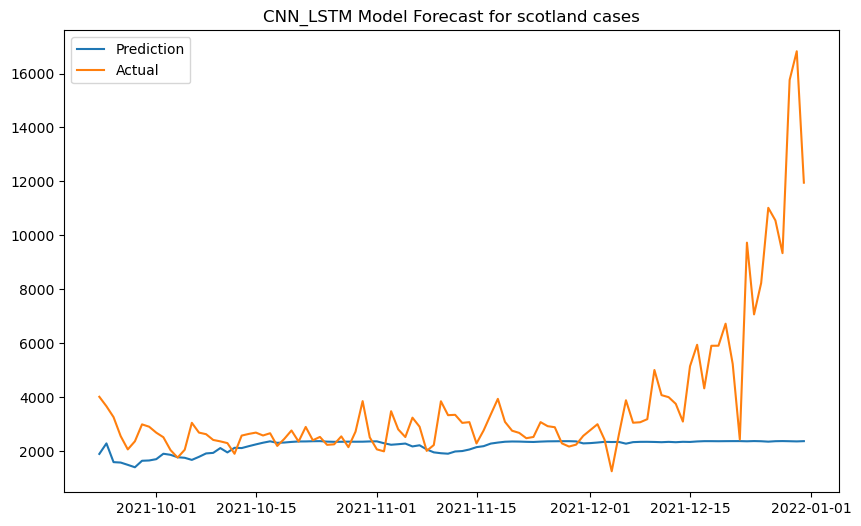

cnn_lstm_sc_mae:1584.1386657714843, cnn_lstm_sc_mse:9238156.682664746, cnn_lstm_sc_rmse:3039.433612149597


In [182]:


# Model
cl_sc_model = Sequential([
    Conv1D(filters=64, kernel_size=3, strides=1, padding="causal", activation="relu", input_shape=[20, 1]),
    LSTM(64, return_sequences=True),
    LSTM(64),
    Dense(30, activation="relu"),
    Dense(10, activation="relu"),
    Dense(1)
])

# Compile model with optimizer and loss
cl_sc_model.compile(optimizer=tf.keras.optimizers.Adam(), loss='mse')

# Fit model
cl_sc_history = cl_sc_model.fit(sc_train_data, epochs=100, verbose=0)

cl_sc_forecast = cl_sc_model.predict(sc_X_val)
cl_sc_forecast_df = pd.DataFrame(cl_sc_forecast)
cl_sc_forecast_df.index = date_range_index
plot_predictions(cl_sc_forecast_df, sc_y_val_df, title="CNN_LSTM Model Forecast for scotland cases")
# evaluate
cnn_lstm_sc_mae, cnn_lstm_sc_mse, cnn_lstm_sc_rmse = evaluate_model(sc_y_val, cl_sc_forecast)
print("cnn_lstm_sc_mae:{}, cnn_lstm_sc_mse:{}, cnn_lstm_sc_rmse:{}".format(cnn_lstm_sc_mae, cnn_lstm_sc_mse, cnn_lstm_sc_rmse))

Ireland Cases

4/4 [==============================] - 1s 10ms/step


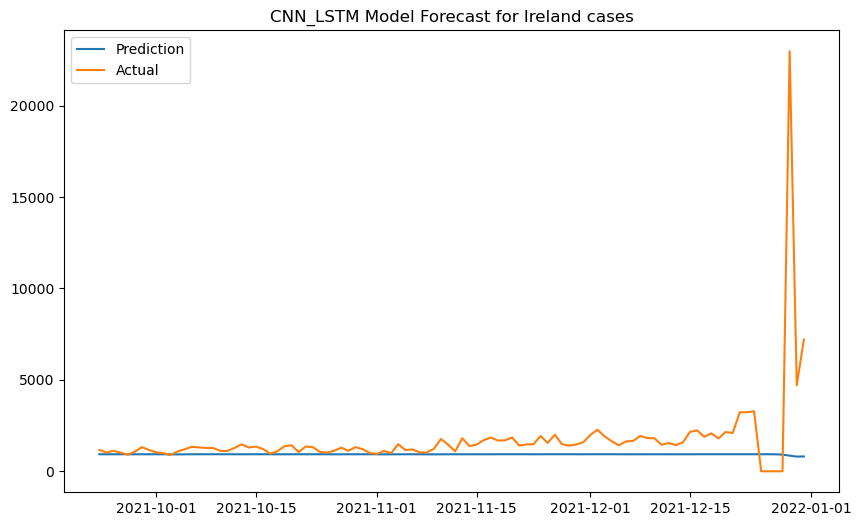

cnn_lstm_ic_mae:874.1323413085937, cnn_lstm_ic_mse:5973849.650455522, cnn_lstm_ic_rmse:2444.145996141704


In [183]:


# Model
cl_ic_model = Sequential([
    Conv1D(filters=64, kernel_size=3, strides=1, padding="causal", activation="relu", input_shape=[20, 1]),
    LSTM(64, return_sequences=True),
    LSTM(64),
    Dense(30, activation="relu"),
    Dense(10, activation="relu"),
    Dense(1)
])

# Compile model with optimizer and loss
cl_ic_model.compile(optimizer=tf.keras.optimizers.Adam(), loss='mse')

# Fit model
cl_ic_history = cl_ic_model.fit(ic_train_data, epochs=100, verbose=0)

cl_ic_forecast = cl_ic_model.predict(ic_X_val)
cl_ic_forecast_df = pd.DataFrame(cl_ic_forecast)
cl_ic_forecast_df.index = date_range_index
plot_predictions(cl_ic_forecast_df, ic_y_val_df, title="CNN_LSTM Model Forecast for Ireland cases")
# evaluate
cnn_lstm_ic_mae, cnn_lstm_ic_mse, cnn_lstm_ic_rmse = evaluate_model(ic_y_val, cl_ic_forecast)
print("cnn_lstm_ic_mae:{}, cnn_lstm_ic_mse:{}, cnn_lstm_ic_rmse:{}".format(cnn_lstm_ic_mae, cnn_lstm_ic_mse, cnn_lstm_ic_rmse))

# wales cases

4/4 [==============================] - 1s 5ms/step


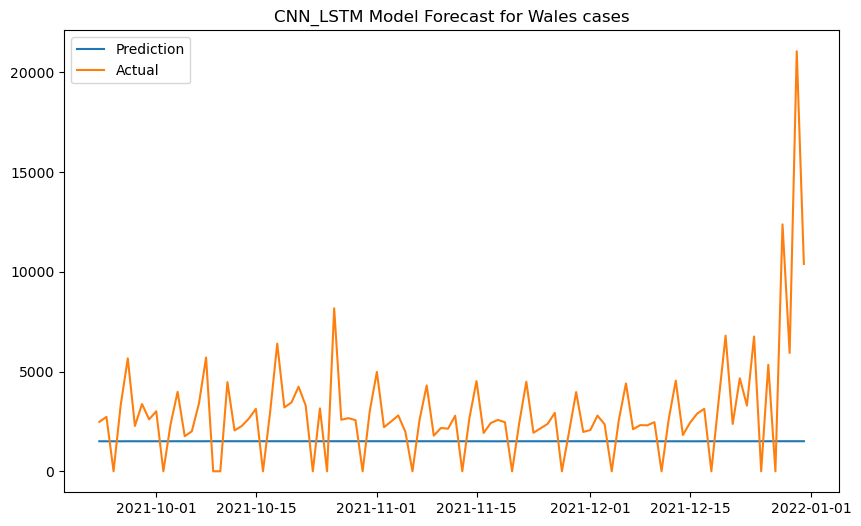

cnn_lstm_wc_mae:1996.4701831054688, cnn_lstm_wc_mse:9846183.423007427, cnn_lstm_wc_rmse:3137.862875112204


In [184]:


# Model
cl_wc_model = Sequential([
    Conv1D(filters=64, kernel_size=3, strides=1, padding="causal", activation="relu", input_shape=[20, 1]),
    LSTM(64, return_sequences=True),
    LSTM(64),
    Dense(30, activation="relu"),
    Dense(10, activation="relu"),
    Dense(1)
])

# Compile model with optimizer and loss
cl_wc_model.compile(optimizer=tf.keras.optimizers.Adam(), loss='mse')

# Fit model
cl_wc_history = cl_wc_model.fit(wc_train_data, epochs=100, verbose=0)

cl_wc_forecast = cl_wc_model.predict(wc_X_val)
cl_wc_forecast_df = pd.DataFrame(cl_wc_forecast)
cl_wc_forecast_df.index = date_range_index
plot_predictions(cl_wc_forecast_df, wc_y_val_df, title="CNN_LSTM Model Forecast for Wales cases")
# evaluate
cnn_lstm_wc_mae, cnn_lstm_wc_mse, cnn_lstm_wc_rmse = evaluate_model(wc_y_val, cl_wc_forecast)
print("cnn_lstm_wc_mae:{}, cnn_lstm_wc_mse:{}, cnn_lstm_wc_rmse:{}".format(cnn_lstm_wc_mae, cnn_lstm_wc_mse, cnn_lstm_wc_rmse))

# Deaths Predictions

4/4 [==============================] - 1s 7ms/step


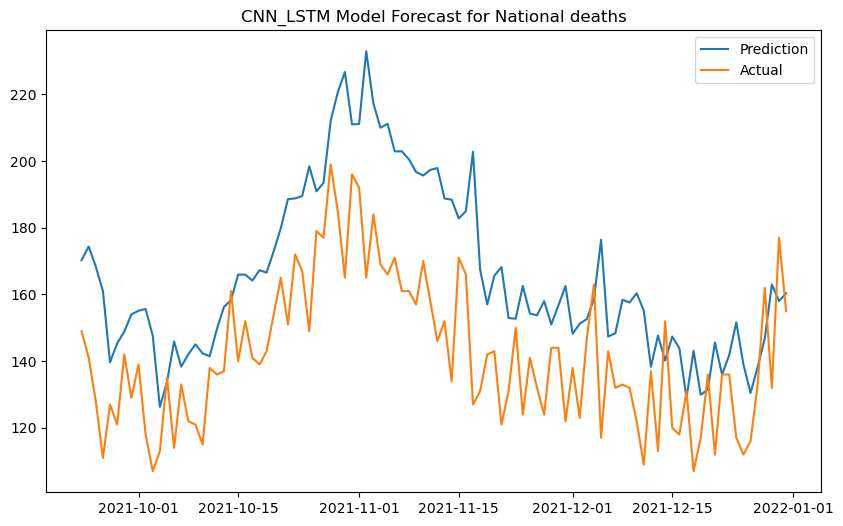

cnn_lstm_nd_mae:24.990337448120115, cnn_lstm_nd_mse:877.6274854216474, cnn_lstm_nd_rmse:29.62477823413447


In [185]:


# Model
cl_nd_model = Sequential([
    Conv1D(filters=64, kernel_size=3, strides=1, padding="causal", activation="relu", input_shape=[20, 1]),
    LSTM(64, return_sequences=True),
    LSTM(64),
    Dense(30, activation="relu"),
    Dense(10, activation="relu"),
    Dense(1)
])

# Compile model with optimizer and loss
cl_nd_model.compile(optimizer=tf.keras.optimizers.Adam(), loss='mse')

# Fit model
cl_nd_history = cl_nd_model.fit(nd_train_data, epochs=100, verbose=0)

cl_nd_forecast = cl_nd_model.predict(nd_X_val)
cl_nd_forecast_df = pd.DataFrame(cl_nd_forecast)
cl_nd_forecast_df.index = date_range_index
plot_predictions(cl_nd_forecast_df, nd_y_val_df, title="CNN_LSTM Model Forecast for National deaths")
# evaluate
cnn_lstm_nd_mae, cnn_lstm_nd_mse, cnn_lstm_nd_rmse = evaluate_model(nd_y_val, cl_nd_forecast)
print("cnn_lstm_nd_mae:{}, cnn_lstm_nd_mse:{}, cnn_lstm_nd_rmse:{}".format(cnn_lstm_nd_mae, cnn_lstm_nd_mse, cnn_lstm_nd_rmse))

# England Deaths

4/4 [==============================] - 1s 5ms/step


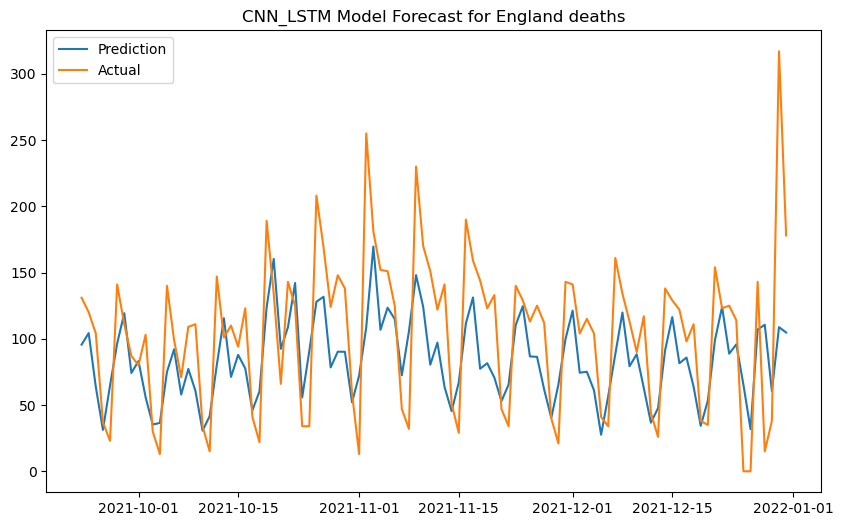

cnn_lstm_ed_mae:37.10309099197388, cnn_lstm_ed_mse:2298.2016268346542, cnn_lstm_ed_rmse:47.939562230319275


In [186]:


# Model
cl_ed_model = Sequential([
    Conv1D(filters=64, kernel_size=3, strides=1, padding="causal", activation="relu", input_shape=[20, 1]),
    LSTM(64, return_sequences=True),
    LSTM(64),
    Dense(30, activation="relu"),
    Dense(10, activation="relu"),
    Dense(1)
])

# Compile model with optimizer and loss
cl_ed_model.compile(optimizer=tf.keras.optimizers.Adam(), loss='mse')

# Fit model
cl_ed_history = cl_ed_model.fit(ed_train_data, epochs=100, verbose=0)

cl_ed_forecast = cl_ed_model.predict(ed_X_val)
cl_ed_forecast_df = pd.DataFrame(cl_ed_forecast)
cl_ed_forecast_df.index = date_range_index

plot_predictions(cl_ed_forecast_df, ed_y_val_df, title="CNN_LSTM Model Forecast for England deaths")
# evaluate
cnn_lstm_ed_mae, cnn_lstm_ed_mse, cnn_lstm_ed_rmse = evaluate_model(ed_y_val, cl_ed_forecast)
print("cnn_lstm_ed_mae:{}, cnn_lstm_ed_mse:{}, cnn_lstm_ed_rmse:{}".format(cnn_lstm_ed_mae, cnn_lstm_ed_mse, cnn_lstm_ed_rmse))

# Scotland Deaths

4/4 [==============================] - 1s 5ms/step


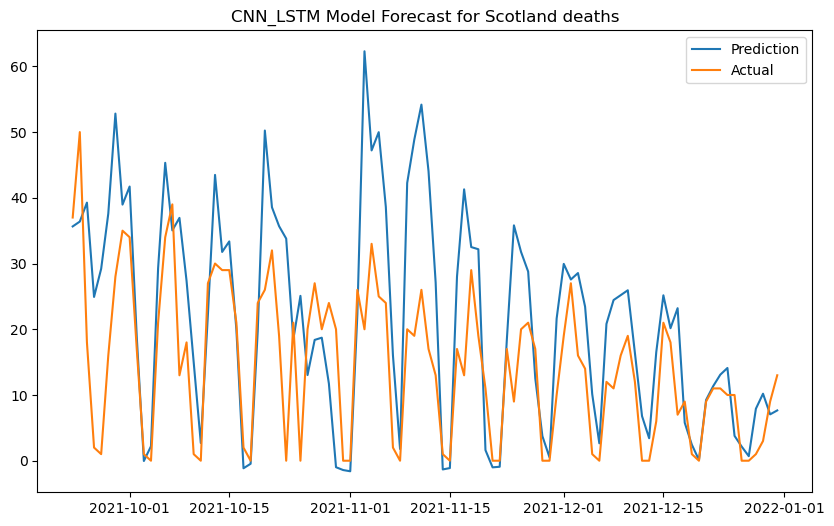

cnn_lstm_sd_mae:9.697298188209533, cnn_lstm_sd_mse:178.47134946913187, cnn_lstm_sd_rmse:13.359316953689357


In [187]:


# Model
cl_sd_model = Sequential([
    Conv1D(filters=64, kernel_size=3, strides=1, padding="causal", activation="relu", input_shape=[20, 1]),
    LSTM(64, return_sequences=True),
    LSTM(64),
    Dense(30, activation="relu"),
    Dense(10, activation="relu"),
    Dense(1)
])

# Compile model with optimizer and loss
cl_sd_model.compile(optimizer=tf.keras.optimizers.Adam(), loss='mse')

# Fit model
cl_sd_history = cl_sd_model.fit(sd_train_data, epochs=100, verbose=0)

cl_sd_forecast = cl_sd_model.predict(sd_X_val)
cl_sd_forecast_df = pd.DataFrame(cl_sd_forecast)
cl_sd_forecast_df.index = date_range_index

plot_predictions(cl_sd_forecast_df, sd_y_val_df, title="CNN_LSTM Model Forecast for Scotland deaths")
# evaluate
cnn_lstm_sd_mae, cnn_lstm_sd_mse, cnn_lstm_sd_rmse = evaluate_model(sd_y_val, cl_sd_forecast)
print("cnn_lstm_sd_mae:{}, cnn_lstm_sd_mse:{}, cnn_lstm_sd_rmse:{}".format(cnn_lstm_sd_mae, cnn_lstm_sd_mse, cnn_lstm_sd_rmse))

# Ireland Deaths

4/4 [==============================] - 1s 10ms/step


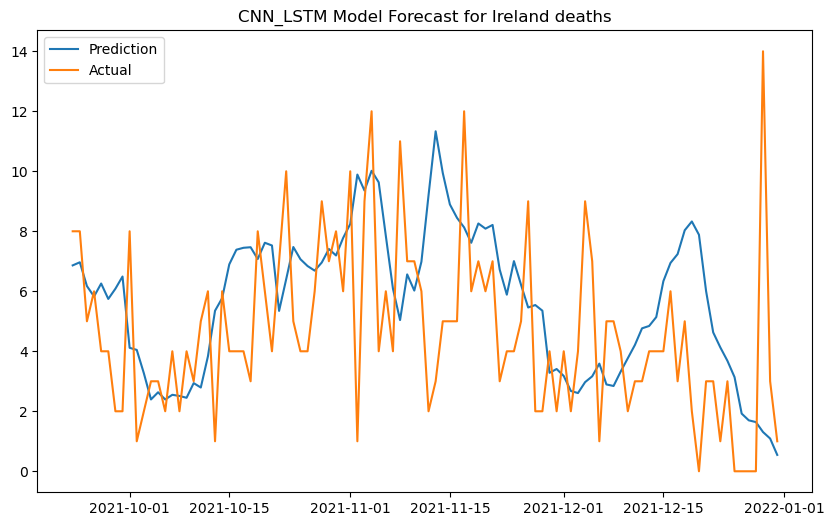

cnn_lstm_id_mae:2.52662749171257, cnn_lstm_id_mse:10.739230998291264, cnn_lstm_id_rmse:3.277076593290316


In [188]:


# Model
cl_id_model = Sequential([
    Conv1D(filters=64, kernel_size=3, strides=1, padding="causal", activation="relu", input_shape=[20, 1]),
    LSTM(64, return_sequences=True),
    LSTM(64),
    Dense(30, activation="relu"),
    Dense(10, activation="relu"),
    Dense(1)
])

# Compile model with optimizer and loss
cl_id_model.compile(optimizer=tf.keras.optimizers.Adam(), loss='mse')

# Fit model
cl_id_history = cl_id_model.fit(id_train_data, epochs=100, verbose=0)

cl_id_forecast = cl_id_model.predict(id_X_val)
cl_id_forecast_df = pd.DataFrame(cl_id_forecast)
cl_id_forecast_df.index = date_range_index

plot_predictions(cl_id_forecast_df, id_y_val_df, title="CNN_LSTM Model Forecast for Ireland deaths")
# evaluate
cnn_lstm_id_mae, cnn_lstm_id_mse, cnn_lstm_id_rmse = evaluate_model(id_y_val, cl_id_forecast)
print("cnn_lstm_id_mae:{}, cnn_lstm_id_mse:{}, cnn_lstm_id_rmse:{}".format(cnn_lstm_id_mae, cnn_lstm_id_mse, cnn_lstm_id_rmse))

# Wales Deaths

4/4 [==============================] - 1s 5ms/step


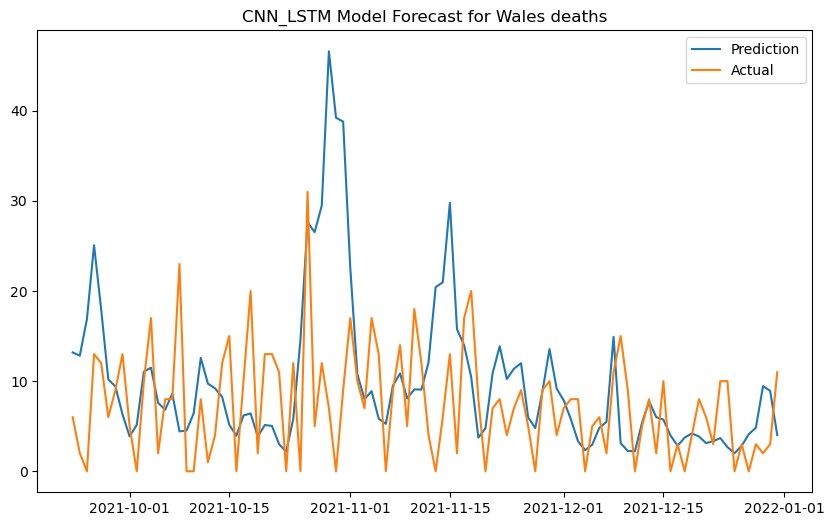

cnn_lstm_wd_mae:6.551889514923095, cnn_lstm_wd_mse:92.5704790494707, cnn_lstm_wd_rmse:9.621355364472862


In [189]:


# Model
cl_wd_model = Sequential([
    Conv1D(filters=64, kernel_size=3, strides=1, padding="causal", activation="relu", input_shape=[20, 1]),
    LSTM(64, return_sequences=True),
    LSTM(64),
    Dense(30, activation="relu"),
    Dense(10, activation="relu"),
    Dense(1)
])

# Compile model with optimizer and loss
cl_wd_model.compile(optimizer=tf.keras.optimizers.Adam(), loss='mse')

# Fit model
cl_wd_history = cl_wd_model.fit(wd_train_data, epochs=100, verbose=0)

cl_wd_forecast = cl_wd_model.predict(wd_X_val)
cl_wd_forecast_df = pd.DataFrame(cl_wd_forecast)
cl_wd_forecast_df.index = date_range_index

plot_predictions(cl_wd_forecast_df, wd_y_val_df, title="CNN_LSTM Model Forecast for Wales deaths")
# evaluate
cnn_lstm_wd_mae, cnn_lstm_wd_mse, cnn_lstm_wd_rmse = evaluate_model(wd_y_val, cl_wd_forecast)
print("cnn_lstm_wd_mae:{}, cnn_lstm_wd_mse:{}, cnn_lstm_wd_rmse:{}".format(cnn_lstm_wd_mae, cnn_lstm_wd_mse, cnn_lstm_wd_rmse))

#getting a collection of all the variables in the notebook

In [190]:
variables = %who_ls
variables

['ARIMA',
 'Conv1D',
 'Dense',
 'LSTM',
 'ParameterGrid',
 'Prophet',
 'Sequential',
 'adfuller',
 'arima',
 'arima_parameters',
 'autocorrelation_plot',
 'best_aic',
 'cl_ec_forecast',
 'cl_ec_forecast_df',
 'cl_ec_history',
 'cl_ec_model',
 'cl_ed_forecast',
 'cl_ed_forecast_df',
 'cl_ed_history',
 'cl_ed_model',
 'cl_ic_forecast',
 'cl_ic_forecast_df',
 'cl_ic_history',
 'cl_ic_model',
 'cl_id_forecast',
 'cl_id_forecast_df',
 'cl_id_history',
 'cl_id_model',
 'cl_nc_forecast',
 'cl_nc_forecast_df',
 'cl_nc_history',
 'cl_nc_model',
 'cl_nd_forecast',
 'cl_nd_forecast_df',
 'cl_nd_history',
 'cl_nd_model',
 'cl_sc_forecast',
 'cl_sc_forecast_df',
 'cl_sc_history',
 'cl_sc_model',
 'cl_sd_forecast',
 'cl_sd_forecast_df',
 'cl_sd_history',
 'cl_sd_model',
 'cl_wc_forecast',
 'cl_wc_forecast_df',
 'cl_wc_history',
 'cl_wc_model',
 'cl_wd_forecast',
 'cl_wd_forecast_df',
 'cl_wd_history',
 'cl_wd_model',
 'cnn_lstm_ec_mae',
 'cnn_lstm_ec_mse',
 'cnn_lstm_ec_rmse',
 'cnn_lstm_ed_mae',
 '

In [191]:
#collecting the tables for the different evaluation metrics for england
england_cases_error = {'model': ['Arima', 'Prophet', 'LSTM', 'CNN_LSTM'],
                  'mae': [england_cases_day_1_mae,england_cases_day_1_mae_pro, lstm_ec_mae, cnn_lstm_ec_mae],
                    'mse': [england_cases_day_1_mse, england_cases_day_1_mse_pro, lstm_ec_mse, cnn_lstm_ec_mse],
                    'rmse':[england_cases_day_1_rmse, england_cases_day_1_rmse_pro, lstm_ec_rmse, cnn_lstm_ec_rmse]
    
}
england_cases_df = pd.DataFrame(england_cases_error)

In [192]:
england_cases_df

,model,mae,mse,rmse
0,Arima,3855.750563,3.051311e+07,5523.867187
1,Prophet,60468.872869,4.524196e+09,67262.146642
2,LSTM,7848.282129,1.842553e+08,13574.066505
3,CNN_LSTM,44504.125929,2.751199e+09,52451.871027


In [193]:
#collecting the tables for the different evaluation metrics for scotland
scotland_cases_error = {'model': ['Arima', 'Prophet', 'LSTM', 'CNN_LSTM'],
                  'mae': [scotland_cases_day_1_mae,scotland_cases_day_1_mae_pro, lstm_sc_mae, cnn_lstm_sc_mae],
                    'mse': [scotland_cases_day_1_mse, scotland_cases_day_1_mse_pro, lstm_sc_mse, cnn_lstm_sc_mse],
                    'rmse':[scotland_cases_day_1_rmse, scotland_cases_day_1_rmse_pro, lstm_sc_rmse, cnn_lstm_sc_rmse]
    
}
scotland_cases_df = pd.DataFrame(scotland_cases_error)

In [194]:
scotland_cases_df

,model,mae,mse,rmse
0,Arima,770.060090,1.627667e+06,1275.800686
1,Prophet,4624.738551,2.912726e+07,5396.967850
2,LSTM,2840.812181,1.348745e+07,3672.526833
3,CNN_LSTM,1584.138666,9.238157e+06,3039.433612


In [195]:
#collecting the tables for the different evaluation metrics for ireland
ireland_cases_error = {'model': ['Arima', 'Prophet', 'LSTM', 'CNN_LSTM'],
                  'mae': [ireland_cases_day_1_mae,ireland_cases_day_1_mae_pro, lstm_ic_mae, cnn_lstm_ic_mae],
                    'mse': [ireland_cases_day_1_mse, ireland_cases_day_1_mse_pro, lstm_ic_mse, cnn_lstm_ic_mse],
                    'rmse':[ireland_cases_day_1_rmse, ireland_cases_day_1_rmse_pro, lstm_ic_rmse, cnn_lstm_ic_rmse]
    
}
ireland_cases_df = pd.DataFrame(ireland_cases_error)

In [196]:
ireland_cases_df

,model,mae,mse,rmse
0,Arima,866.254897,1.612381e+07,4015.446287
1,Prophet,2062.976111,9.608829e+06,3099.811189
2,LSTM,701.278369,5.018178e+06,2240.129108
3,CNN_LSTM,874.132341,5.973850e+06,2444.145996


In [197]:
#collecting the tables for the different evaluation metrics for wales
wales_cases_error = {'model': ['Arima', 'Prophet', 'LSTM', 'CNN_LSTM'],
                  'mae': [wales_cases_day_1_mae, wales_cases_day_1_mae_pro, lstm_wc_mae, cnn_lstm_wc_mae],
                    'mse': [wales_cases_day_1_mse, wales_cases_day_1_mse_pro, lstm_wc_mse, cnn_lstm_wc_mse],
                    'rmse':[wales_cases_day_1_rmse, wales_cases_day_1_rmse_pro, lstm_wc_rmse, cnn_lstm_wc_rmse]
    
}
wales_cases_df = pd.DataFrame(wales_cases_error)

In [198]:
wales_cases_df

,model,mae,mse,rmse
0,Arima,1588.427895,6.502093e+06,2549.920263
1,Prophet,3642.410116,2.107647e+07,4590.911457
2,LSTM,1734.451454,7.870540e+06,2805.448327
3,CNN_LSTM,1996.470183,9.846183e+06,3137.862875


In [199]:
#collecting the tables for the different evaluation metrics for national
national_cases_error = {'model': ['Arima', 'Prophet', 'LSTM', 'CNN_LSTM'],
                  'mae': [national_cases_day_1_mae, national_cases_day_1_mae_pro, lstm_nc_mae, cnn_lstm_nc_mae],
                    'mse': [national_cases_day_1_mse, national_cases_day_1_mse_pro, lstm_nc_mse, cnn_lstm_nc_mse],
                    'rmse':[national_cases_day_1_rmse, national_cases_day_1_rmse_pro, lstm_nc_rmse, cnn_lstm_nc_rmse]
    
}
national_cases_df = pd.DataFrame(national_cases_error)

In [200]:
national_cases_df 

,model,mae,mse,rmse
0,Arima,4585.788241,5.426627e+07,7366.564004
1,Prophet,70925.900305,6.249727e+09,79055.215477
2,LSTM,6711.531172,1.325965e+08,11515.054529
3,CNN_LSTM,50716.036716,3.661898e+09,60513.620157


# Deaths errors

In [201]:
#collecting the tables for the different evaluation metrics for england
england_deaths_error = {'model': ['Arima', 'Prophet', 'LSTM', 'CNN_LSTM'],
                  'mae': [england_deaths_day_1_mae,england_deaths_day_1_mae_pro, lstm_ed_mae, cnn_lstm_ed_mae],
                    'mse': [england_deaths_day_1_mse, england_deaths_day_1_mse_pro, lstm_ed_mse, cnn_lstm_ed_mse],
                    'rmse':[england_deaths_day_1_rmse, england_deaths_day_1_rmse_pro, lstm_ed_rmse, cnn_lstm_ed_rmse]
    
}
england_deaths_df = pd.DataFrame(england_deaths_error)

In [202]:
england_deaths_df

,model,mae,mse,rmse
0,Arima,22.472515,1259.848088,35.494339
1,Prophet,985.491259,990474.964499,995.226087
2,LSTM,49.874614,4029.213937,63.476089
3,CNN_LSTM,37.103091,2298.201627,47.939562


In [203]:
#collecting the tables for the different evaluation metrics for scotland
scotland_deaths_error = {'model': ['Arima', 'Prophet', 'LSTM', 'CNN_LSTM'],
                  'mae': [scotland_deaths_day_1_mae,scotland_deaths_day_1_mae_pro, lstm_sd_mae, cnn_lstm_sd_mae],
                    'mse': [scotland_deaths_day_1_mse, scotland_deaths_day_1_mse_pro, lstm_sd_mse, cnn_lstm_sd_mse],
                    'rmse':[scotland_deaths_day_1_rmse, scotland_deaths_day_1_rmse_pro, lstm_sd_rmse, cnn_lstm_sd_rmse]
    
}
scotland_deaths_df = pd.DataFrame(scotland_deaths_error)

In [204]:
scotland_deaths_df

,model,mae,mse,rmse
0,Arima,5.300297,44.989238,6.707402
1,Prophet,91.969247,8545.442737,92.441564
2,LSTM,6.109036,60.482402,7.777043
3,CNN_LSTM,9.697298,178.471349,13.359317


In [205]:
#collecting the tables for the different evaluation metrics for ireland
ireland_deaths_error = {'model': ['Arima', 'Prophet', 'LSTM', 'CNN_LSTM'],
                  'mae': [ireland_deaths_day_1_mae,ireland_deaths_day_1_mae_pro, lstm_id_mae, cnn_lstm_id_mae],
                    'mse': [ireland_deaths_day_1_mse, ireland_deaths_day_1_mse_pro, lstm_id_mse, cnn_lstm_id_mse],
                    'rmse':[ireland_deaths_day_1_rmse, ireland_deaths_day_1_rmse_pro, lstm_id_rmse, cnn_lstm_id_rmse]
    
}
ireland_deaths_df = pd.DataFrame(ireland_deaths_error)

In [206]:
ireland_deaths_df

,model,mae,mse,rmse
0,Arima,2.185222,9.082034,3.013641
1,Prophet,16.142756,269.828656,16.426462
2,LSTM,2.333353,9.292441,3.048351
3,CNN_LSTM,2.526627,10.739231,3.277077


In [207]:
#collecting the tables for the different evaluation metrics for wales
wales_deaths_error = {'model': ['Arima', 'Prophet', 'LSTM', 'CNN_LSTM'],
                  'mae': [wales_deaths_day_1_mae,wales_deaths_day_1_mae_pro, lstm_wd_mae, cnn_lstm_wd_mae],
                    'mse': [wales_deaths_day_1_mse, wales_deaths_day_1_mse_pro, lstm_wd_mse, cnn_lstm_wd_mse],
                    'rmse':[wales_deaths_day_1_rmse, wales_deaths_day_1_rmse_pro, lstm_wd_rmse, cnn_lstm_wd_rmse]
    
}
wales_deaths_df = pd.DataFrame(wales_deaths_error)

In [208]:
wales_deaths_df

,model,mae,mse,rmse
0,Arima,4.756790,45.313502,6.731530
1,Prophet,44.135784,2012.781766,44.864036
2,LSTM,5.401397,50.199057,7.085129
3,CNN_LSTM,6.551890,92.570479,9.621355


In [209]:
#collecting the tables for the different evaluation metrics for national
national_deaths_error = {'model': ['Arima', 'Prophet', 'LSTM', 'CNN_LSTM'],
                  'mae': [national_deaths_day_1_mae,national_deaths_day_1_mae_pro, lstm_nd_mae, cnn_lstm_nd_mae],
                    'mse': [national_deaths_day_1_mse, national_deaths_day_1_mse_pro, lstm_nd_mse, cnn_lstm_nd_mse],
                    'rmse':[national_deaths_day_1_rmse, national_deaths_day_1_rmse_pro, lstm_nd_rmse, cnn_lstm_nd_rmse]
    
}
national_deaths_df = pd.DataFrame(national_deaths_error)

In [210]:
national_deaths_df

,model,mae,mse,rmse
0,Arima,14.759935,3.288527e+02,18.134296
1,Prophet,1144.268470,1.331151e+06,1153.755345
2,LSTM,63.203959,7.043739e+03,83.926989
3,CNN_LSTM,24.990337,8.776275e+02,29.624778
